In [42]:
import datetime
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from dateutil.relativedelta import relativedelta
import seaborn as sns
from wishpy.dataworker import DataWorker
dw = DataWorker(google_secret='../../../wishpy/client_secret.json')
import math

# from scipy import stats
from scipy.stats import chi2, chi2_contingency
import statsmodels.stats.api as sms

# import ttd_experiment as ttd

%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Lasso
import itertools
import random

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/wishpy/dataworker.py:83: UserWarning: [Errno 2] No such file or directory: '../../../wishpy/client_secret.json'
  warnings.warn(str(e))


## load and pre-prosse the data

In [44]:
df = dw.td_query('''
select user_first_txn_refund_category
      -- ,cumulative_refunds_perc_bucket
      ,waiting_day_1st_txn_bucket
      ,a.mixed_ttd_mean_bucket
      -- ,mixed_ttd_mean_bucket_mean
      ,mixed_ttd_mean_bucket_med
      ,max_ttd_shown_mean_bucket
      ,min_ttd_shown_mean_bucket
      ,late_mixed_ttd_diff_mean_bucket
      ,late_mixed_delivery_perc_bucket
      ,logistics_o_overall_refund_bucket
      ,llr_bucket
      ,first_txn_month
      ,a.avg_gmv_bucket
      -- ,avg_gmv_bucket_mean
      ,avg_gmv_bucket_med
      ,a.carrier_ttd_mean_bucket
      -- ,carrier_ttd_mean_bucket_mean
      ,carrier_ttd_mean_bucket_med
       
       ,user_cnt_m0
       ,user_cnt_m1
       ,user_cnt_m2
       ,user_cnt_m3
       ,user_cnt_m4
       ,user_cnt_m5
       ,user_cnt_m6
       ,user_cnt_m7
       ,user_cnt_m8
       ,user_cnt_m9
       ,user_cnt_m10
       ,user_cnt_m11
       ,user_cnt_m12
       
       ,trans_cnt_m0
       ,trans_cnt_m1
       ,trans_cnt_m2
       ,trans_cnt_m3
       ,trans_cnt_m4
       ,trans_cnt_m5
       ,trans_cnt_m6
       ,trans_cnt_m7
       ,trans_cnt_m8
       ,trans_cnt_m9
       ,trans_cnt_m10
       ,trans_cnt_m11
       ,trans_cnt_m12
       
from analytics.jay_ttd_rentention_training3 as a
where a.mixed_ttd_mean_bucket not in ('60+','55-60','50-55','45-50')
'''
# ,job_id=756667984
,engine='presto'
                )
df.head(5)

You can look at job id 768521305


,user_first_txn_refund_category,waiting_day_1st_txn_bucket,mixed_ttd_mean_bucket,mixed_ttd_mean_bucket_med,max_ttd_shown_mean_bucket,min_ttd_shown_mean_bucket,late_mixed_ttd_diff_mean_bucket,late_mixed_delivery_perc_bucket,logistics_o_overall_refund_bucket,llr_bucket,...,trans_cnt_m3,trans_cnt_m4,trans_cnt_m5,trans_cnt_m6,trans_cnt_m7,trans_cnt_m8,trans_cnt_m9,trans_cnt_m10,trans_cnt_m11,trans_cnt_m12
0,no refund,6,5-10,8.0,30,20,NaN,0,0,0,...,0,2,0,1,0,0,0,3,0,0
1,no refund,2,20-25,21.9,30,20,10.0,20,5,5,...,26,9,0,0,0,0,0,0,0,0
2,no refund,6,5-,4.0,30,20,NaN,0,0,0,...,7,4,0,2,0,0,0,0,0,0
3,other refund,4,15-20,18.0,30,20,NaN,0,60,60,...,0,0,0,0,0,0,0,0,0,0
4,no refund,6,25-30,26.8,20,20,20.0,40,0,0,...,0,0,0,0,0,0,0,0,0,0


In [88]:
df_1 = dw.td_query('''
select user_first_txn_refund_category
      -- ,cumulative_refunds_perc_bucket
      ,waiting_day_1st_txn_bucket
      ,a.mixed_ttd_mean_bucket
      -- ,mixed_ttd_mean_bucket_mean
      ,mixed_ttd_mean_bucket_med
      ,max_ttd_shown_mean_bucket
      ,min_ttd_shown_mean_bucket
      ,late_mixed_ttd_diff_mean_bucket
      ,late_mixed_delivery_perc_bucket
      ,logistics_o_overall_refund_bucket
      ,llr_bucket
      ,first_txn_month
      ,a.avg_gmv_bucket
      -- ,avg_gmv_bucket_mean
      ,avg_gmv_bucket_med
      ,a.carrier_ttd_mean_bucket
      -- ,carrier_ttd_mean_bucket_mean
      ,carrier_ttd_mean_bucket_med
       
       ,user_cnt_m0
       ,user_cnt_m1
       ,user_cnt_m2
       ,user_cnt_m3
       ,user_cnt_m4
       ,user_cnt_m5
       ,user_cnt_m6
       ,user_cnt_m7
       ,user_cnt_m8
       ,user_cnt_m9
       ,user_cnt_m10
       ,user_cnt_m11
       ,user_cnt_m12
       
       ,trans_cnt_m0
       ,trans_cnt_m1
       ,trans_cnt_m2
       ,trans_cnt_m3
       ,trans_cnt_m4
       ,trans_cnt_m5
       ,trans_cnt_m6
       ,trans_cnt_m7
       ,trans_cnt_m8
       ,trans_cnt_m9
       ,trans_cnt_m10
       ,trans_cnt_m11
       ,trans_cnt_m12
       
from analytics.jay_ttd_rentention_training4 as a
where a.mixed_ttd_mean_bucket not in ('60+','55-60','50-55','45-50')
'''
# ,job_id=756667984
,engine='presto'
                )
df_1.head(5)

You can look at job id 768582835


,user_first_txn_refund_category,waiting_day_1st_txn_bucket,mixed_ttd_mean_bucket,mixed_ttd_mean_bucket_med,max_ttd_shown_mean_bucket,min_ttd_shown_mean_bucket,late_mixed_ttd_diff_mean_bucket,late_mixed_delivery_perc_bucket,logistics_o_overall_refund_bucket,llr_bucket,...,trans_cnt_m3,trans_cnt_m4,trans_cnt_m5,trans_cnt_m6,trans_cnt_m7,trans_cnt_m8,trans_cnt_m9,trans_cnt_m10,trans_cnt_m11,trans_cnt_m12
0,no refund,6,10-15,13.6,30,20,NaN,0,0,0,...,5,10,5,2,0,0,0,0,0,0
1,logistics refund,6,20-25,21.7,30,20,10.0,20,60,20,...,0,4,0,0,17,0,0,3,4,0
2,no refund,5,5-10,8.2,30,20,NaN,0,0,0,...,7,20,6,23,7,10,0,0,0,0
3,no refund,6,25-30,26.7,30,20,10.0,40,0,0,...,0,0,0,0,0,0,0,1,3,0
4,no refund,6,20-25,21.7,30,20,10.0,60,0,0,...,129,89,76,181,108,42,0,0,0,0


In [76]:
df_w_refund = dw.td_query('''
select user_first_txn_refund_category
       ,cumulative_refunds_perc_bucket
       ,waiting_day_1st_txn_bucket
       ,mixed_ttd_mean_bucket
       ,max_ttd_shown_mean_bucket
       ,min_ttd_shown_mean_bucket
       ,late_mixed_ttd_diff_mean_bucket
       ,late_mixed_delivery_perc_bucket
       ,logistics_o_overall_refund_bucket
       ,llr_bucket
       ,first_txn_month
       ,avg_value_bucket
       
       ,user_cnt_m0
       ,user_cnt_m1
       ,user_cnt_m2
       ,user_cnt_m3
       ,user_cnt_m4
       ,user_cnt_m5
       ,user_cnt_m6
       ,user_cnt_m7
       ,user_cnt_m8
       ,user_cnt_m9
       ,user_cnt_m10
       ,user_cnt_m11
       ,user_cnt_m12
       
       ,trans_cnt_m0
       ,trans_cnt_m1
       ,trans_cnt_m2
       ,trans_cnt_m3
       ,trans_cnt_m4
       ,trans_cnt_m5
       ,trans_cnt_m6
       ,trans_cnt_m7
       ,trans_cnt_m8
       ,trans_cnt_m9
       ,trans_cnt_m10
       ,trans_cnt_m11
       ,trans_cnt_m12
from analytics.jay_ttd_rentention_training4
order by 1,2,3,4,5,6,7,8,9,10,12,11,12
'''
# ,job_id=756667984
,engine='presto'
                )
df.head(10)

You can look at job id 763928345


,user_first_txn_refund_category,cumulative_refunds_perc_bucket,waiting_day_1st_txn_bucket,mixed_ttd_mean_bucket,max_ttd_shown_mean_bucket,min_ttd_shown_mean_bucket,late_mixed_ttd_diff_mean_bucket,late_mixed_delivery_perc_bucket,logistics_o_overall_refund_bucket,llr_bucket,...,trans_cnt_m3,trans_cnt_m4,trans_cnt_m5,trans_cnt_m6,trans_cnt_m7,trans_cnt_m8,trans_cnt_m9,trans_cnt_m10,trans_cnt_m11,trans_cnt_m12
0,logistics refund,0.0,1,5.0,20.0,20.0,0.0,20,60,20,...,0,0,0,0,0,0,0,0,0,0
1,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,40,20,...,0,0,0,0,0,0,0,0,0,0
2,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,20,...,0,0,0,0,0,0,0,0,0,0
3,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,20,...,0,0,0,0,0,0,0,0,0,0
4,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,0,0,0,0,0,0,0,0
5,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,0,0,0,0,0,0,0,0
6,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,1,0,0,0,0,0,0,0
7,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,0,0,0,0,0,0,0,0
8,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,0,0,0,0,0,0,0,0
9,logistics refund,0.0,1,5.0,20.0,20.0,NaN,0,60,40,...,0,0,0,0,0,0,0,0,0,0


### user count based - userid without considering refund

In [45]:
# feature0 = ['late_mixed_delivery_perc_bucket','avg_value_bucket','mixed_ttd_mean_bucket']
feature0 = ['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med']
feature = feature0.copy()
# feature.append('first_txn_month')

df_base2 = df.groupby(feature,as_index=False)['user_cnt_m0','user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6'
                                                                                 ,'user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12'].sum()
feature.append('user_cnt_m0')
df_base2 = pd.melt(df_base2, id_vars=feature
               ,value_vars=['user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6','user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12']
               ,var_name='retention_month_bucket', value_name='user_cnt')

df_base2['retention_value'] = round(100*df_base2.user_cnt/df_base2.user_cnt_m0,3)

mapping = {'user_cnt_m1': 1, 'user_cnt_m2': 2, 'user_cnt_m3': 3, 'user_cnt_m4': 4, 'user_cnt_m5': 5, 'user_cnt_m6': 6, 
           'user_cnt_m7': 7, 'user_cnt_m8': 8, 'user_cnt_m9': 9, 'user_cnt_m10': 10, 'user_cnt_m11': 11, 'user_cnt_m12': 12
          }
mapping2 = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

df_base2.replace({'retention_month_bucket': mapping},inplace=True)
# df_base_diff.replace({'user_first_txn_refund_category': mapping2},inplace=True)
df_base2.head()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,user_cnt_m0,retention_month_bucket,user_cnt,retention_value
0,0.0,4.0,664,1,173,26.054
1,0.0,8.0,823,1,372,45.200
2,0.0,13.6,734,1,391,53.270
3,0.0,18.0,594,1,275,46.296
4,0.0,21.9,341,1,127,37.243


In [46]:
df_base2.info(),df_base2.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1404 entries, 0 to 1403
Data columns (total 6 columns):
avg_gmv_bucket_med           1404 non-null float64
mixed_ttd_mean_bucket_med    1404 non-null float64
user_cnt_m0                  1404 non-null int64
retention_month_bucket       1404 non-null int64
user_cnt                     1404 non-null int64
retention_value              1404 non-null float64
dtypes: float64(3), int64(3)
memory usage: 65.9 KB


(None, (1404, 6))

In [89]:
# feature0 = ['late_mixed_delivery_perc_bucket','avg_value_bucket','mixed_ttd_mean_bucket']
feature0 = ['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med']
feature = feature0.copy()
# feature.append('first_txn_month')

df_base2_1 = df_1.groupby(feature,as_index=False)['user_cnt_m0','user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6'
                                                                                 ,'user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12'].sum()
feature.append('user_cnt_m0')
df_base2_1 = pd.melt(df_base2_1, id_vars=feature
               ,value_vars=['user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6','user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12']
               ,var_name='retention_month_bucket', value_name='user_cnt')

df_base2_1['retention_value'] = round(100*df_base2_1.user_cnt/df_base2_1.user_cnt_m0,3)

mapping = {'user_cnt_m1': 1, 'user_cnt_m2': 2, 'user_cnt_m3': 3, 'user_cnt_m4': 4, 'user_cnt_m5': 5, 'user_cnt_m6': 6, 
           'user_cnt_m7': 7, 'user_cnt_m8': 8, 'user_cnt_m9': 9, 'user_cnt_m10': 10, 'user_cnt_m11': 11, 'user_cnt_m12': 12
          }
mapping2 = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

df_base2_1.replace({'retention_month_bucket': mapping},inplace=True)
# df_base_diff.replace({'user_first_txn_refund_category': mapping2},inplace=True)
df_base2_1.head()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,user_cnt_m0,retention_month_bucket,user_cnt,retention_value
0,0.0,4.0,620,1,170,27.419
1,0.0,8.2,756,1,361,47.751
2,0.0,13.6,679,1,389,57.290
3,0.0,17.9,534,1,269,50.375
4,0.0,21.7,306,1,127,41.503


In [90]:
df_base2_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1404 entries, 0 to 1403
Data columns (total 6 columns):
avg_gmv_bucket_med           1404 non-null float64
mixed_ttd_mean_bucket_med    1404 non-null float64
user_cnt_m0                  1404 non-null int64
retention_month_bucket       1404 non-null int64
user_cnt                     1404 non-null int64
retention_value              1404 non-null float64
dtypes: float64(3), int64(3)
memory usage: 65.9 KB


### user count based - userid with considering refund

In [77]:
df_base4 = df_w_refund.groupby(['mixed_ttd_mean_bucket','first_txn_month'],as_index=False)['user_cnt_m0','user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6'
                                                                                 ,'user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12'].sum()
df_base4 = pd.melt(df_base4, id_vars=['mixed_ttd_mean_bucket','first_txn_month','user_cnt_m0']
                   ,value_vars=['user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6','user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12']
                   ,var_name='rentention_month_bucket', value_name='user_cnt')
df_base4['retention_value'] = round(100*df_base4.user_cnt/df_base4.user_cnt_m0,3)

mapping = {'user_cnt_m1': 1, 'user_cnt_m2': 2, 'user_cnt_m3': 3, 'user_cnt_m4': 4, 'user_cnt_m5': 5, 'user_cnt_m6': 6, 
           'user_cnt_m7': 7, 'user_cnt_m8': 8, 'user_cnt_m9': 9, 'user_cnt_m10': 10, 'user_cnt_m11': 11, 'user_cnt_m12': 12
          }

df_base4.replace({'rentention_month_bucket': mapping},inplace=True)

df_base4.head(10)

,mixed_ttd_mean_bucket,first_txn_month,user_cnt_m0,rentention_month_bucket,user_cnt,retention_value
0,5.0,2019-01,38946,1,3165,8.127
1,5.0,2019-02,33234,1,2631,7.917
2,5.0,2019-03,37090,1,3356,9.048
3,5.0,2019-04,32600,1,2442,7.491
4,5.0,2019-05,29968,1,2099,7.004
5,5.0,2019-06,26744,1,2030,7.590
6,5.0,2019-07,28025,1,2248,8.021
7,5.0,2019-08,25840,1,1826,7.067
8,5.0,2019-09,23362,1,1938,8.296
9,5.0,2019-10,20316,1,1931,9.505


### transaction based - without considering refund

In [285]:
# feature0 = ['late_mixed_delivery_perc_bucket','avg_value_bucket','mixed_ttd_mean_bucket']
feature0 = ['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med']
feature = feature0.copy()
# feature.append('first_txn_month')

df_base3 = df.groupby(feature,as_index=False)['trans_cnt_m0','trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
                                              ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12'].sum()
feature.append('trans_cnt_m0')
df_base3 = pd.melt(df_base3, id_vars=feature
               ,value_vars=['trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
                       ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12']
               ,var_name='retention_month_bucket', value_name='trans_cnt')

df_base3['retention_value'] = round(100*df_base3.trans_cnt/df_base3.trans_cnt_m0,3)

mapping = {'trans_cnt_m1': 1, 'trans_cnt_m2': 2, 'trans_cnt_m3': 3, 'trans_cnt_m4': 4, 'trans_cnt_m5': 5, 'trans_cnt_m6': 6, 
           'trans_cnt_m7': 7, 'trans_cnt_m8': 8, 'trans_cnt_m9': 9, 'trans_cnt_m10': 10, 'trans_cnt_m11': 11, 'trans_cnt_m12': 12
          }
mapping2 = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

df_base3.replace({'retention_month_bucket': mapping},inplace=True)
# df_base_diff.replace({'user_first_txn_refund_category': mapping2},inplace=True)
df_base3.head()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,trans_cnt_m0,retention_month_bucket,trans_cnt,retention_value
0,0.0,4.0,25778,1,611,2.370
1,0.0,8.0,6175,1,2112,34.202
2,0.0,13.6,10167,1,4022,39.559
3,0.0,18.0,8047,1,1585,19.697
4,0.0,21.9,4074,1,554,13.598


In [146]:
# df_base3 = df.groupby(['mixed_ttd_mean_bucket_med'],as_index=False)['trans_cnt_m0','trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
#                        ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12'].sum()
# df_base3 = pd.melt(df_base3, id_vars=['mixed_ttd_mean_bucket_med','trans_cnt_m0']
#                    ,value_vars=['trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
#                        ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12']
#                    ,var_name='rentention_month_bucket', value_name='trans_cnt')
# df_base3['retention_value'] = round(100*df_base3.trans_cnt/df_base3.trans_cnt_m0,3)

# mapping = {'trans_cnt_m1': 1, 'trans_cnt_m2': 2, 'trans_cnt_m3': 3, 'trans_cnt_m4': 4, 'trans_cnt_m5': 5, 'trans_cnt_m6': 6, 
#            'trans_cnt_m7': 7, 'trans_cnt_m8': 8, 'trans_cnt_m9': 9, 'trans_cnt_m10': 10, 'trans_cnt_m11': 11, 'trans_cnt_m12': 12
#           }

# df_base3.replace({'rentention_month_bucket': mapping},inplace=True)

# df_base3.head(10)

In [147]:
df_base3.info(),df_base3.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 6 columns):
avg_gmv_bucket_med           1680 non-null float64
mixed_ttd_mean_bucket_med    1680 non-null float64
trans_cnt_m0                 1680 non-null int64
retention_month_bucket       1680 non-null int64
trans_cnt                    1680 non-null int64
retention_value              1680 non-null float64
dtypes: float64(3), int64(3)
memory usage: 78.8 KB


(None, (1680, 6))

### transaction based - with considering refund

In [97]:
df_base5 = df_w_refund.groupby(['mixed_ttd_mean_bucket','first_txn_month'],as_index=False)['trans_cnt_m0','trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
                       ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12'].sum()
df_base5 = pd.melt(df_base5, id_vars=['mixed_ttd_mean_bucket','first_txn_month','trans_cnt_m0']
                   ,value_vars=['trans_cnt_m1','trans_cnt_m2','trans_cnt_m3','trans_cnt_m4','trans_cnt_m5','trans_cnt_m6'
                       ,'trans_cnt_m7','trans_cnt_m8','trans_cnt_m9','trans_cnt_m10','trans_cnt_m11','trans_cnt_m12']
                   ,var_name='rentention_month_bucket', value_name='trans_cnt')
df_base5['retention_value'] = round(100*df_base3.trans_cnt/df_base3.trans_cnt_m0,3)

mapping = {'trans_cnt_m1': 1, 'trans_cnt_m2': 2, 'trans_cnt_m3': 3, 'trans_cnt_m4': 4, 'trans_cnt_m5': 5, 'trans_cnt_m6': 6, 
           'trans_cnt_m7': 7, 'trans_cnt_m8': 8, 'trans_cnt_m9': 9, 'trans_cnt_m10': 10, 'trans_cnt_m11': 11, 'trans_cnt_m12': 12
          }

df_base5.replace({'rentention_month_bucket': mapping},inplace=True)

df_base5.head(10)

,mixed_ttd_mean_bucket,first_txn_month,trans_cnt_m0,rentention_month_bucket,trans_cnt,retention_value
0,5.0,2019-01,91388,1,8247,9.073
1,5.0,2019-02,89726,1,6341,7.110
2,5.0,2019-03,100536,1,7259,7.227
3,5.0,2019-04,84755,1,5472,6.501
4,5.0,2019-05,71481,1,4420,6.279
5,5.0,2019-06,62256,1,4124,6.750
6,5.0,2019-07,85777,1,4442,5.340
7,5.0,2019-08,54487,1,3799,7.120
8,5.0,2019-09,52001,1,4085,7.928
9,5.0,2019-10,44708,1,4603,10.500


In [98]:
df_base5.info(),df_base5.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2016 entries, 0 to 2015
Data columns (total 6 columns):
mixed_ttd_mean_bucket      2016 non-null float64
first_txn_month            2016 non-null object
trans_cnt_m0               2016 non-null int64
rentention_month_bucket    2016 non-null int64
trans_cnt                  2016 non-null int64
retention_value            2016 non-null float64
dtypes: float64(2), int64(3), object(1)
memory usage: 94.6+ KB


(None, (2016, 6))

## overall plotting

In [39]:
# df[(df.retention_value>100) & (df.user_first_txn_refund_category != 'NA')]

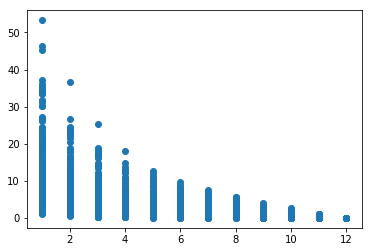

In [47]:
plt.scatter(df_base2.retention_month_bucket, df_base2.retention_value)

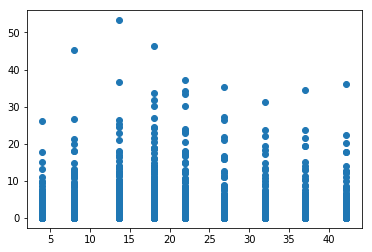

In [48]:
plt.scatter(df_base2.mixed_ttd_mean_bucket_med, df_base2.retention_value)

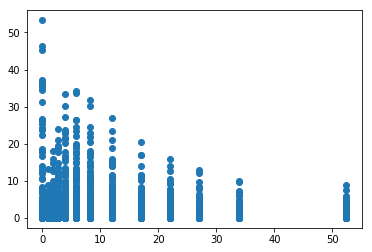

In [49]:
plt.scatter(df_base2.avg_gmv_bucket_med, df_base2.retention_value)

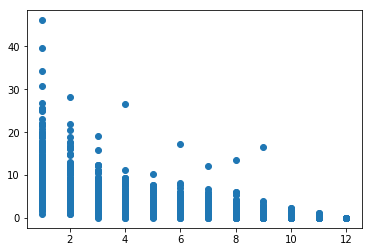

In [150]:
plt.scatter(df_base3.retention_month_bucket, df_base3.retention_value)

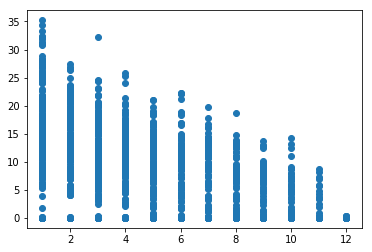

In [78]:
plt.scatter(df_base4.rentention_month_bucket, df_base4.retention_value)

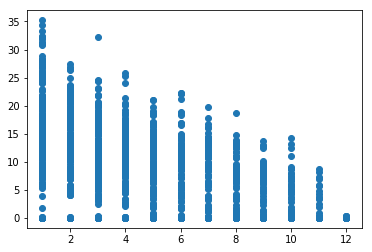

In [99]:
plt.scatter(df_base5.rentention_month_bucket, df_base4.retention_value)

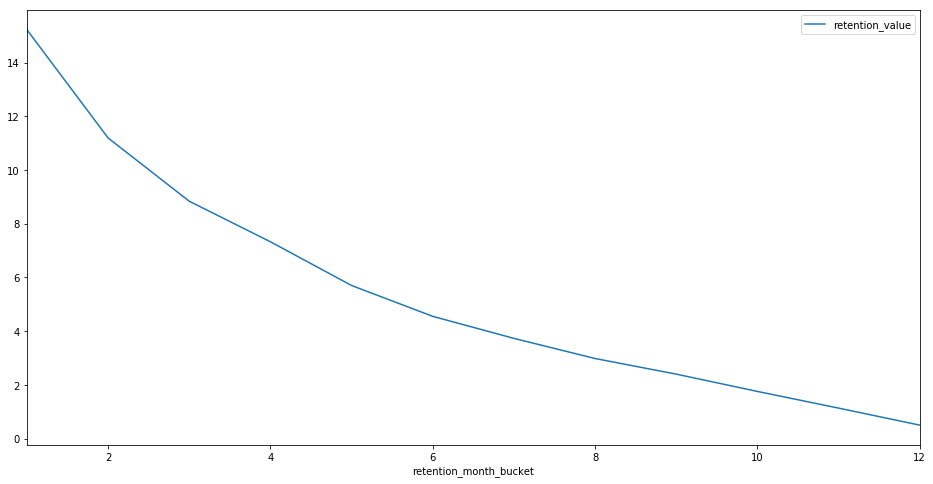

In [85]:
df_base2_1.pivot_table(values='retention_value', index='retention_month_bucket').plot(figsize=(16, 8))

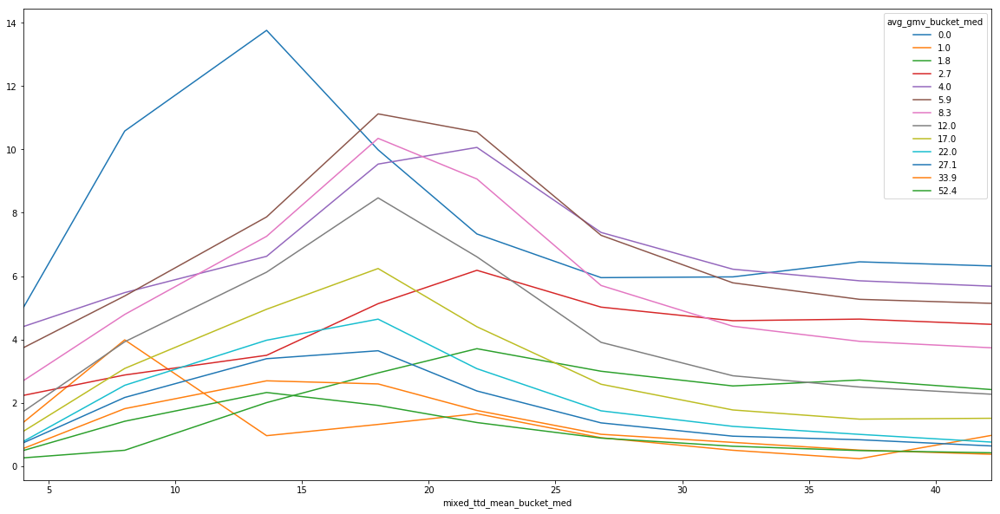

In [51]:
df_base2.pivot_table(values='retention_value', index='mixed_ttd_mean_bucket_med',columns='avg_gmv_bucket_med').plot(figsize=(20, 10))

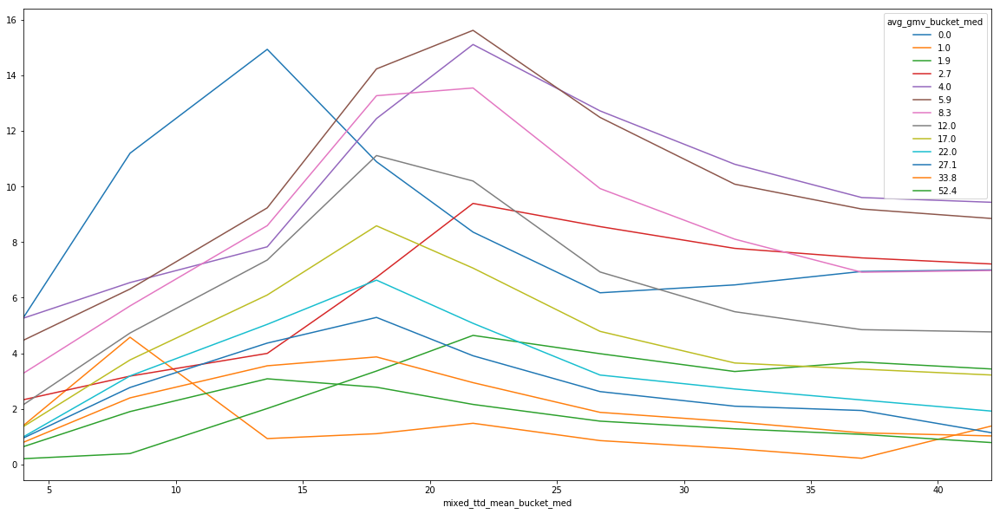

In [91]:
df_base2_1.pivot_table(values='retention_value', index='mixed_ttd_mean_bucket_med',columns='avg_gmv_bucket_med').plot(figsize=(20, 10))

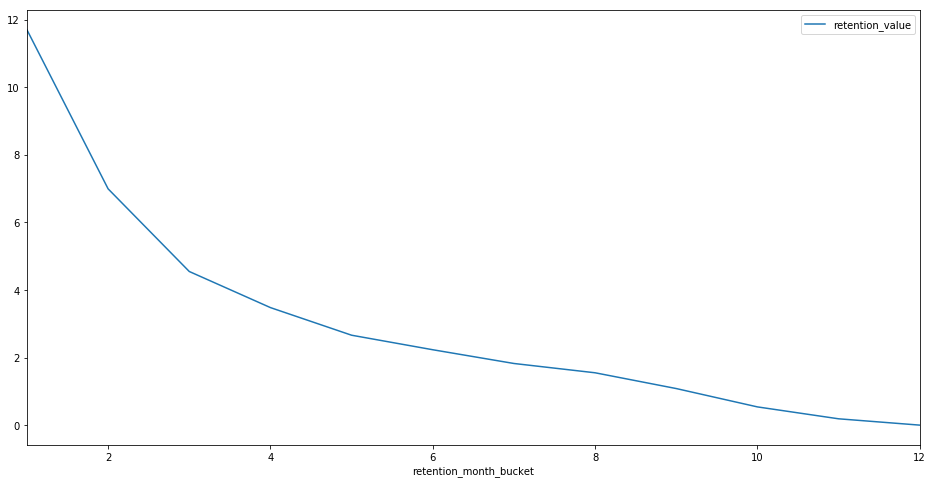

In [152]:
df_base3.pivot_table(values='retention_value', index='retention_month_bucket').plot(figsize=(16, 8))

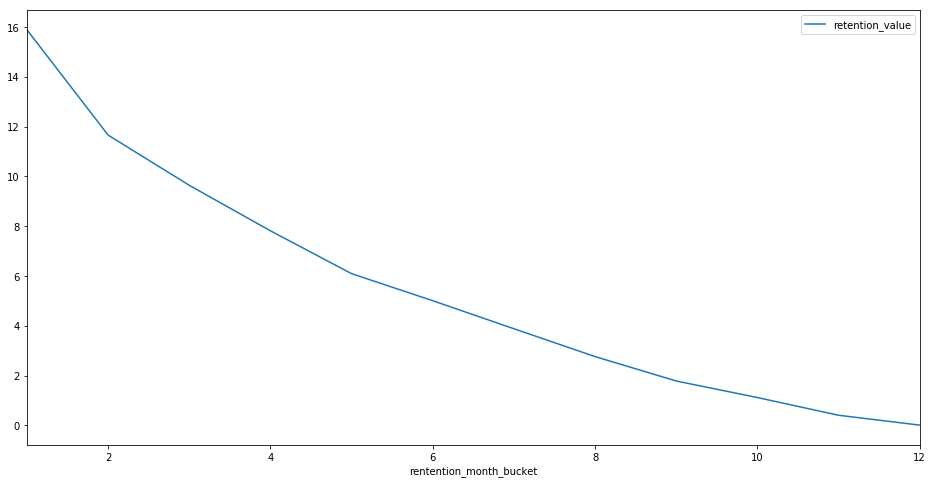

In [79]:
df_base4.pivot_table(values='retention_value', index='rentention_month_bucket').plot(figsize=(16, 8))

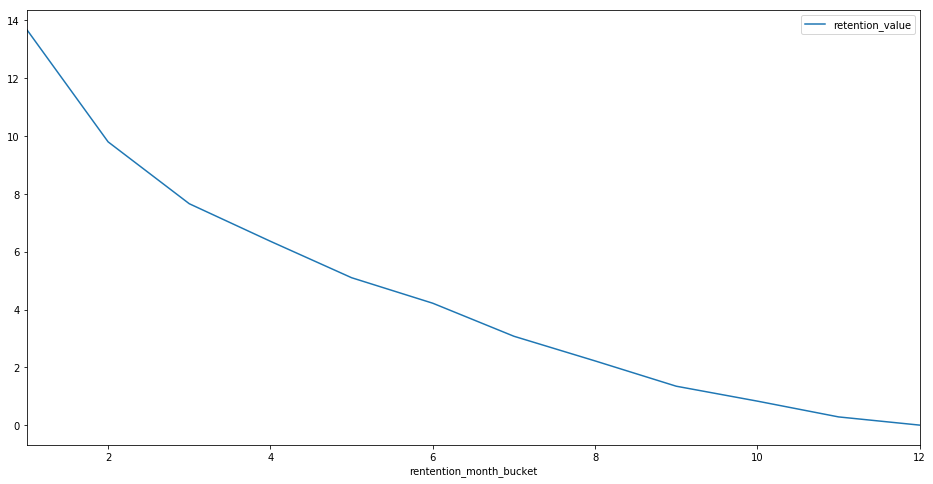

In [100]:
df_base5.pivot_table(values='retention_value', index='rentention_month_bucket').plot(figsize=(16, 8))

(0, 25)

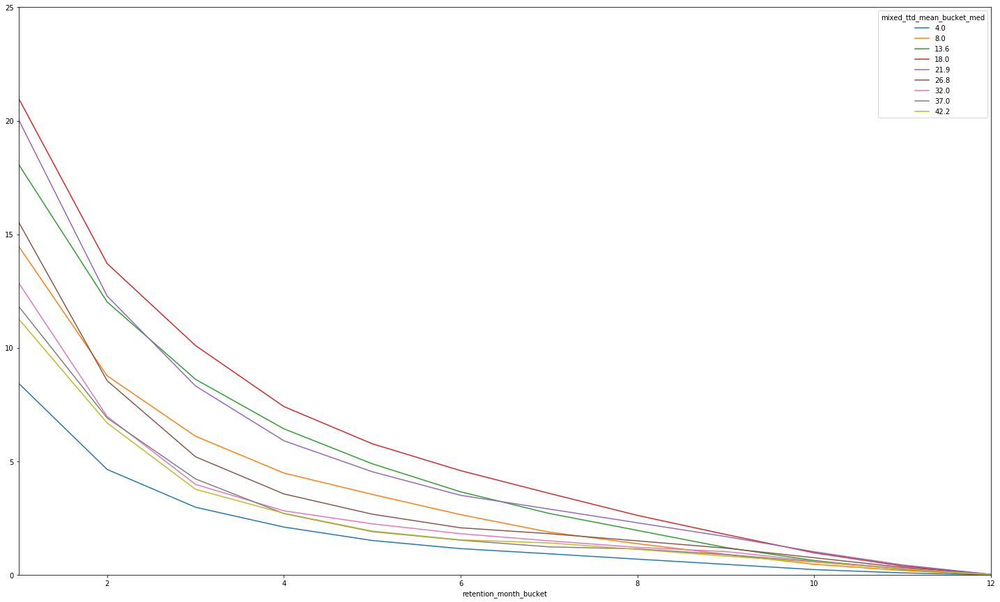

In [52]:
df_base2.pivot_table(columns='mixed_ttd_mean_bucket_med', values='retention_value', index='retention_month_bucket').plot(figsize=(25, 15))
plt.ylim(0,25)

(0, 25)

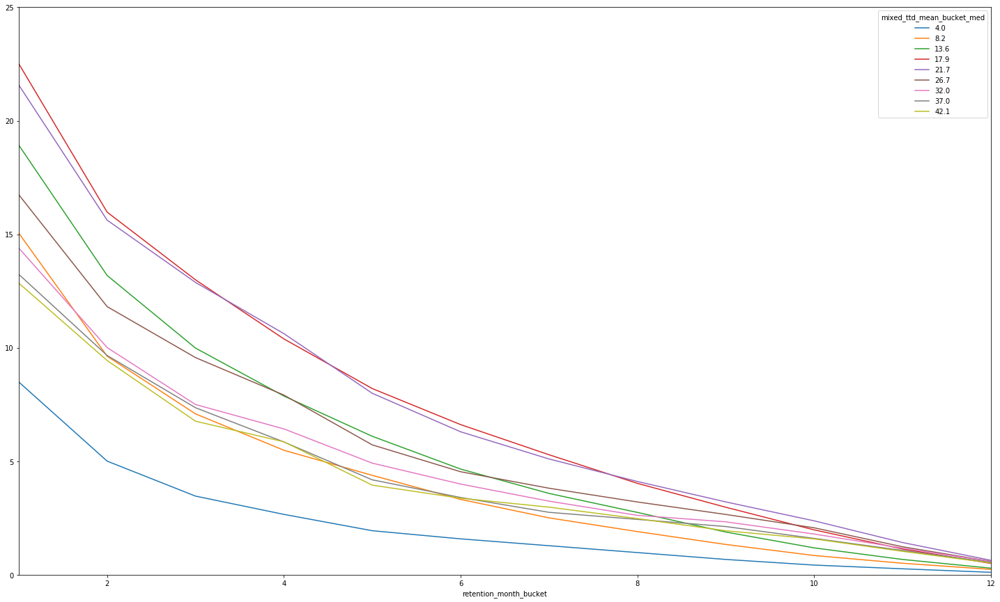

In [92]:
df_base2_1.pivot_table(columns='mixed_ttd_mean_bucket_med', values='retention_value', index='retention_month_bucket').plot(figsize=(25, 15))
plt.ylim(0,25)

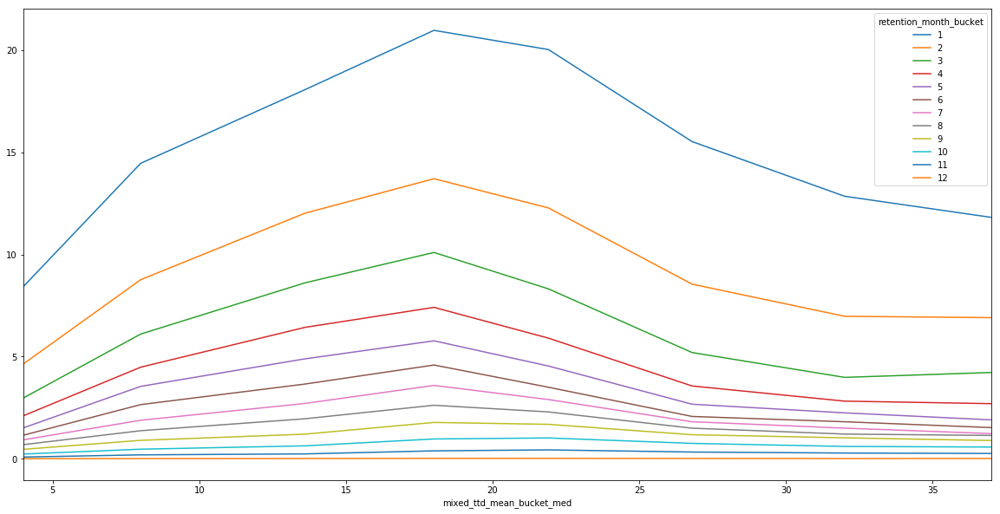

In [1044]:
df_base2.pivot_table(columns='retention_month_bucket', values='retention_value', index='mixed_ttd_mean_bucket_med').plot(figsize=(20, 10))

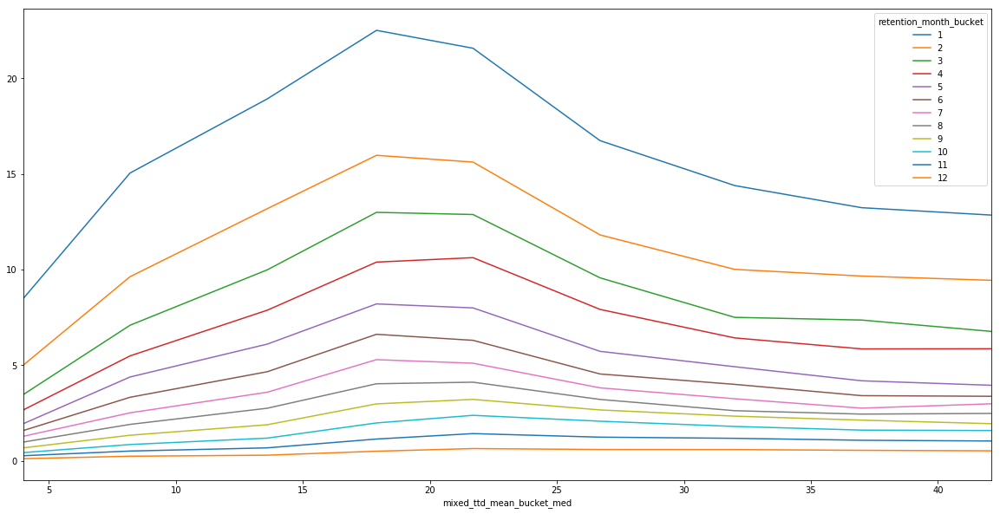

In [93]:
df_base2_1.pivot_table(columns='retention_month_bucket', values='retention_value', index='mixed_ttd_mean_bucket_med').plot(figsize=(20, 10))

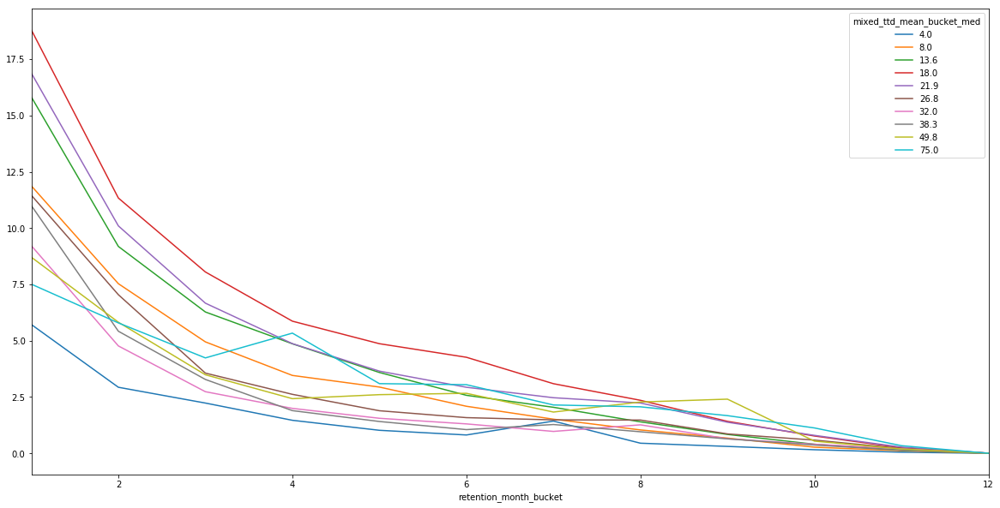

In [154]:
df_base3.pivot_table(columns='mixed_ttd_mean_bucket_med', values='retention_value', index='retention_month_bucket').plot(figsize=(20, 10))

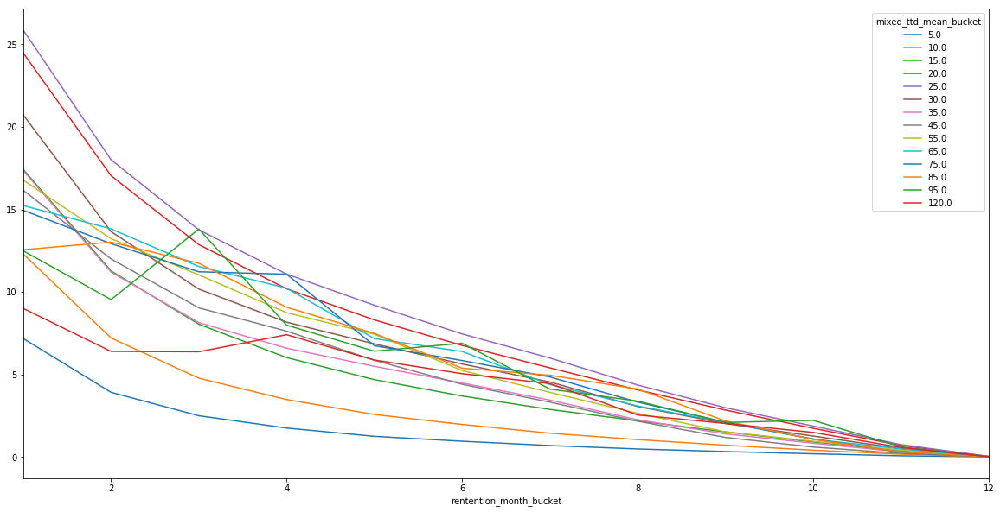

In [80]:
df_base4.pivot_table(columns='mixed_ttd_mean_bucket', values='retention_value', index='rentention_month_bucket').plot(figsize=(20, 10))

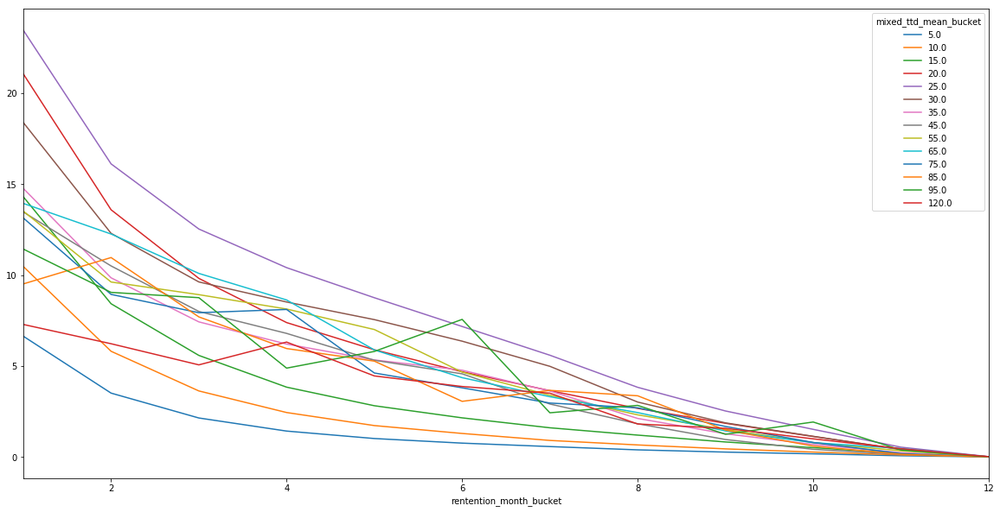

In [101]:
df_base5.pivot_table(columns='mixed_ttd_mean_bucket', values='retention_value', index='rentention_month_bucket').plot(figsize=(20, 10))

## Polynomial Regression

## model on user cnt base - without considering the refund & with sqrt of month

In [1045]:
# df_base2.head()

In [95]:
y= df_base2_1.retention_value
X = df_base2_1[['mixed_ttd_mean_bucket_med','retention_month_bucket','user_cnt_m0']]

X.head(),y.shape,X.shape

(   mixed_ttd_mean_bucket_med  retention_month_bucket  user_cnt_m0
 0                        4.0                       1          620
 1                        8.2                       1          756
 2                       13.6                       1          679
 3                       17.9                       1          534
 4                       21.7                       1          306,
 (1404,),
 (1404, 3))

In [96]:
y= df_base2_1.retention_value
X = df_base2_1[['mixed_ttd_mean_bucket_med','retention_month_bucket','user_cnt_m0']]
X['sqrt_retention_month_bucket'] = np.sqrt(X['retention_month_bucket'])
X2 = X.drop(columns=['retention_month_bucket'],axis=1,inplace=False)
X2.tail(),y.shape,X2.shape

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


(      mixed_ttd_mean_bucket_med  user_cnt_m0  sqrt_retention_month_bucket
 1399                       21.7        12272                     3.464102
 1400                       26.7         3990                     3.464102
 1401                       32.0         1456                     3.464102
 1402                       37.0          608                     3.464102
 1403                       42.1          328                     3.464102,
 (1404,),
 (1404, 3))

In [97]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_test_weight = X2_test['user_cnt_m0']
X2_train = X2_train[['mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket']]
X2_test = X2_test[['mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket']]
X2_train_weight.shape,X2_train.shape,X2_test_weight.shape

((982,), (982, 2), (422,))

In [98]:
X2_train.head()

,mixed_ttd_mean_bucket_med,sqrt_retention_month_bucket
434,13.6,2.000000
991,8.2,3.000000
349,37.0,1.732051
940,21.7,3.000000
371,13.6,2.000000


In [99]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.409924,0.412727,5.886675
2,0.408243,0.412460,5.888016
3,0.408243,0.412460,5.888016
4,0.408243,0.412460,5.888016
5,0.408243,0.412460,5.888016
6,0.408243,0.412460,5.888016
7,0.408243,0.412460,5.888016
8,0.408243,0.412460,5.888016


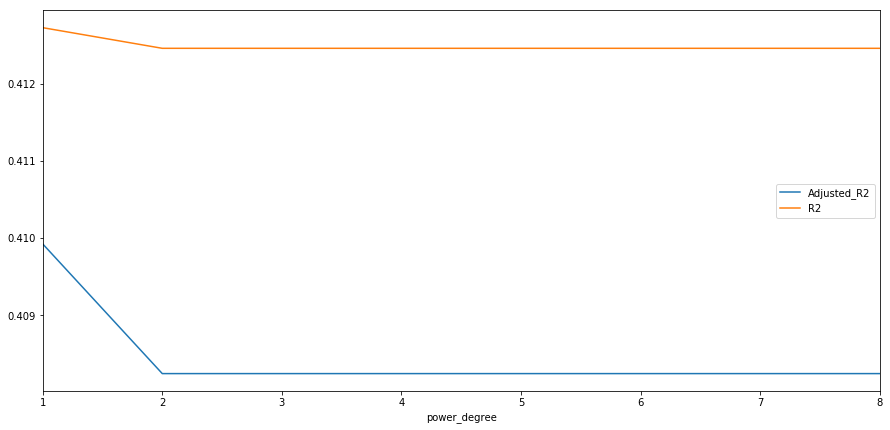

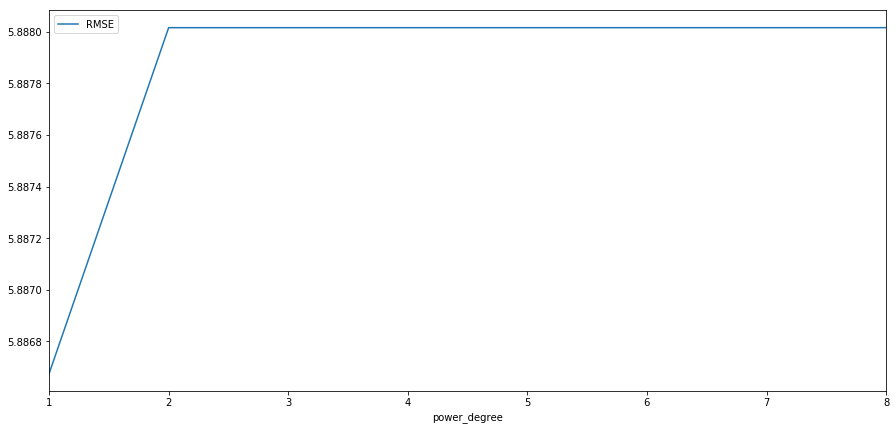

In [100]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

In [101]:
n=2

poly = PolynomialFeatures(n, include_bias=False,interaction_only=True)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

The polynomial features name are:['mixed_ttd_mean_bucket_med', 'sqrt_retention_month_bucket', 'mixed_ttd_mean_bucket_med sqrt_retention_month_bucket']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [102]:
# sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))

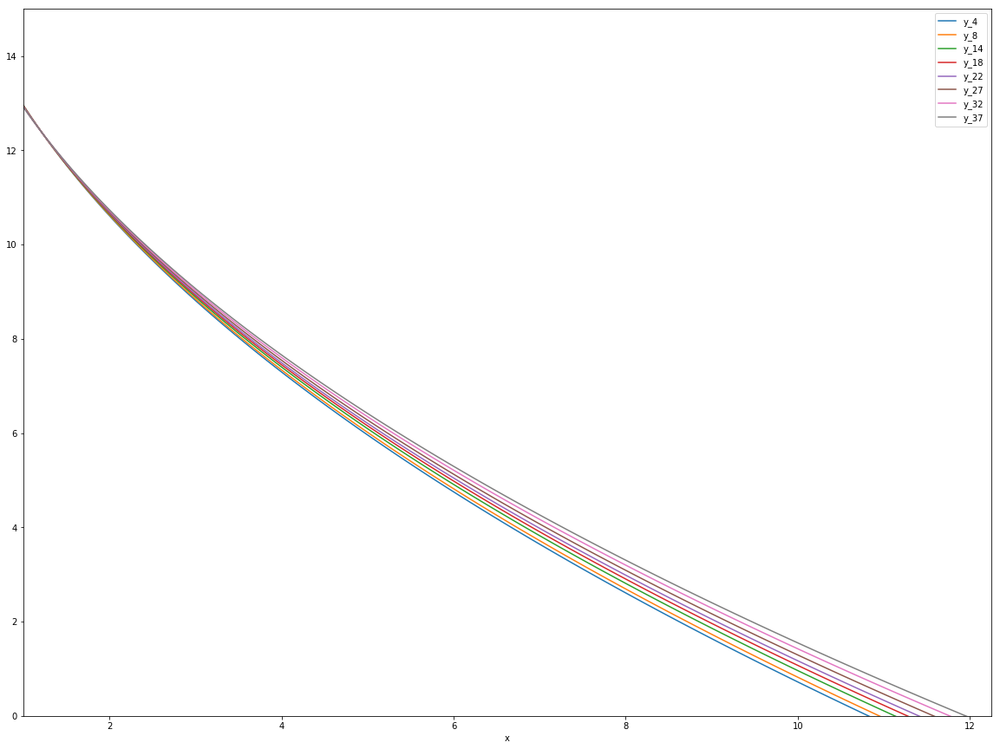

In [103]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))
# n=3
y_name = ['y_4','y_8','y_14','y_18','y_22','y_27','y_32','y_37']
df_simulated = pd.DataFrame(columns=y_name)
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 3.5, 100)*np.linspace(1, 3.5, 100)
# X['sqrt_rentention_month_bucket'] = np.sqrt(X['rentention_month_bucket'])
for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 3.5, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X_df))
    
# plt.figure(figsize=(20,10))
# plt.ylim(0, 25)

# for 
# plt.plot( 'x', 'y_4', data=df_simulated, marker='.',  linewidth=2)
# plt.plot( 'x', 'y_8', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_14', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_18', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_22', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_27', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_32', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_37', data=df_simulated, marker='.', linewidth=2)
# plt.plot( 'x', 'y_42', data=df_simulated, marker='.', linewidth=2)
df_simulated.plot(x='x',y=y_name,figsize=(20,15))
plt.ylim(0, 15)
plt.legend()

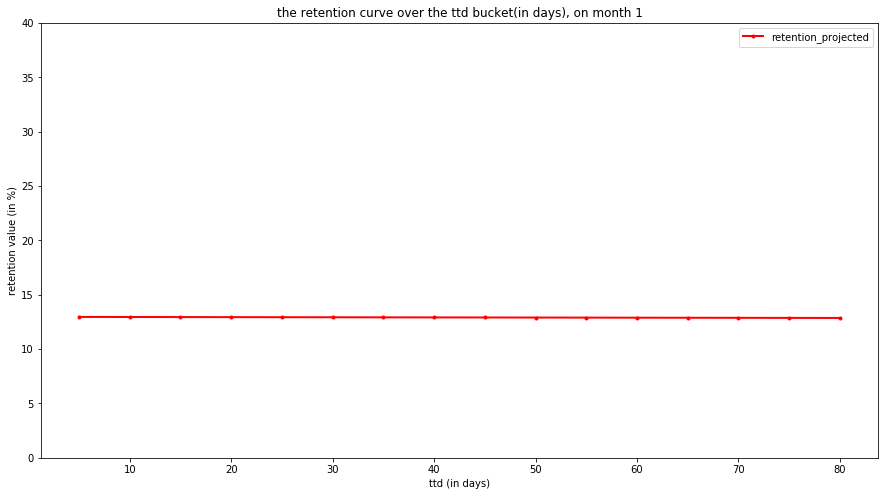

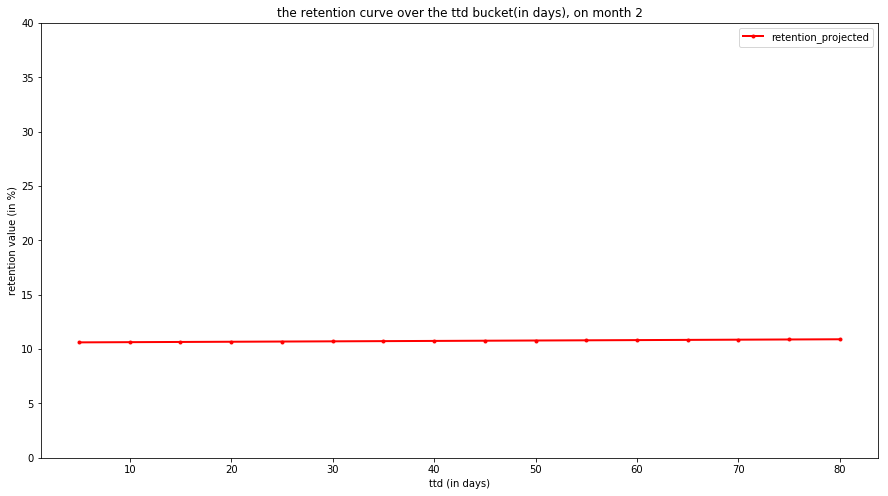

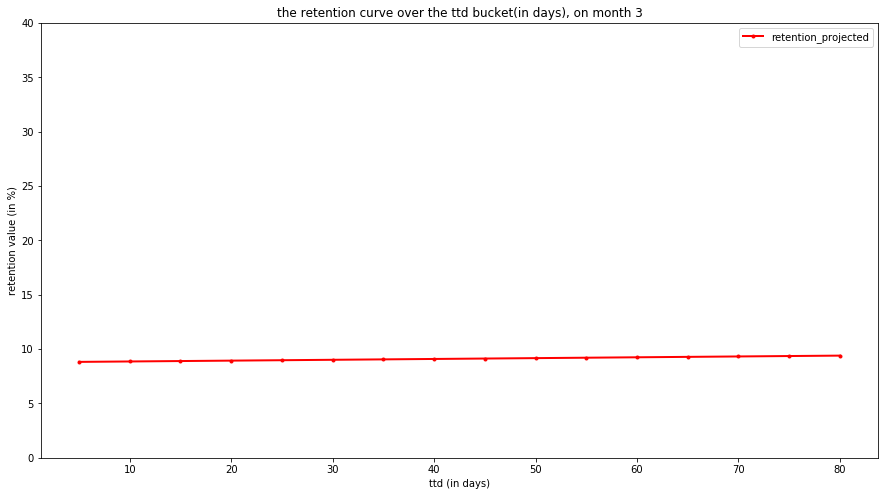

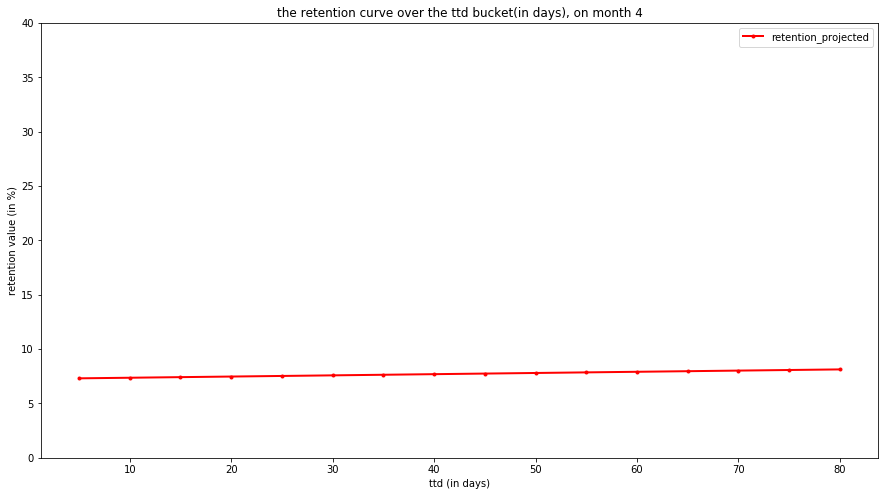

In [104]:
month = list(np.arange(1, 5, 1))
sqrt_month = np.sqrt(list(np.arange(1, 6, 1)))

for i,j in zip(month,sqrt_month):    
    ttd = list(np.arange(5, 85, 5))
    
    simulated_rentention_month_bucket = [j]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### model on user cnt base - with sqrt of month + avg_gmv

In [37]:
df_base2.head()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,user_cnt_m0,retention_month_bucket,user_cnt,retention_value
0,0.0,4.0,664,1,173,26.054
1,0.0,8.0,823,1,372,45.200
2,0.0,13.6,734,1,391,53.270
3,0.0,18.0,594,1,275,46.296
4,0.0,21.9,341,1,127,37.243


In [113]:
y= df_base2_1.retention_value
X = df_base2_1[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','retention_month_bucket','user_cnt_m0']]

X['sqrt_retention_month_bucket'] = np.sqrt(X['retention_month_bucket'])
X2 = X.drop(columns=['retention_month_bucket'],axis=1,inplace=False)
# X.head(),y.shape,X.shape, X2.tail(),X2.shape

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [114]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_test_weight = X2_test['user_cnt_m0']
X2_train = X2_train[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket']]
X2_test = X2_test[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket']]
# X2_train_weight.shape,X2_train.shape,X2_test_weight.shape,X2_train.head(),X2_train_weight.head()

              Adjusted_R2        R2      RMSE
power_degree                                 
1                0.465511  0.469320  5.595857
2                0.522623  0.529426  5.269434
3                0.521895  0.529845  5.267091
4                0.521895  0.529845  5.267091
5                0.521895  0.529845  5.267091
6                0.521895  0.529845  5.267091
7                0.521895  0.529845  5.267091
8                0.521895  0.529845  5.267091


Text(0.5,1,"model evaluation metrics on feature = ['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'user_cnt_m0']")

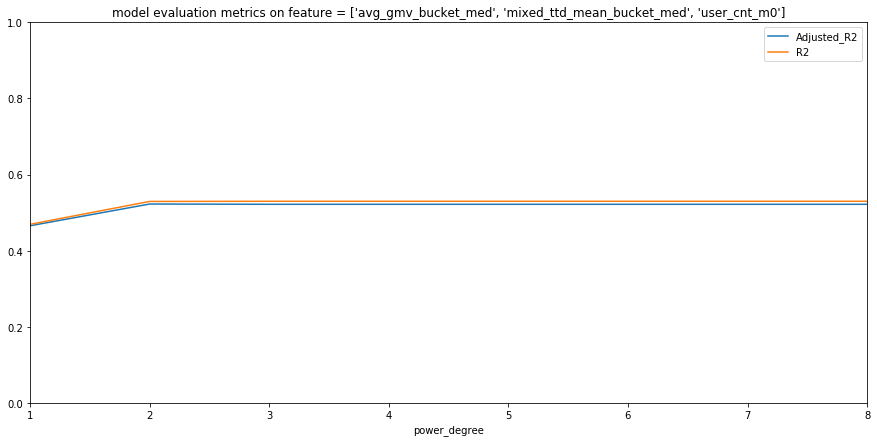

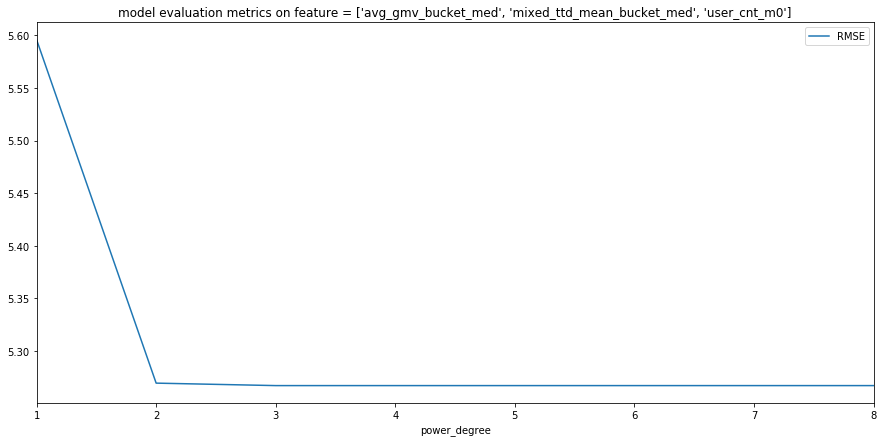

In [115]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    poly_reg.fit(x2_train_poly, y2_train)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
print(metrics_df)

metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

The polynomial features name are:['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'sqrt_retention_month_bucket', 'avg_gmv_bucket_med mixed_ttd_mean_bucket_med', 'avg_gmv_bucket_med sqrt_retention_month_bucket', 'mixed_ttd_mean_bucket_med sqrt_retention_month_bucket']
                                           coef_name  coef_value
0                                 avg_gmv_bucket_med   -0.374993
1                          mixed_ttd_mean_bucket_med    0.021101
2                        sqrt_retention_month_bucket   -7.617968
3       avg_gmv_bucket_med mixed_ttd_mean_bucket_med   -0.001808
4     avg_gmv_bucket_med sqrt_retention_month_bucket    0.127479
5  mixed_ttd_mean_bucket_med sqrt_retention_month...    0.008823


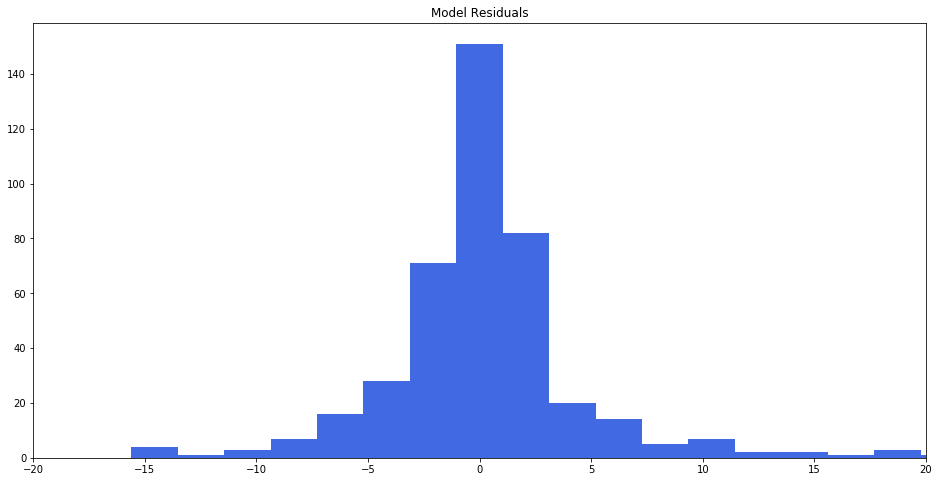

In [116]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))

d=2

poly = PolynomialFeatures(d, include_bias=False,interaction_only=True)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))

# x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

model_coef = pd.DataFrame(zip(poly_feature_name,poly_reg.coef_),columns=['coef_name','coef_value'])
print(model_coef)

(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=27,figsize=(16, 8))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()


In [117]:
# pd.DataFrame(zip(poly_feature_name,poly_reg.coef_),columns=['coef_name','coef_value'])

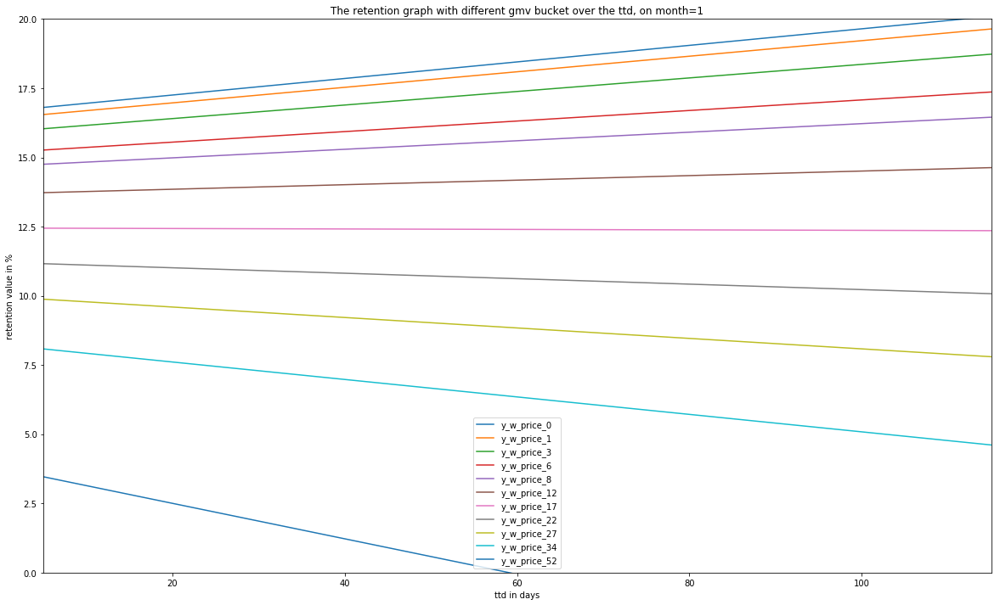

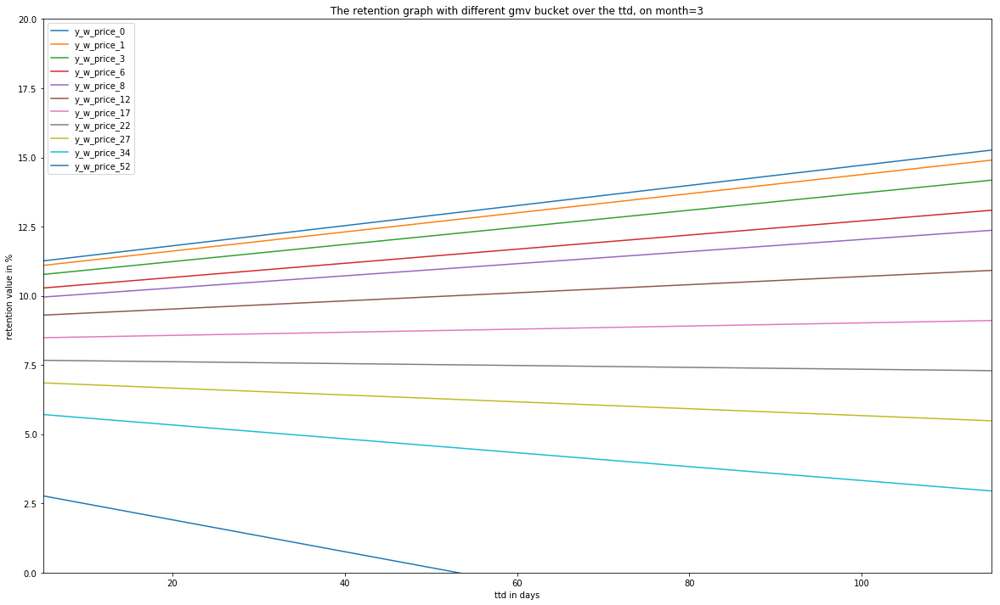

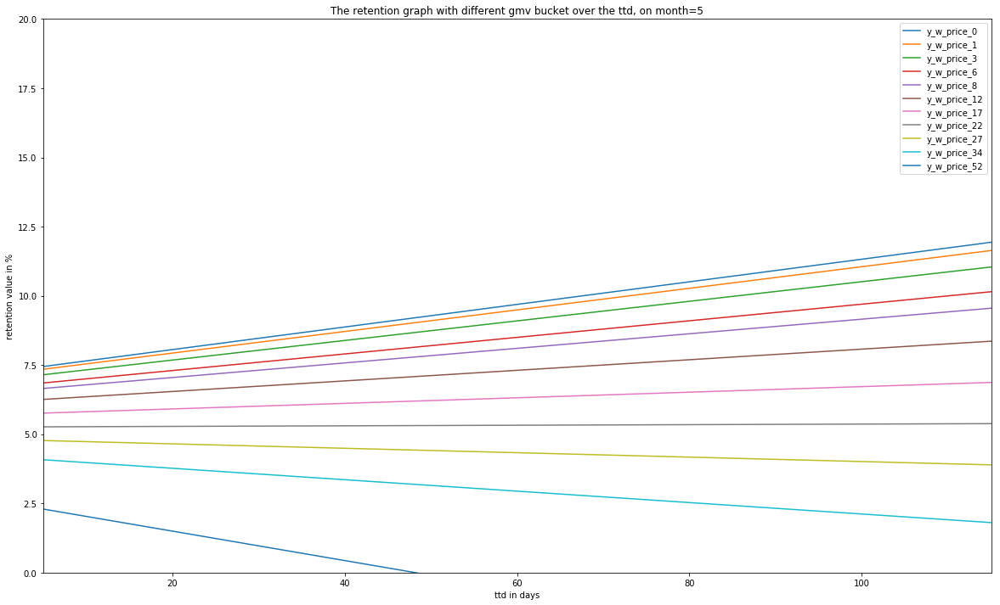

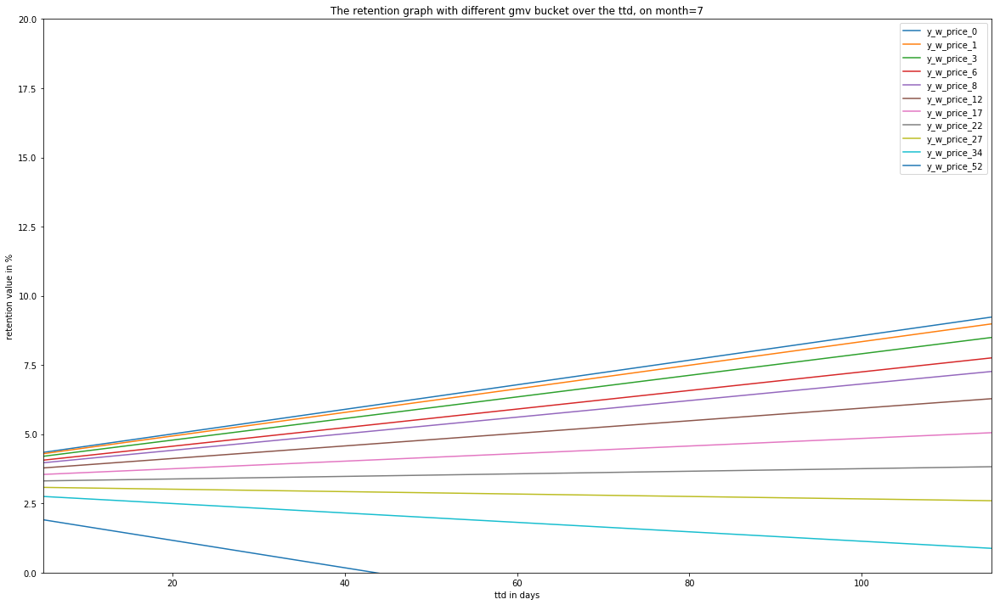

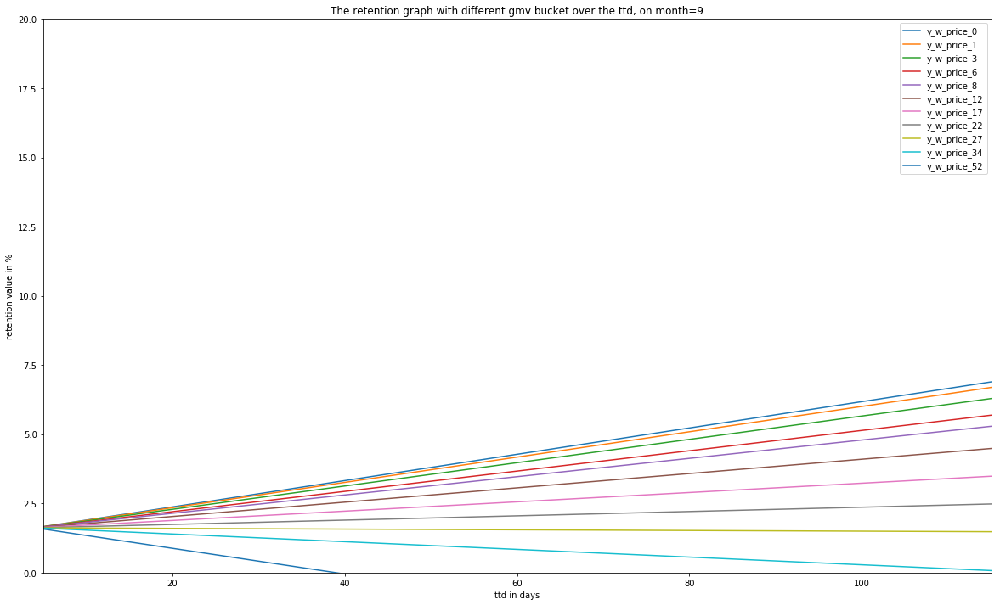

In [118]:
for month in [1,3,5,7,9]:
    gmv = [0,1,3,6,8,12,17,22,27,34,52]
    y_name = ['y_w_price_' + str(i) for i in gmv]
    df_simulated = pd.DataFrame(columns=y_name)

    # x is ttd from 5-100
    df_simulated['x'] = list(np.arange(5, 120, 5))
    # X['sqrt_rentention_month_bucket'] = np.sqrt(X['rentention_month_bucket'])

    for i,c in zip(gmv,y_name):

        simulated_ttd = df_simulated['x']
        simulated_gmv = [i]*len(simulated_ttd)
        simulated_sqrt_month = [np.sqrt(month)]*len(simulated_ttd)
        X_df = pd.DataFrame(list(zip(simulated_gmv,simulated_ttd,simulated_sqrt_month)),columns=['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket'])
        df_simulated[c]=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df))

    df_simulated.set_index('x',inplace=True)
    df_simulated.plot(figsize=(20,12))
    plt.xlabel('ttd in days')
    plt.ylabel('retention value in %')
    plt.ylim(0,20)
    plt.title('The retention graph with different gmv bucket over the ttd, on month={}'.format(month))

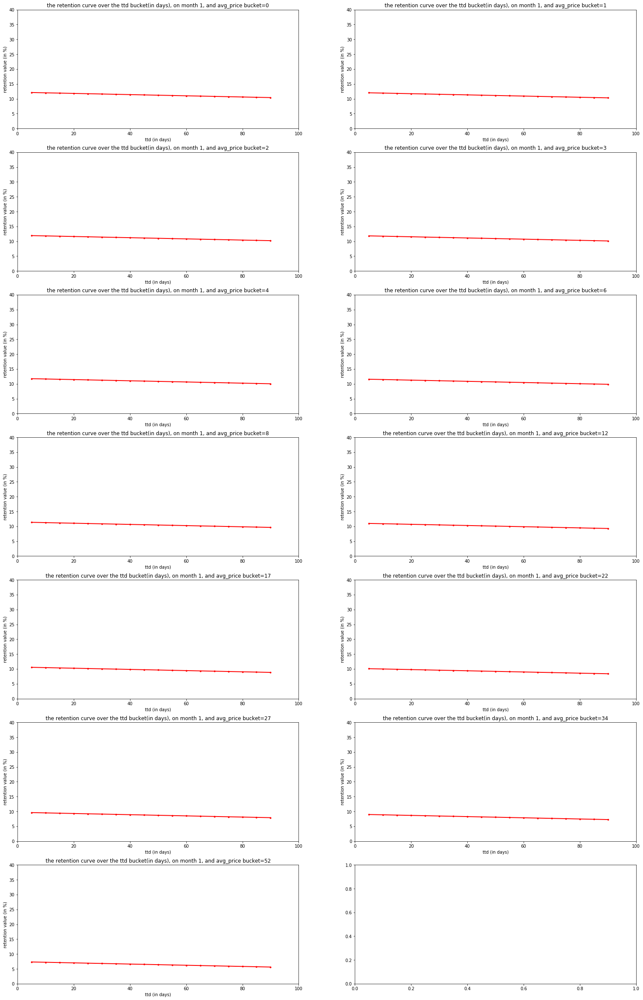

In [963]:
# month = list(np.arange(1, 6, 1))
month = 1
# price = sorted(list(set(X2_train.avg_value_bucket)))
price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,40)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

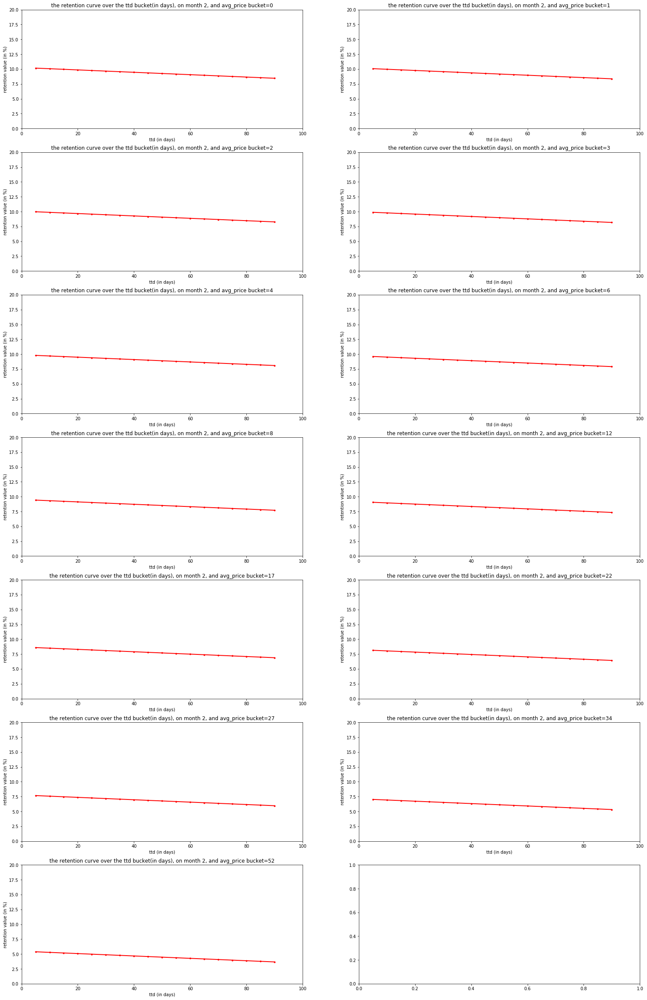

In [964]:
# month = list(np.arange(1, 6, 1))
month = 2
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,20)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

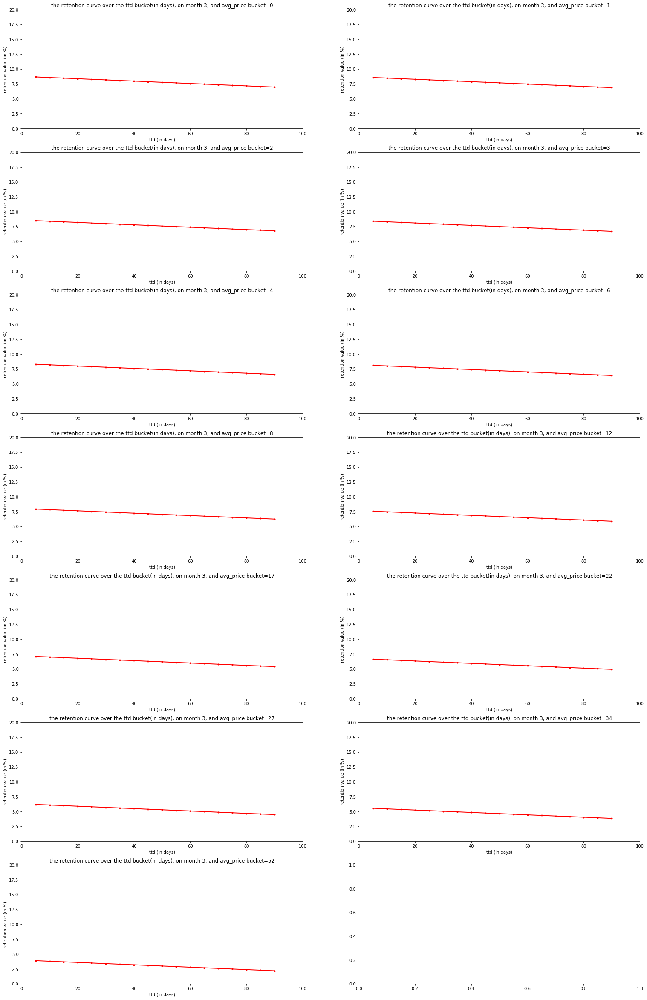

In [965]:
# month = list(np.arange(1, 6, 1))
month = 3
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,20)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

### with weight on user_cnt

In [819]:
# X2_train.head()

In [105]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train, sample_weight=X2_train_weight)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict, sample_weight=X2_test_weight)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict,sample_weight=X2_test_weight)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.712739,0.714104,4.736864
2,0.733672,0.735569,4.555566
3,0.733672,0.735569,4.555566
4,0.733672,0.735569,4.555566
5,0.733672,0.735569,4.555566
6,0.733672,0.735569,4.555566
7,0.733672,0.735569,4.555566
8,0.733672,0.735569,4.555566


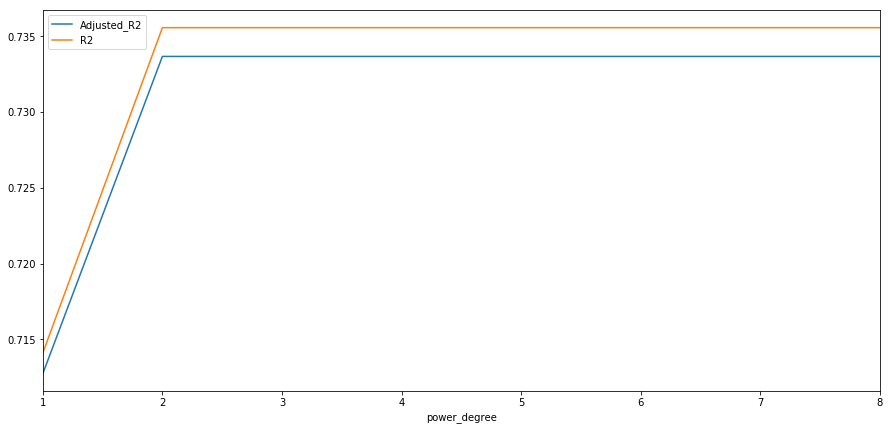

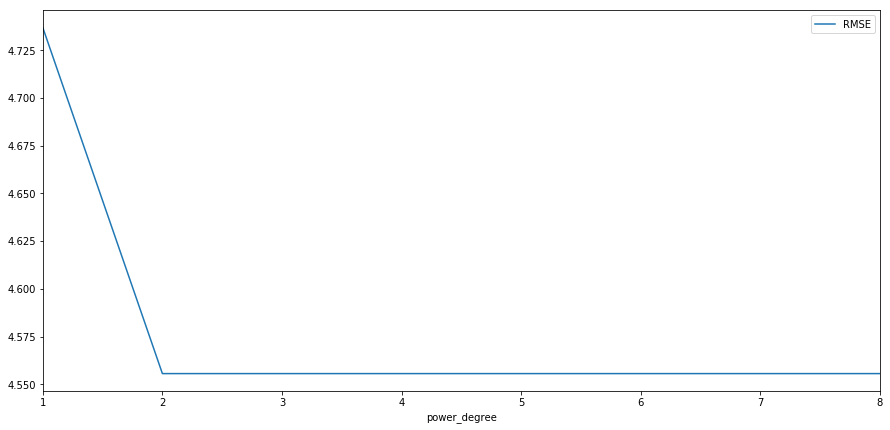

In [106]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

In [107]:
n=2

poly = PolynomialFeatures(n, include_bias=False,interaction_only=True)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

The polynomial features name are:['mixed_ttd_mean_bucket_med', 'sqrt_retention_month_bucket', 'mixed_ttd_mean_bucket_med sqrt_retention_month_bucket']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

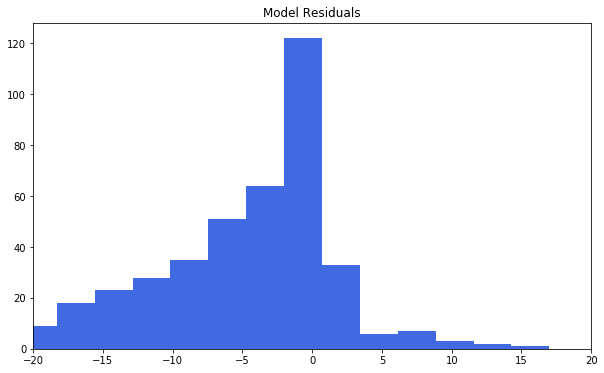

In [108]:
x2_test_poly = PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=26,figsize=(10, 6))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()

In [109]:
# sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))

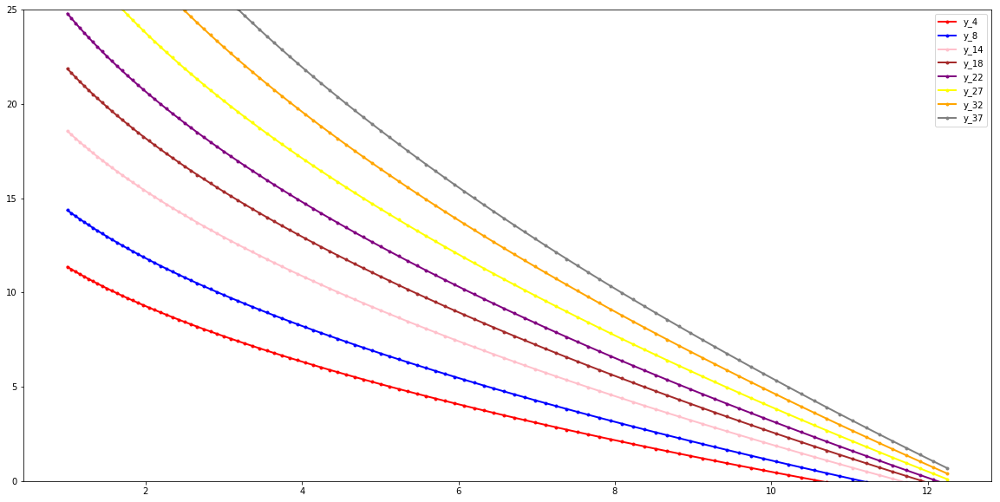

In [110]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))
# n=3
y_name = ['y_4','y_8','y_14','y_18','y_22','y_27','y_32','y_37','y_42','y_47']
df_simulated = pd.DataFrame(columns=y_name)
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 3.5, 100)*np.linspace(1, 3.5, 100)
# X['sqrt_rentention_month_bucket'] = np.sqrt(X['rentention_month_bucket'])
for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 3.5, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X_df))
    
plt.figure(figsize=(20,10))
plt.ylim(0, 25)
plt.plot( 'x', 'y_4', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_8', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_14', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_18', data=df_simulated, marker='.', color='brown', linewidth=2)
plt.plot( 'x', 'y_22', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_27', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_32', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_37', data=df_simulated, marker='.', color='grey', linewidth=2)
# plt.plot( 'x', 'y_42', data=df_simulated, marker='.', color='brown', linewidth=2)
# plt.plot( 'x', 'y_47', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
# plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
# plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.legend()

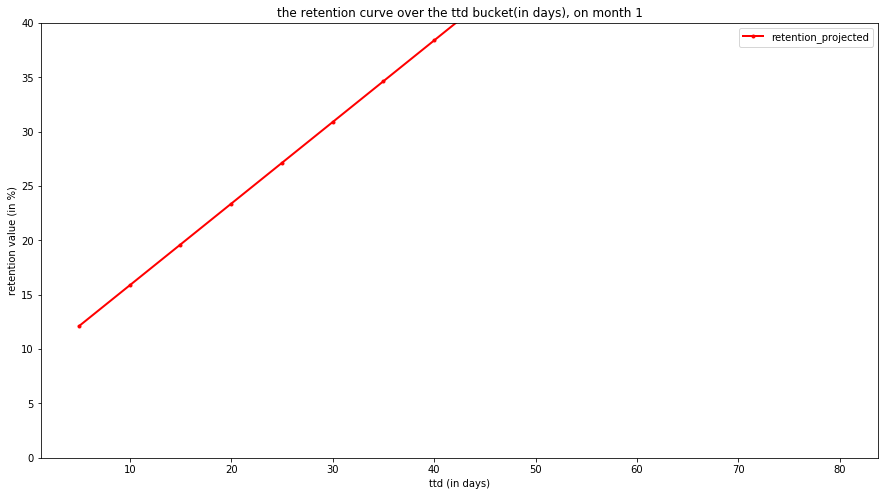

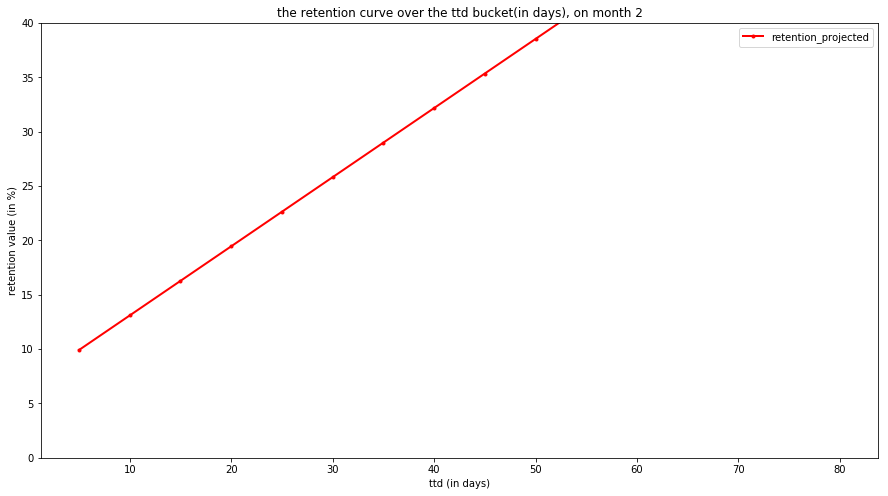

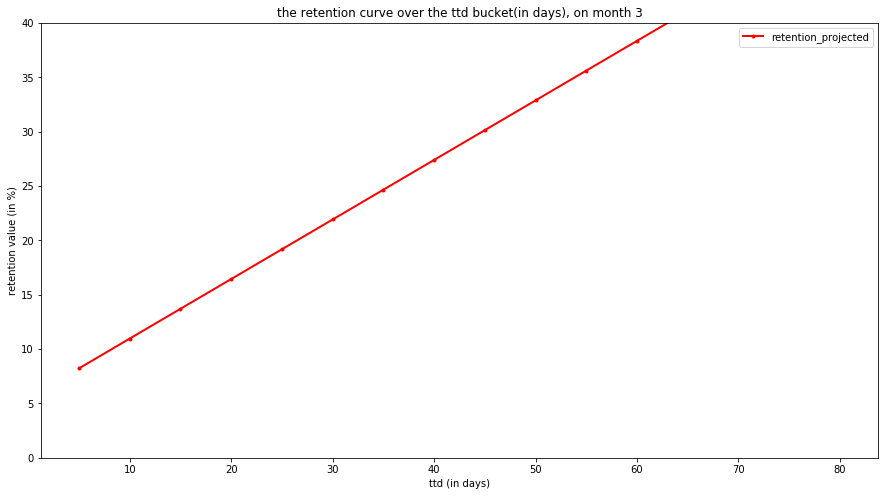

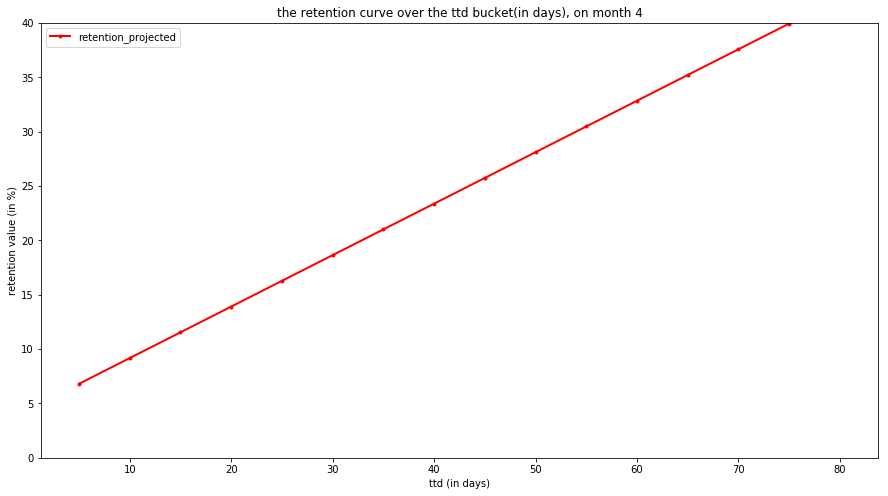

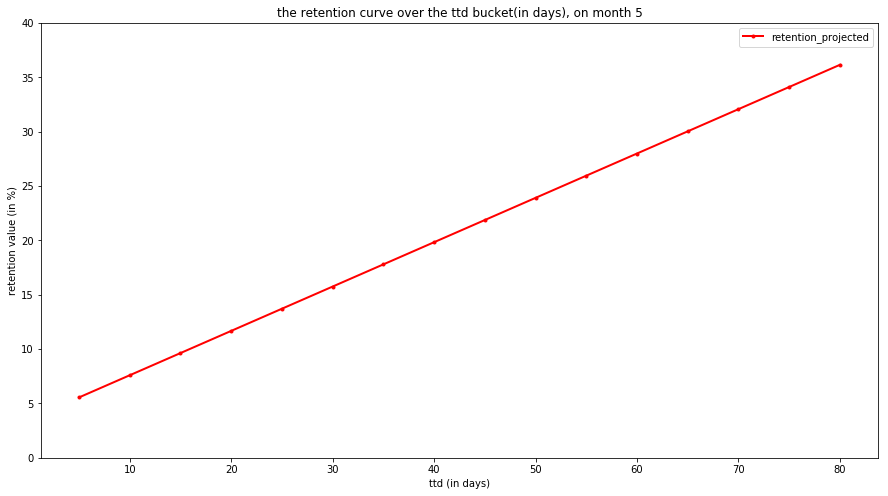

In [111]:
month = list(np.arange(1, 6, 1))
sqrt_month = np.sqrt(list(np.arange(1, 6, 1)))

for i,j in zip(month,sqrt_month):    
    ttd = list(np.arange(5, 85, 5))
    
    simulated_rentention_month_bucket = [j]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X_df))
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### model on user cnt base - with sqrt of month + avg_gmv - weighted by user_cnt

              Adjusted_R2        R2      RMSE
power_degree                                 
1                0.769589  0.771231  4.237259
2                0.828694  0.831135  3.640459
3                0.829795  0.832625  3.624369
4                0.829795  0.832625  3.624369
5                0.829795  0.832625  3.624369
6                0.829795  0.832625  3.624369
7                0.829795  0.832625  3.624369
8                0.829795  0.832625  3.624369


Text(0.5,1,"model evaluation metrics on feature = ['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'user_cnt_m0']")

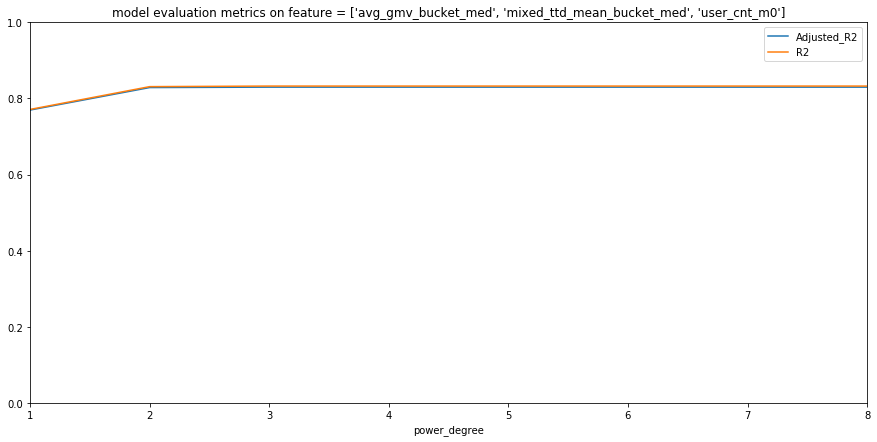

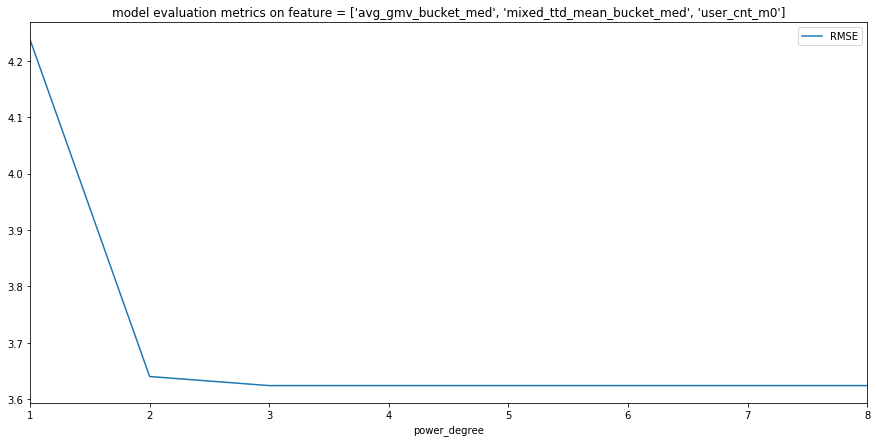

In [119]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    poly_reg.fit(x2_train_poly, y2_train, sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict, sample_weight=X2_test_weight)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict, sample_weight=X2_test_weight)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False,interaction_only=True).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
print(metrics_df)

metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

The polynomial features name are:['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'sqrt_retention_month_bucket', 'avg_gmv_bucket_med mixed_ttd_mean_bucket_med', 'avg_gmv_bucket_med sqrt_retention_month_bucket', 'mixed_ttd_mean_bucket_med sqrt_retention_month_bucket']
                                           coef_name  coef_value
0                                 avg_gmv_bucket_med   -0.374993
1                          mixed_ttd_mean_bucket_med    0.021101
2                        sqrt_retention_month_bucket   -7.617968
3       avg_gmv_bucket_med mixed_ttd_mean_bucket_med   -0.001808
4     avg_gmv_bucket_med sqrt_retention_month_bucket    0.127479
5  mixed_ttd_mean_bucket_med sqrt_retention_month...    0.008823


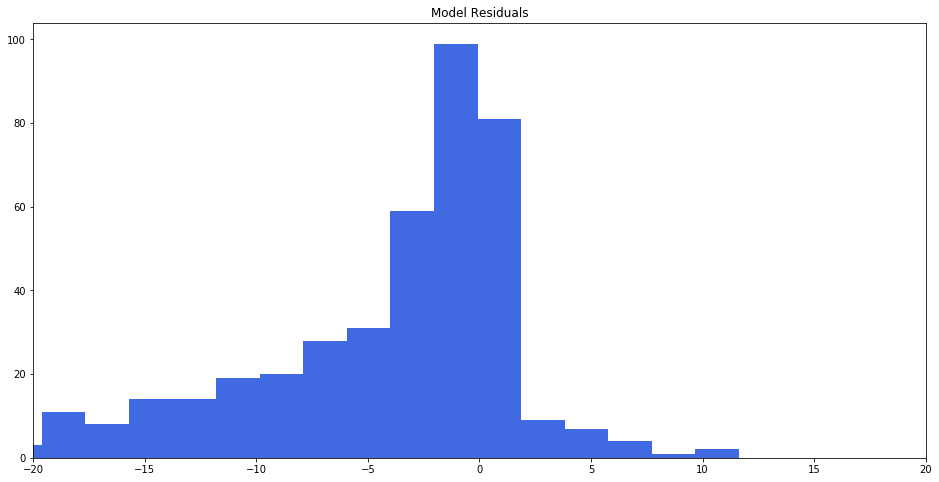

In [120]:
d=2

poly = PolynomialFeatures(d, include_bias=False,interaction_only=True)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))

# x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

model_coef = pd.DataFrame(zip(poly_feature_name,poly_reg.coef_),columns=['coef_name','coef_value'])
print(model_coef)

(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins='auto',figsize=(16, 8))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()

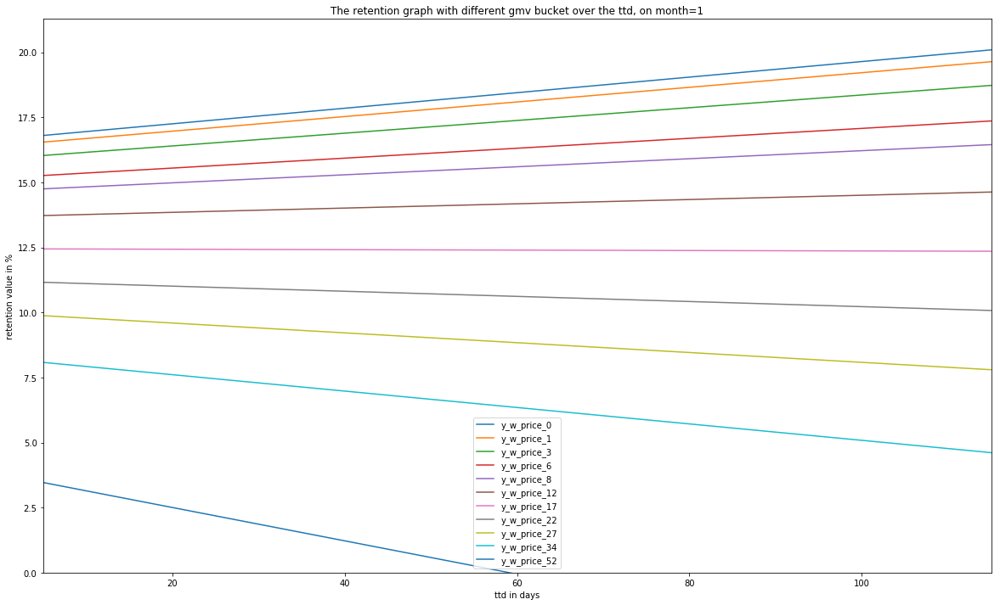

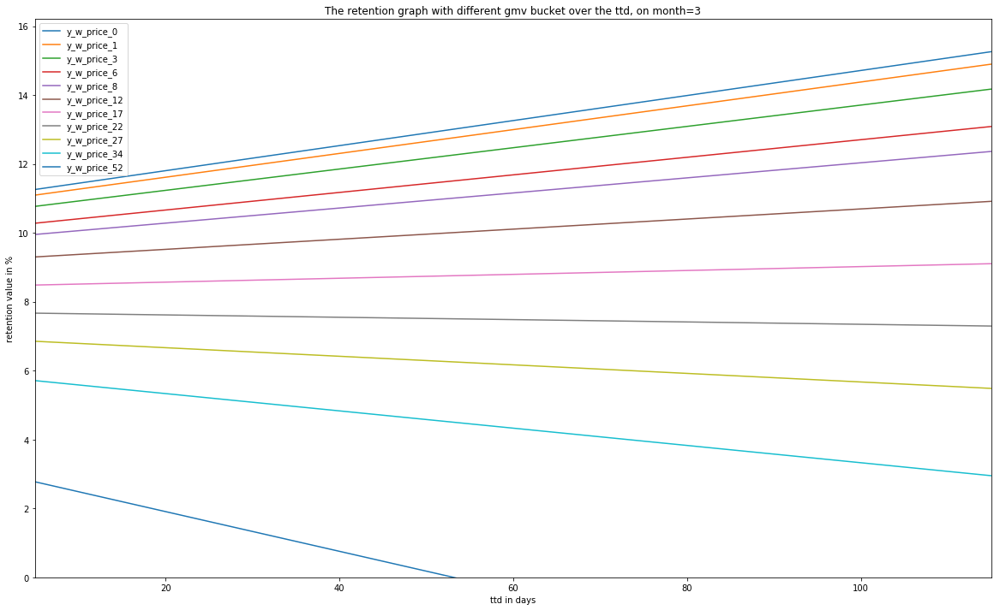

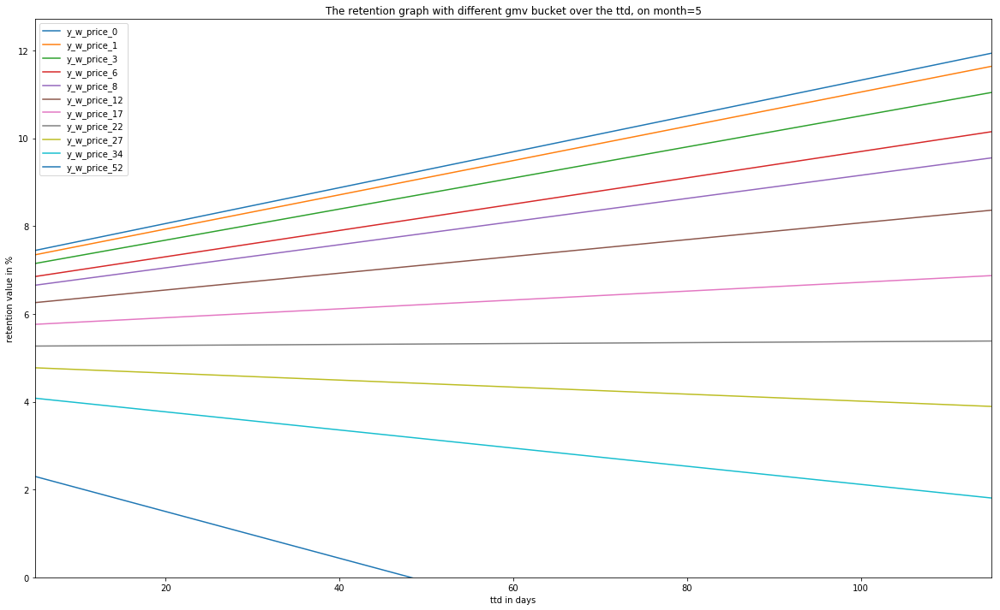

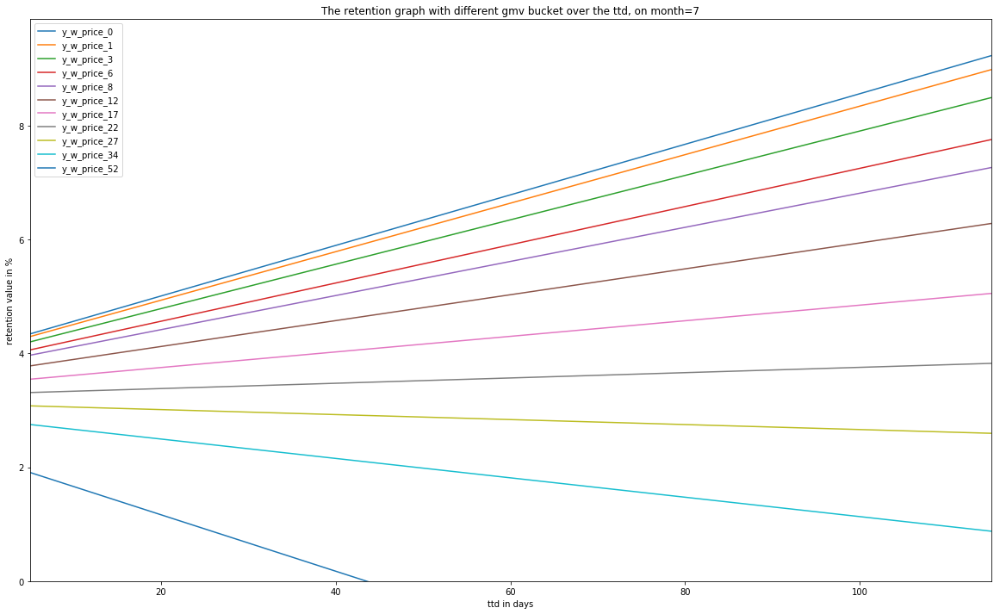

In [121]:
for month in [1,3,5,7]:
    gmv = [0,1,3,6,8,12,17,22,27,34,52]
    y_name = ['y_w_price_' + str(i) for i in gmv]
    df_simulated = pd.DataFrame(columns=y_name)

    # x is ttd from 5-100
    df_simulated['x'] = list(np.arange(5, 120, 5))
    # X['sqrt_rentention_month_bucket'] = np.sqrt(X['rentention_month_bucket'])

    for i,c in zip(gmv,y_name):

        simulated_ttd = df_simulated['x']
        simulated_gmv = [i]*len(simulated_ttd)
        simulated_sqrt_month = [np.sqrt(month)]*len(simulated_ttd)
        X_df = pd.DataFrame(list(zip(simulated_gmv,simulated_ttd,simulated_sqrt_month)),columns=['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket'])
        df_simulated[c]=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df))

    df_simulated.set_index('x',inplace=True)
    df_simulated.plot(figsize=(20,12))
    plt.xlabel('ttd in days')
    plt.ylabel('retention value in %')
    plt.ylim(0,)
    plt.title('The retention graph with different gmv bucket over the ttd, on month={}'.format(month))

In [ ]:
month = 1
gmv = [0,1,2,3,4,6,8,12,17,22,27,34,52]
y_name = ['y_w_price_' + str(i) for i in gmv]
df_simulated = pd.DataFrame(columns=y_name)

# x is ttd from 5-100
df_simulated['x'] = list(np.arange(5, 120, 5))
# X['sqrt_rentention_month_bucket'] = np.sqrt(X['rentention_month_bucket'])

for i,c in zip(gmv,y_name):
    
    simulated_ttd = df_simulated['x']
    simulated_gmv = [i]*len(simulated_ttd)
    simulated_sqrt_month = [np.sqrt(month)]*len(simulated_ttd)
    X_df = pd.DataFrame(list(zip(simulated_gmv,simulated_ttd,simulated_sqrt_month)),columns=['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','sqrt_retention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df))

df_simulated.set_index('x',inplace=True)
df_simulated.plot(figsize=(20,15))
plt.xlabel('ttd in days')
plt.ylabel('retention value in %')
plt.title('The retention graph with different gmv bucket over the ttd, on month={}'.format(month))

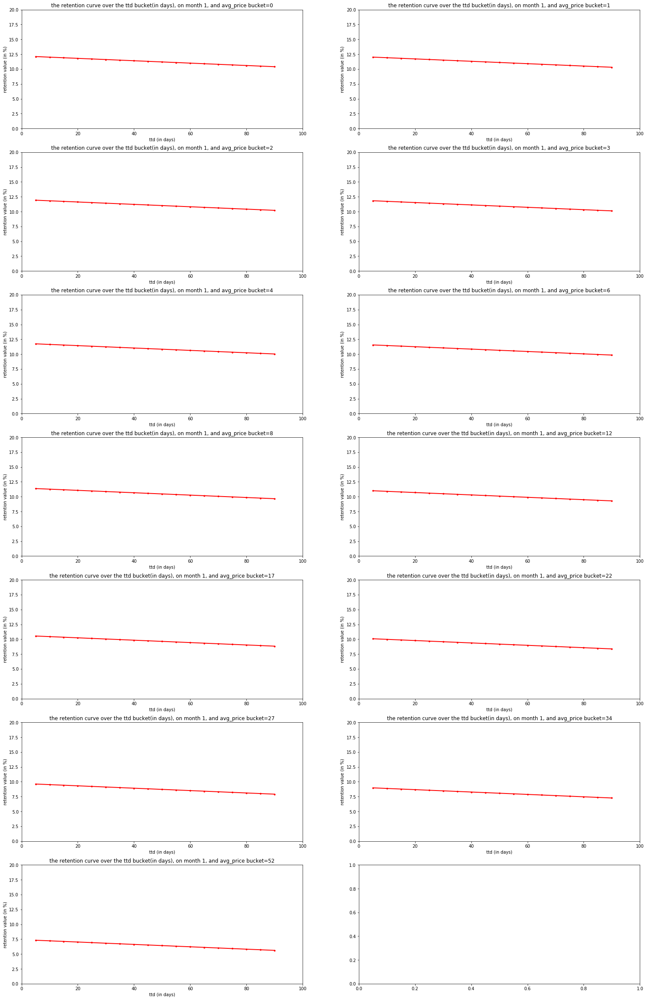

In [980]:
# month = list(np.arange(1, 6, 1))
month = 1
# price = sorted(list(set(X2_train.avg_value_bucket)))
price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
y_name = ['y_w_price_' + str(i) for i in price]

m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,20)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

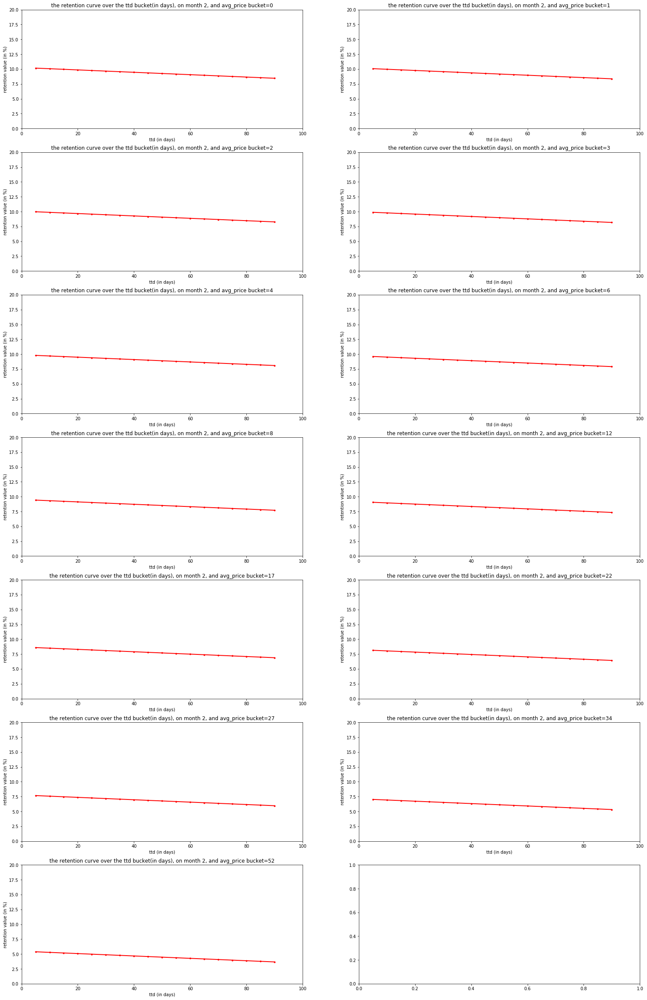

In [970]:
# set(X2_train.avg_gmv_bucket_med)
# month = list(np.arange(1, 6, 1))
month = 2
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
# y_name = ['y_w_price_' + str(i) for i in price]

m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,20)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

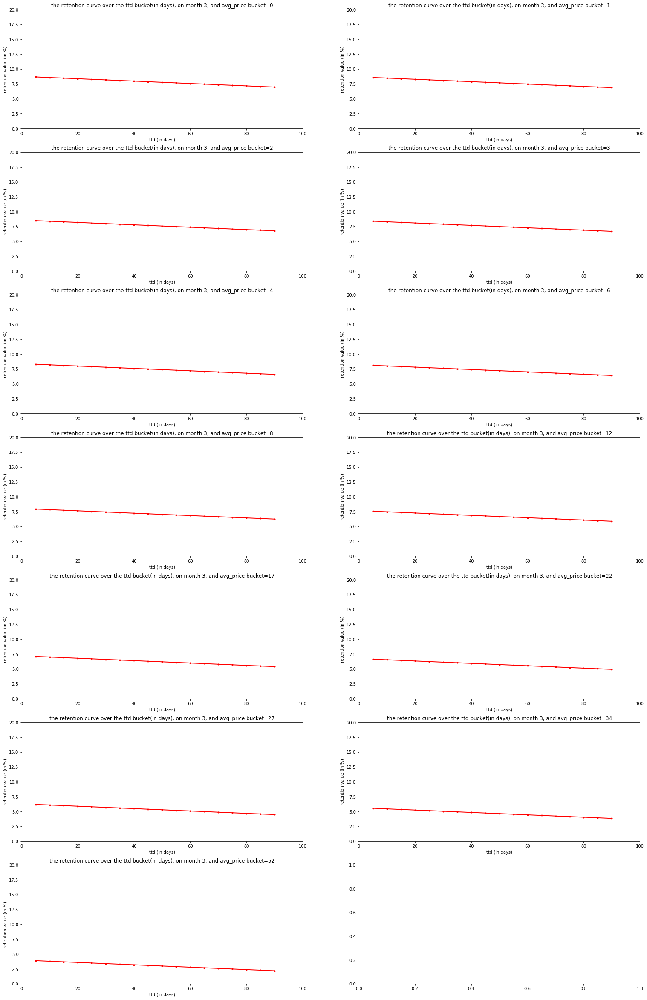

In [971]:
# month = list(np.arange(1, 6, 1))
month = 3
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([np.sqrt(month)]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False,interaction_only=True).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,20)
    axes[x][y].set_xlim(0,100)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

## base model on user cnt base - without considering the refund

In [577]:
df_base2.tail()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,user_cnt_m0,retention_month_bucket,user_cnt,retention_value
1399,52.4,21.9,20858,12,1,0.005
1400,52.4,26.8,8146,12,0,0.000
1401,52.4,32.0,3351,12,0,0.000
1402,52.4,37.0,1541,12,0,0.000
1403,52.4,42.2,907,12,0,0.000


In [578]:
y= df_base2.retention_value
X = df_base2[['mixed_ttd_mean_bucket_med','retention_month_bucket','user_cnt_m0']]

X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_test_weight = X2_test['user_cnt_m0']
X2_train = X2_train[['mixed_ttd_mean_bucket_med','retention_month_bucket']]
X2_test = X2_test[['mixed_ttd_mean_bucket_med','retention_month_bucket']]
X2_train_weight.shape,X2_train.shape,X2_test_weight.shape

((982,), (982, 2), (422,))

In [579]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.339085,0.342225,5.606052
2,0.459834,0.466250,5.049955
3,0.526854,0.536969,4.703525
4,0.548686,0.563694,4.565769
5,0.544043,0.565703,4.555244
6,0.530986,0.561065,4.579504
7,0.514994,0.555315,4.609402
8,0.497645,0.550148,4.636104


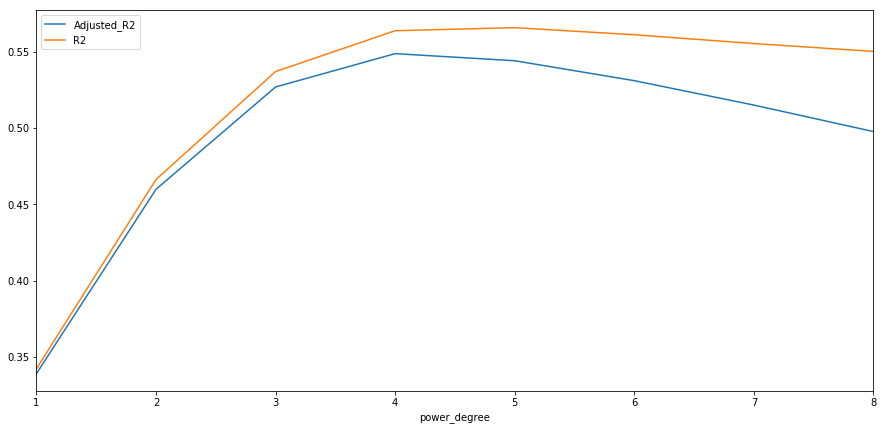

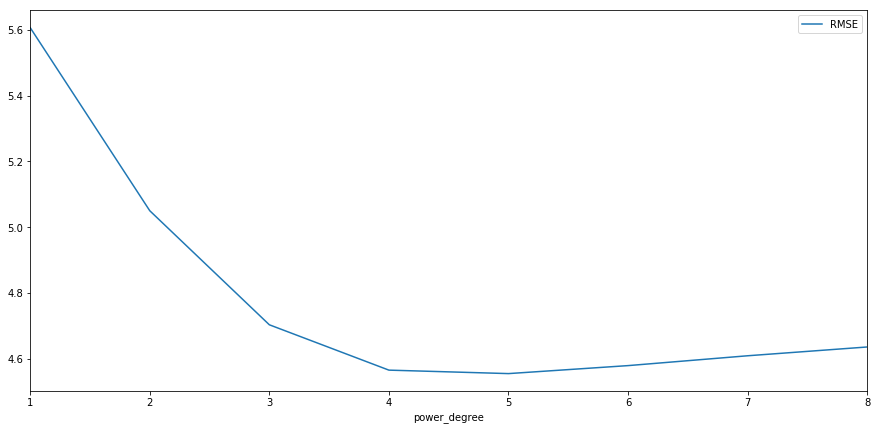

In [580]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

In [586]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))
n=2

poly = PolynomialFeatures(n, include_bias=False)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

# for i in ttd_bucket:
#     mask = df_base2.mixed_ttd_mean_bucket_med ==i
#     X_sub = df_base2.loc[mask,['mixed_ttd_mean_bucket_med','retention_month_bucket']]
#     y_sub = df_base2.loc[mask,'retention_value']
#     y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
#     plt.figure(figsize=(15,8))
#     plt.scatter(X_sub['retention_month_bucket'],y_sub,c='grey')
#     plt.plot(X_sub['retention_month_bucket'], y_sub_predict,c='blue')
#     plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

The polynomial features name are:['mixed_ttd_mean_bucket_med', 'retention_month_bucket', 'mixed_ttd_mean_bucket_med^2', 'mixed_ttd_mean_bucket_med retention_month_bucket', 'retention_month_bucket^2']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

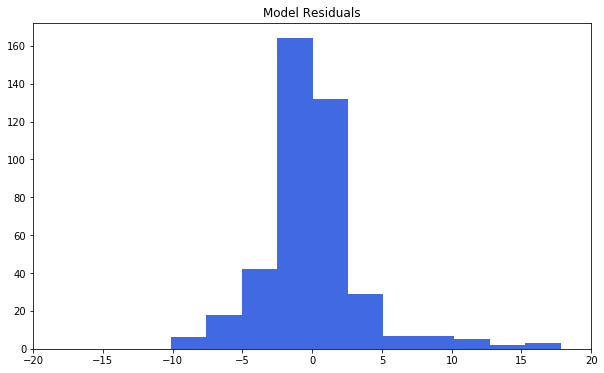

In [587]:
x2_test_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=20,figsize=(10, 6))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()

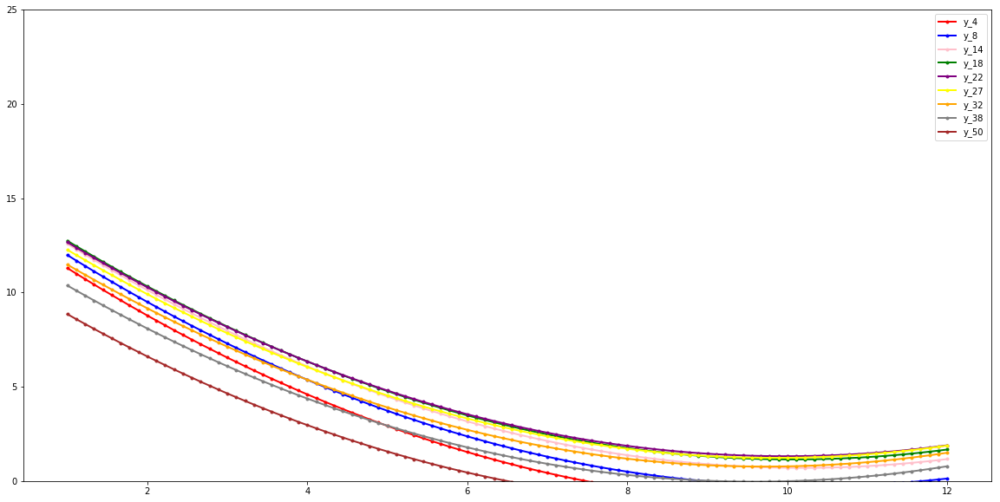

In [588]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))
# n=5
y_name = ['y_4','y_8','y_14','y_18','y_22','y_27','y_32','y_38','y_50']
df_simulated = pd.DataFrame(columns=['y_4','y_8','y_14','y_18','y_22','y_27','y_32','y_38','y_50'])
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 12, 100)

for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 12, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
    
plt.figure(figsize=(20,10))
plt.ylim(0, 25)
plt.plot( 'x', 'y_4', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_8', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_14', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_18', data=df_simulated, marker='.', color='green', linewidth=2)
plt.plot( 'x', 'y_22', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_27', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_32', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_38', data=df_simulated, marker='.', color='grey', linewidth=2)
plt.plot( 'x', 'y_50', data=df_simulated, marker='.', color='brown', linewidth=2)
# plt.plot( 'x', 'y_65', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
# plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
# plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.legend()

In [589]:
# df_simulated.head()

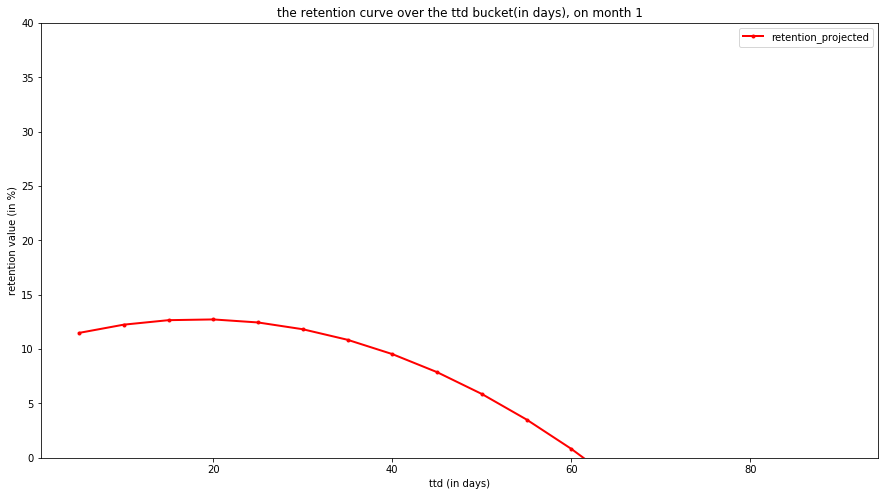

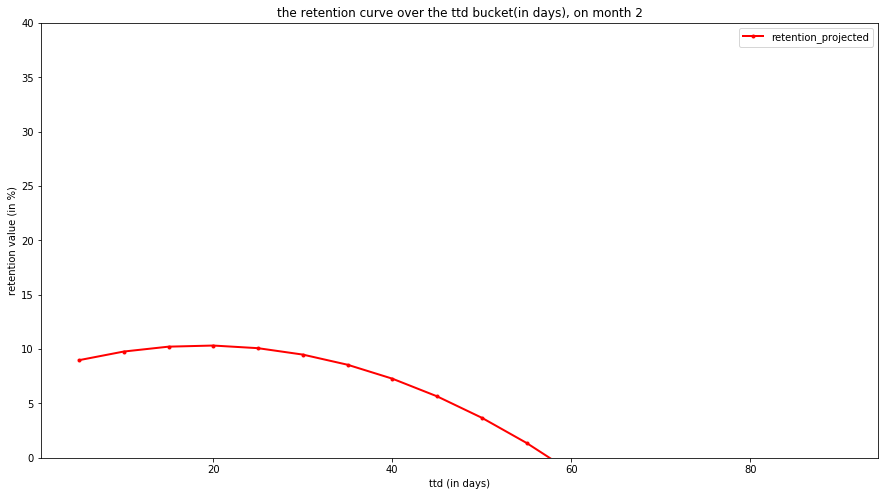

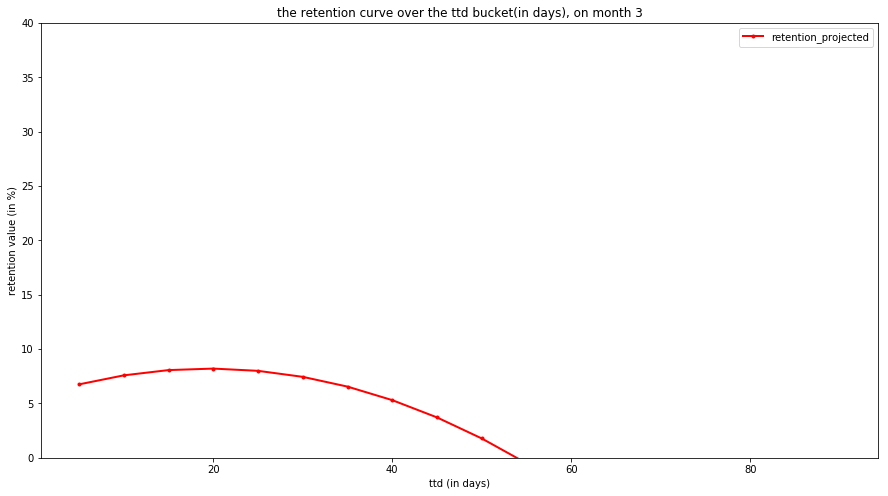

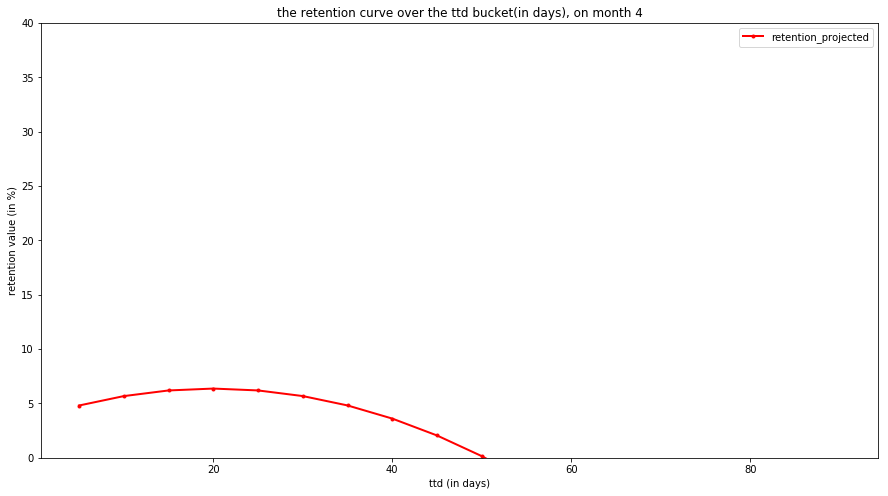

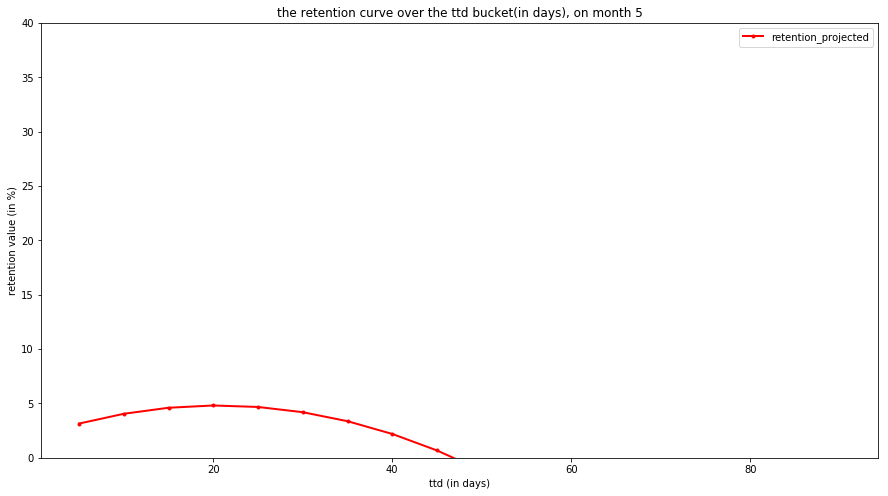

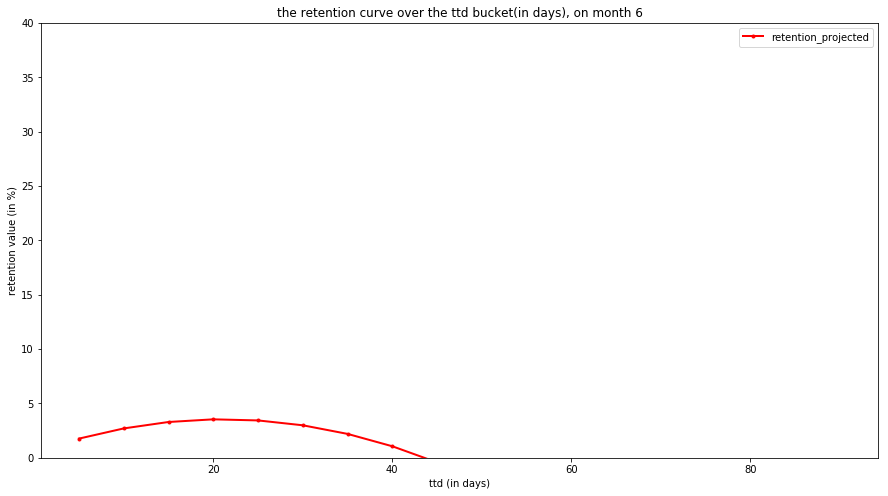

In [590]:
# n=4
month = list(np.arange(1, 7, 1))

for i in month:    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### base model on user cnt base - without considering the refund - weighted on user_cnt

In [599]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict,sample_weight=X2_test_weight)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict,sample_weight=X2_test_weight)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.598176,0.600085,5.089910
2,0.750964,0.753921,3.992667
3,0.809710,0.813778,3.473296
4,0.828832,0.834524,3.274115
5,0.834114,0.841994,3.199355
6,0.836539,0.847022,3.148042
7,0.837802,0.851286,3.103858
8,0.833105,0.850548,3.111552


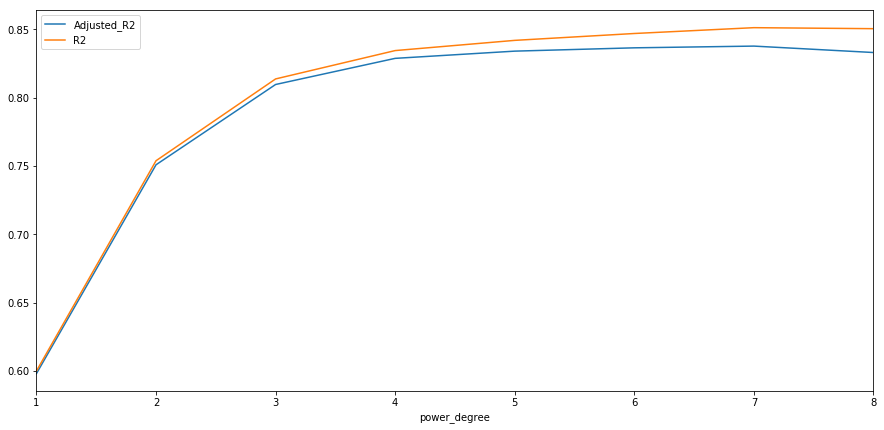

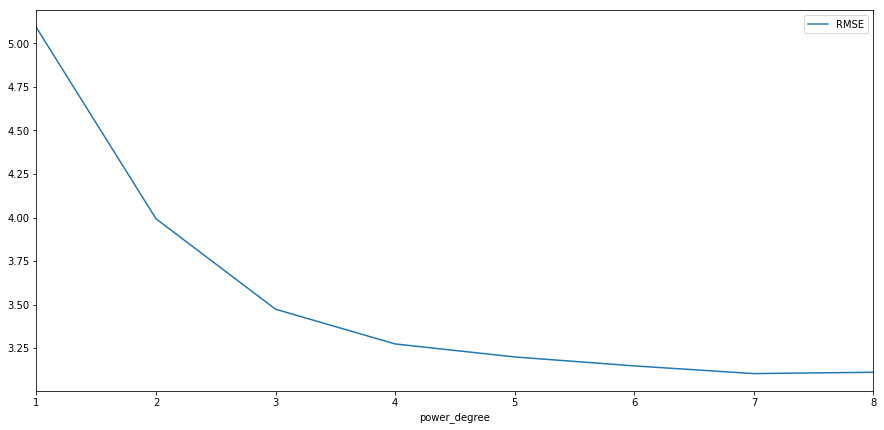

In [600]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

In [605]:
n=2

poly = PolynomialFeatures(n, include_bias=False)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

The polynomial features name are:['mixed_ttd_mean_bucket_med', 'retention_month_bucket', 'mixed_ttd_mean_bucket_med^2', 'mixed_ttd_mean_bucket_med retention_month_bucket', 'retention_month_bucket^2']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

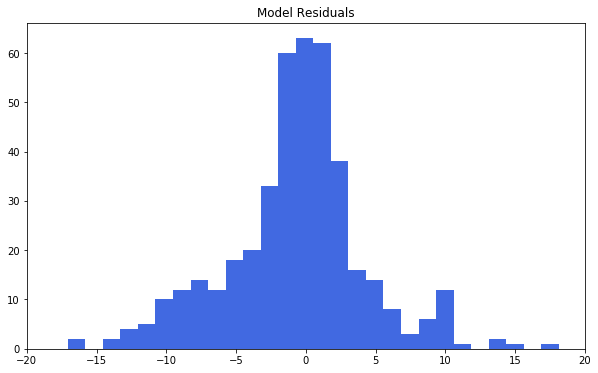

In [606]:
x2_test_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins='auto',figsize=(10, 6))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()

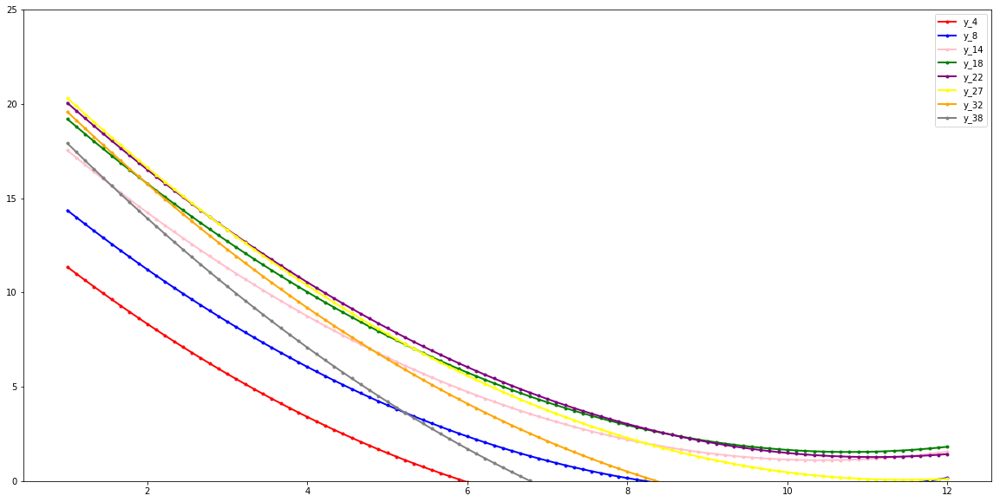

In [607]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket_med)))
# n=4
y_name = ['y_4','y_8','y_14','y_18','y_22','y_27','y_32','y_38','y_50']
df_simulated = pd.DataFrame(columns=y_name)
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 12, 100)

for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 12, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
    
plt.figure(figsize=(20,10))
plt.ylim(0, 25)
plt.plot( 'x', 'y_4', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_8', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_14', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_18', data=df_simulated, marker='.', color='green', linewidth=2)
plt.plot( 'x', 'y_22', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_27', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_32', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_38', data=df_simulated, marker='.', color='grey', linewidth=2)
# plt.plot( 'x', 'y_50', data=df_simulated, marker='.', color='brown', linewidth=2)
# plt.plot( 'x', 'y_65', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='black', linewidth=2)
# plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
# plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
# plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.legend()

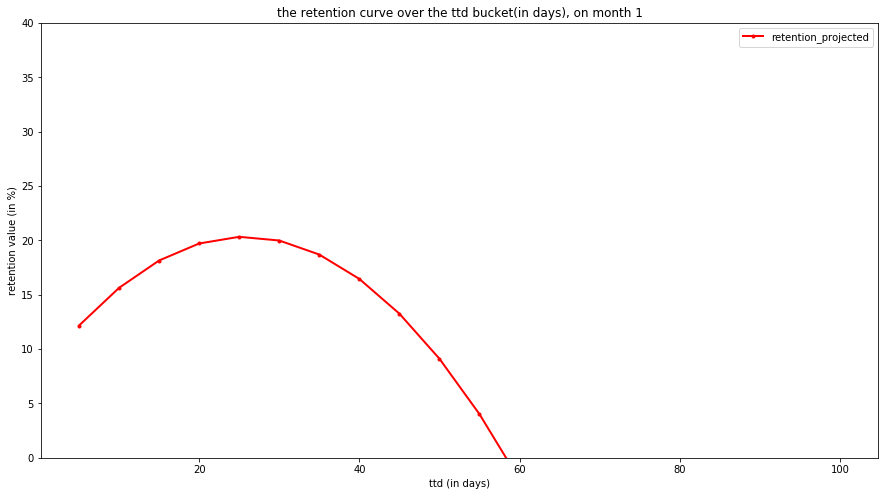

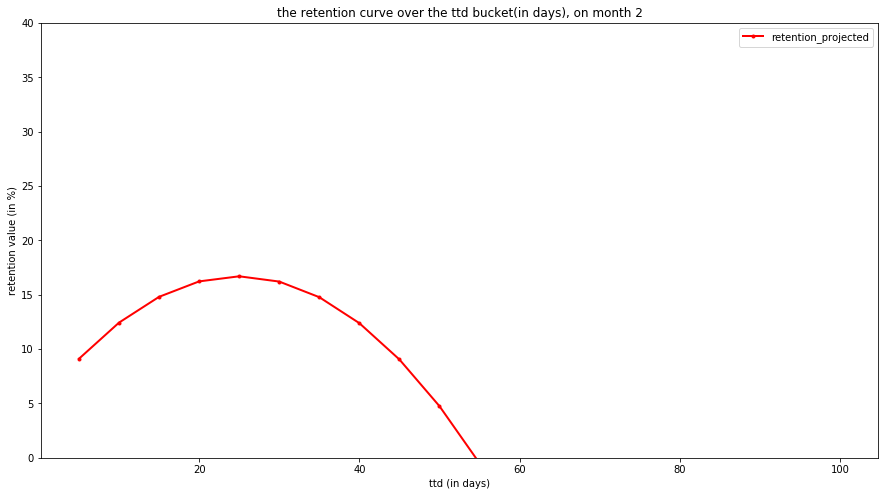

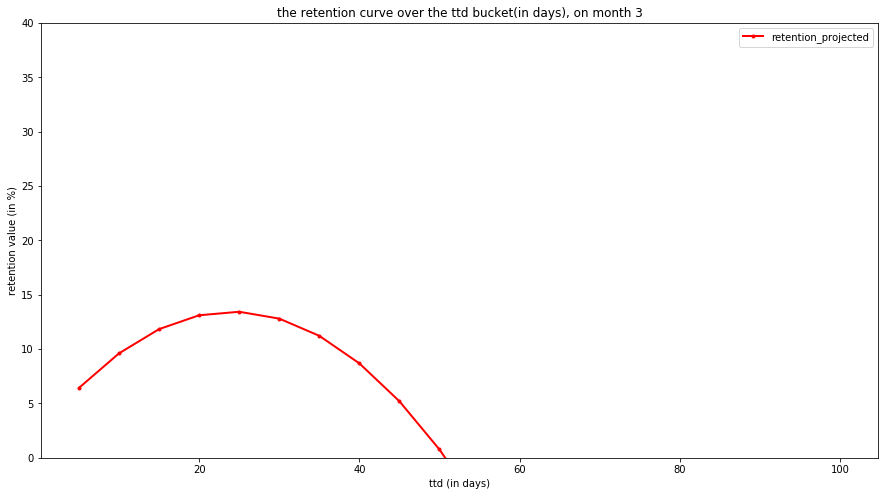

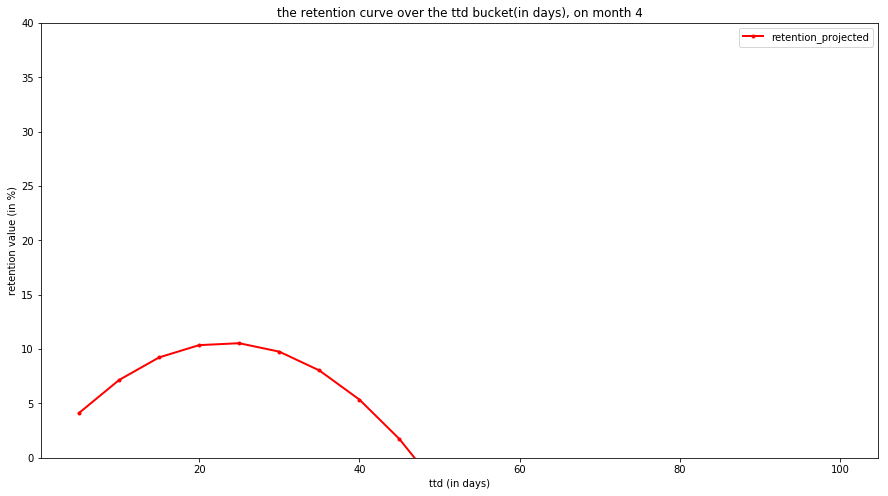

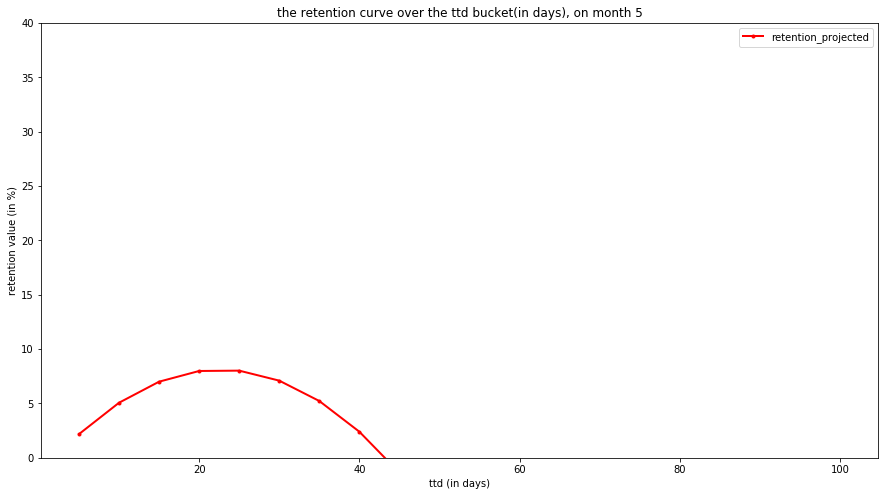

In [608]:
# n=4
month = list(np.arange(1, 6, 1))

for i in month:    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

#### generate a reference table based on the best fitted model

In [969]:
month = np.arange(1, 12.25, 0.25)
# month
ttd = np.arange(5, 101, 1)
# ttd

simulated_features = pd.DataFrame(list(itertools.product(ttd, month)),columns=['mixed_ttd_mean_bucket','rentention_month_bucket'])
len(simulated_features)
# simulated_features[0:5]
y_simulated = poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(simulated_features))
# len(y_simulated)

4320

In [971]:
reference_table = simulated_features.copy()
reference_table['projected_retention_perc'] = y_simulated
reference_table.head()

,mixed_ttd_mean_bucket,rentention_month_bucket,projected_retention_perc
0,5,1.00,7.247013
1,5,1.25,5.693125
2,5,1.50,4.430605
3,5,1.75,3.420748
4,5,2.00,2.628075


In [972]:
reference_table['projected_retention_perc'] = reference_table['projected_retention_perc'].apply(lambda x: max(x,0))

mask = reference_table.projected_retention_perc<0
reference_table[mask]

In [974]:
dw.td_push(reference_table, 'analytics.jay_retention_fcst_v1', if_exists='overwrite')

uploading data converted into a CSV file
performing a bulk import job
[job id 761253948] imported 4320 records.


### model on user based - with considering refund

In [81]:
y= df_base4.retention_value
X = df_base4[['mixed_ttd_mean_bucket','rentention_month_bucket','user_cnt_m0']]
y.head(),X.head()

(0    8.127
 1    7.917
 2    9.048
 3    7.491
 4    7.004
 Name: retention_value, dtype: float64,
    mixed_ttd_mean_bucket  rentention_month_bucket  user_cnt_m0
 0                    5.0                        1        38946
 1                    5.0                        1        33234
 2                    5.0                        1        37090
 3                    5.0                        1        32600
 4                    5.0                        1        29968)

In [82]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_train = X2_train[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_test = X2_test[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_train_weight.shape,X2_train.shape

((1411,), (1411, 2))

In [83]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.369754,0.371841,5.921908
2,0.400038,0.405005,5.763466
3,0.421596,0.430214,5.640048
4,0.446635,0.459461,5.493391
5,0.454354,0.472422,5.427132
6,0.442722,0.467633,5.451707
7,0.440720,0.473129,5.423493
8,0.403818,0.447249,5.555100


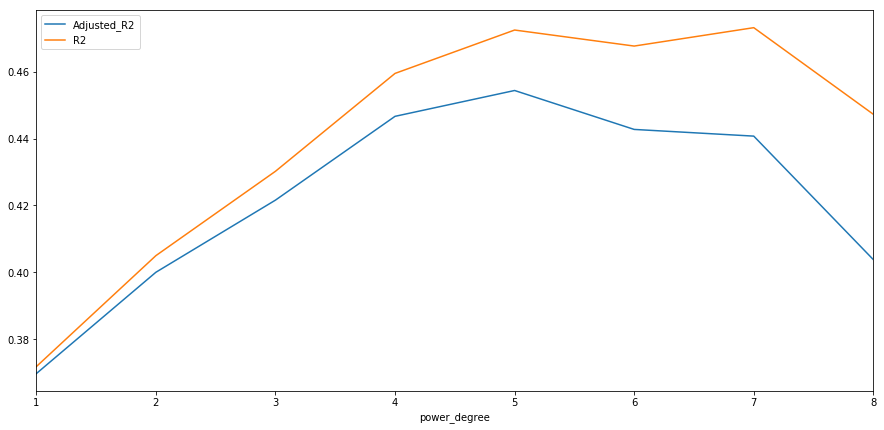

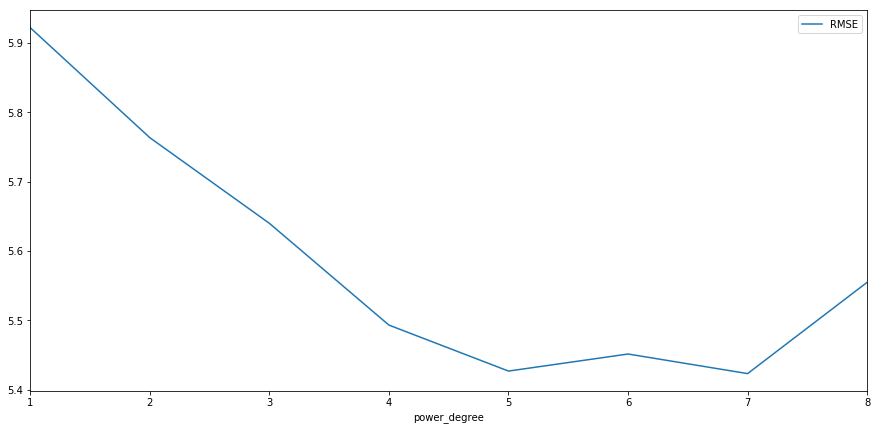

In [84]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

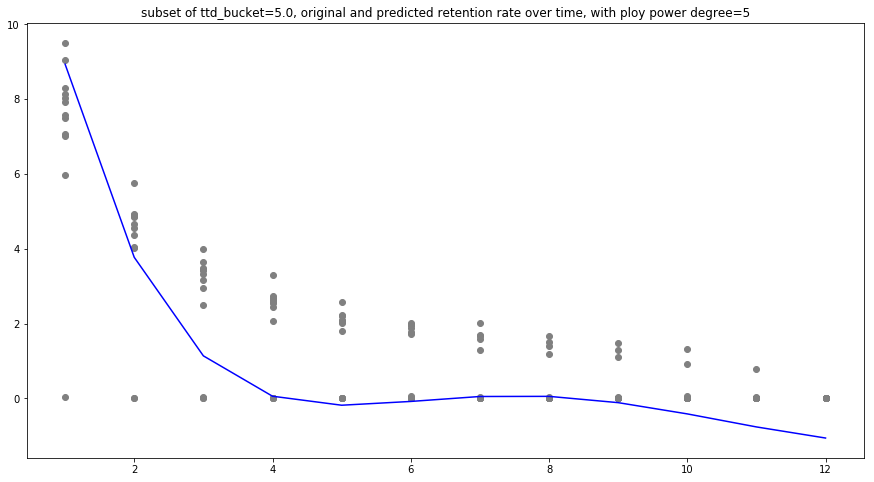

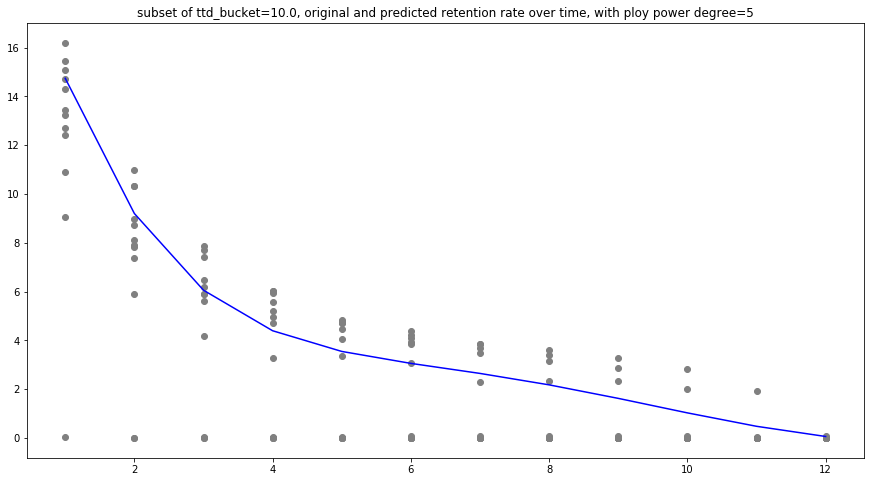

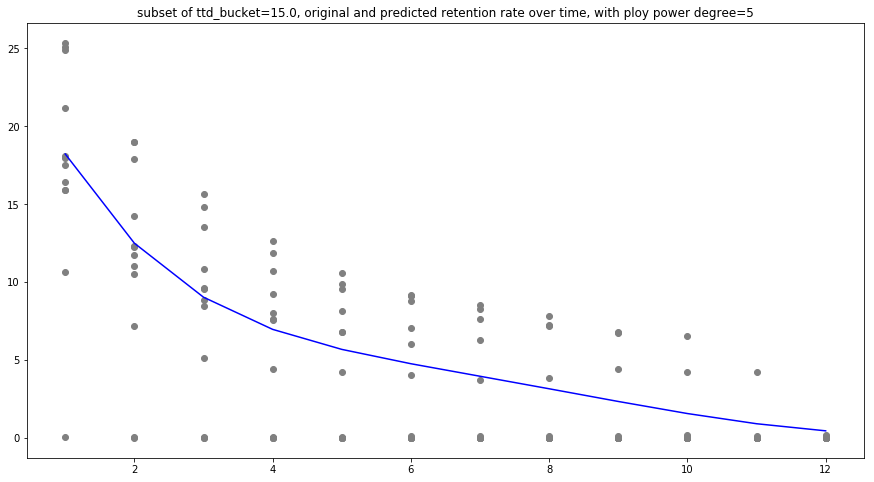

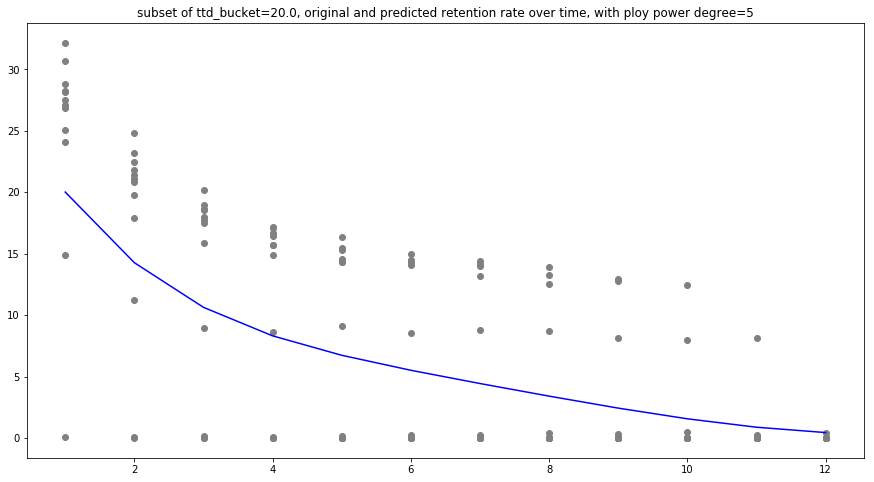

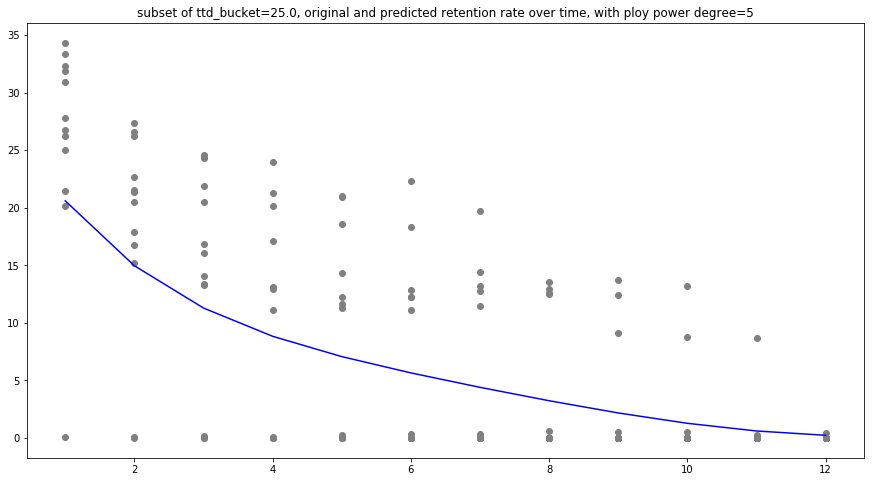

...

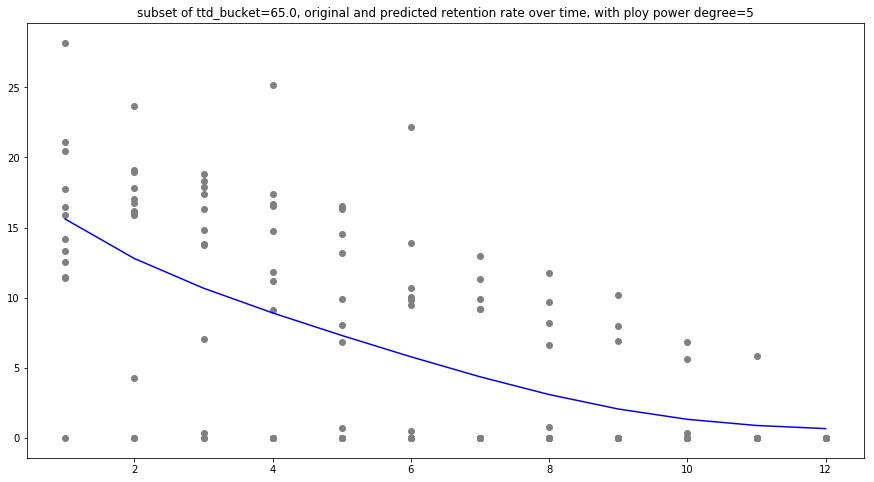

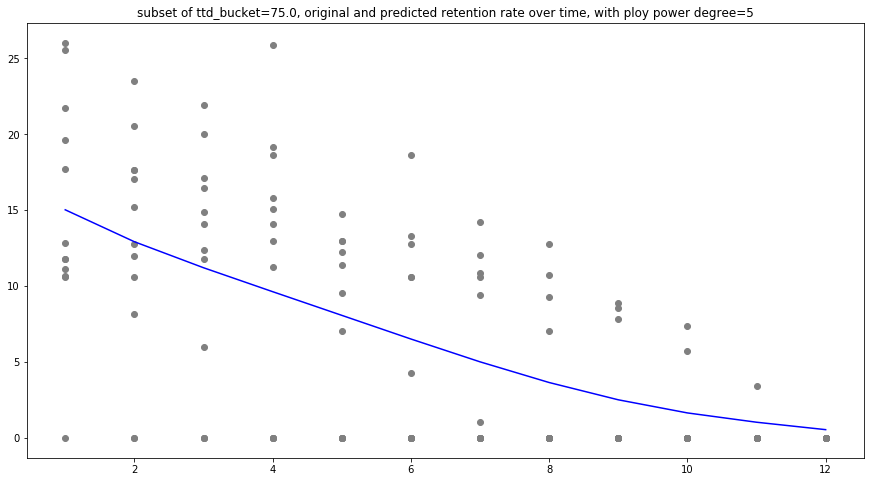

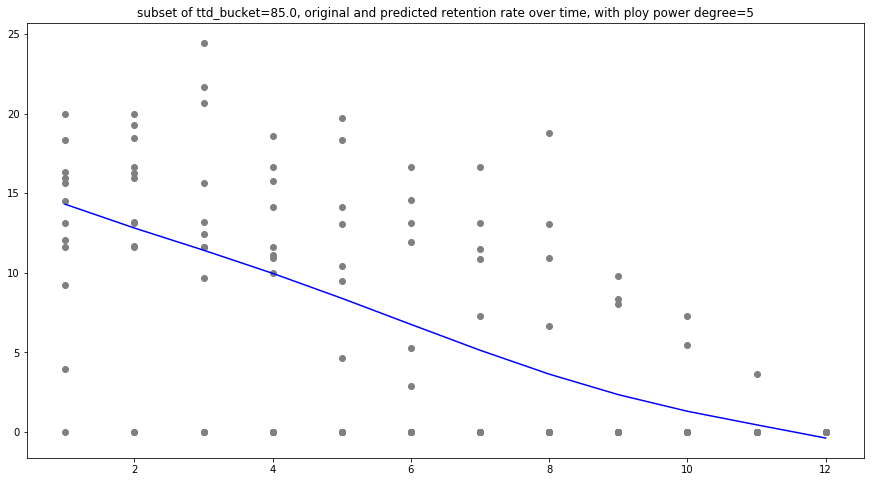

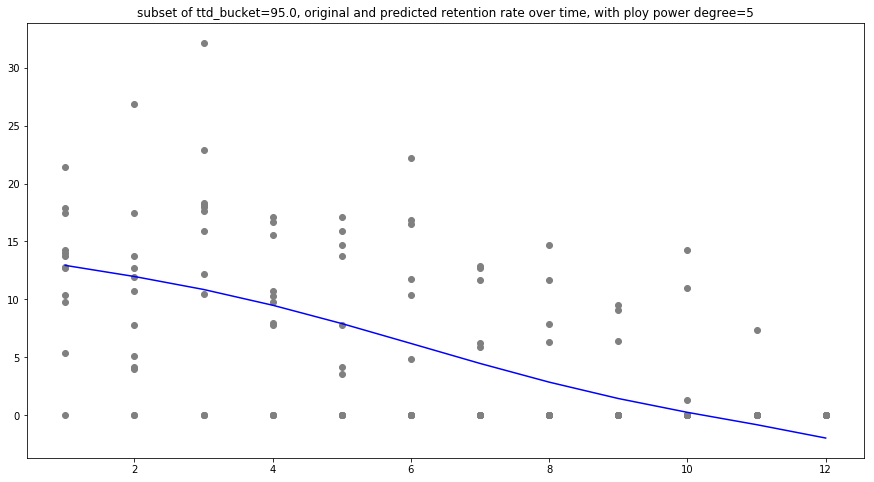

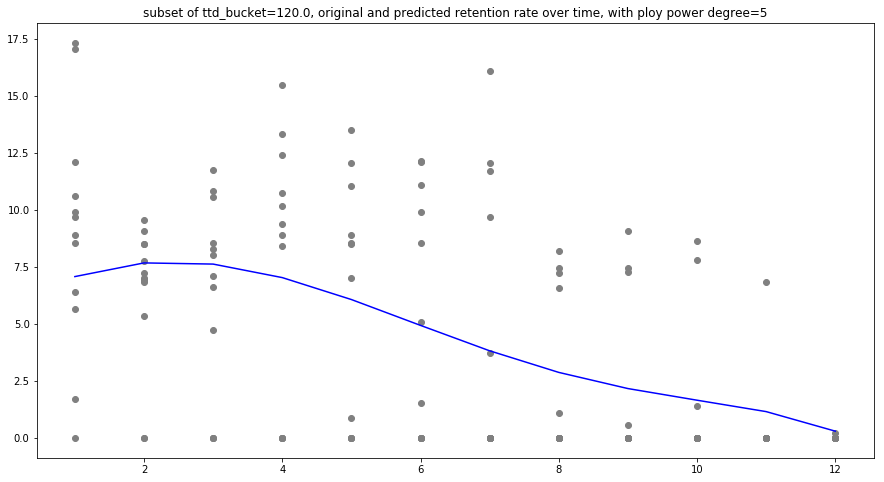

In [93]:
ttd_bucket = sorted(list(set(df_base4.mixed_ttd_mean_bucket)))
n=5

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

for i in ttd_bucket:
    mask = df_base4.mixed_ttd_mean_bucket ==i
    X_sub = df_base4.loc[mask,['mixed_ttd_mean_bucket','rentention_month_bucket']]
    y_sub = df_base4.loc[mask,'retention_value']
    y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

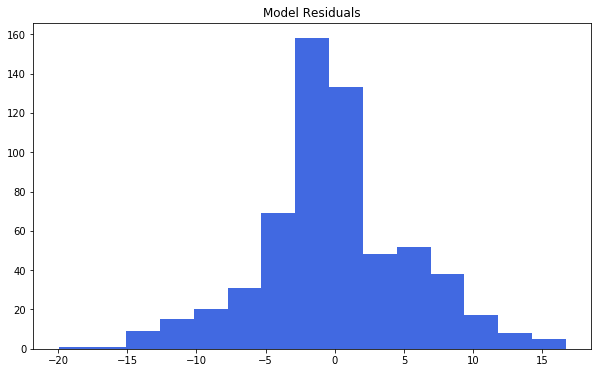

In [94]:
x2_test_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=15,figsize=(10, 6))
plt.title("Model Residuals")
plt.show()

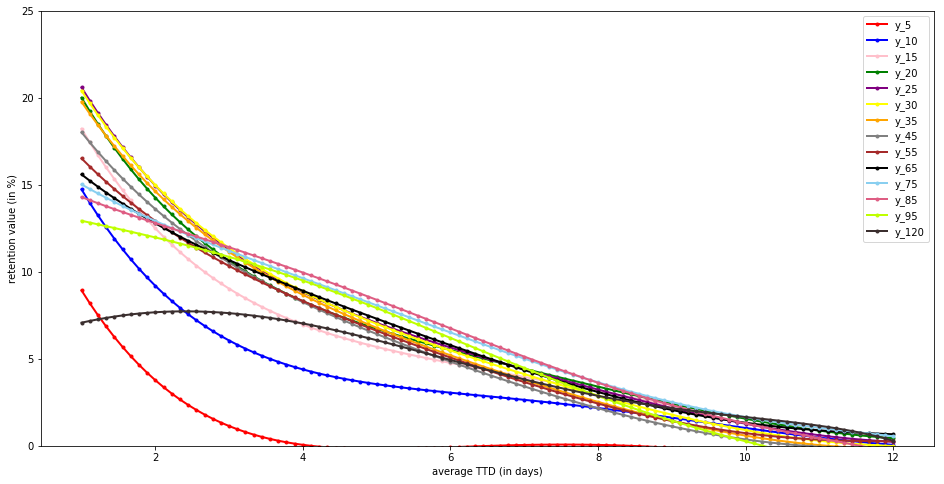

In [95]:
ttd_bucket = sorted(list(set(df_base4.mixed_ttd_mean_bucket)))
n=5
y_name = ['y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120']
df_simulated = pd.DataFrame(columns=['x','y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120'])
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 12, 100)

for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 12, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
    
plt.figure(figsize=(16,8))
plt.ylim(0, 25)
plt.plot( 'x', 'y_5', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_10', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_15', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_20', data=df_simulated, marker='.', color='green', linewidth=2)
plt.plot( 'x', 'y_25', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_30', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_35', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_45', data=df_simulated, marker='.', color='grey', linewidth=2)
plt.plot( 'x', 'y_55', data=df_simulated, marker='.', color='brown', linewidth=2)
plt.plot( 'x', 'y_65', data=df_simulated, marker='.', color='black', linewidth=2)
plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='#89CFF0', linewidth=2)
plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.xlabel('average TTD (in days)')
plt.ylabel('retention value (in %)')
plt.legend()
# plt.title('The predicted retention curve over the month, given the ttd_bucket= {} days, on {} degree polynomial regression'.format(i,n))

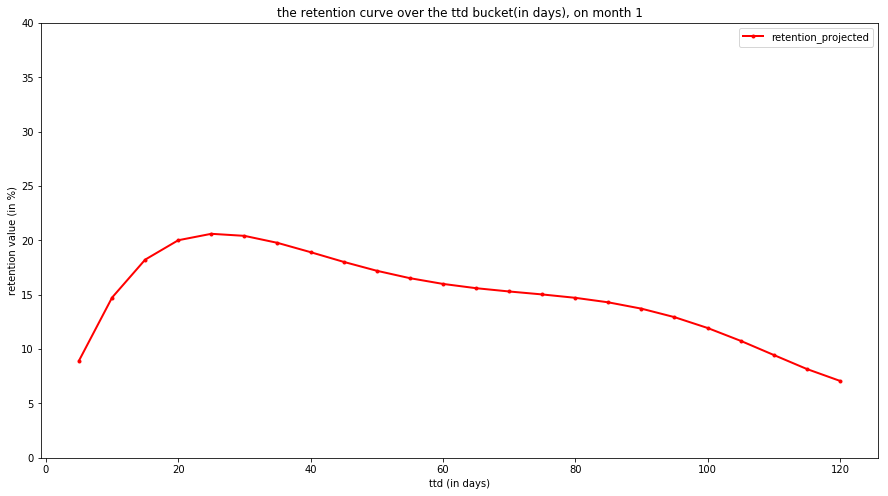

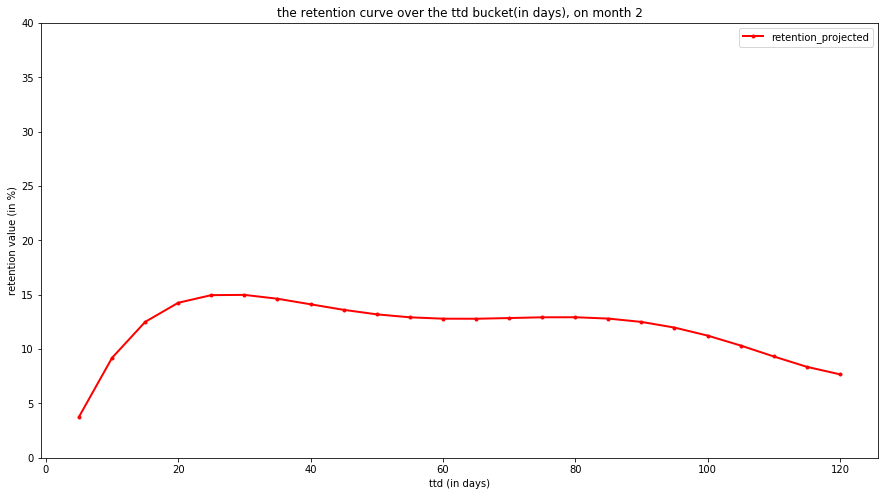

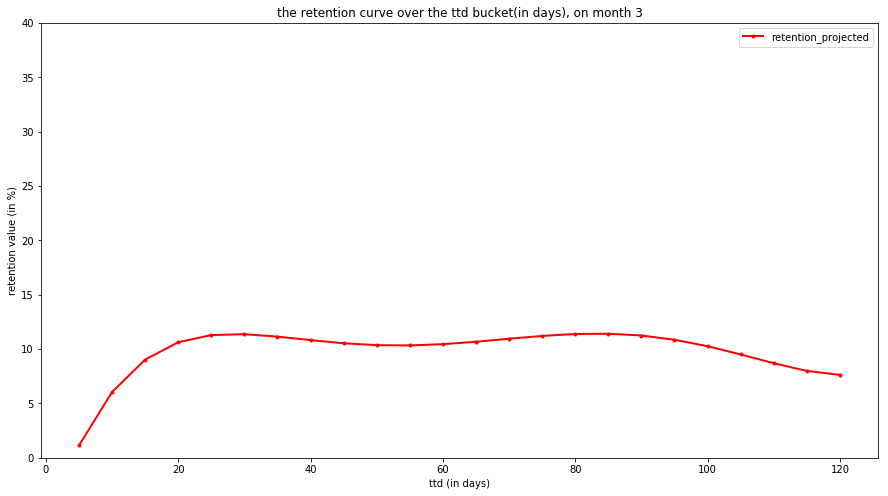

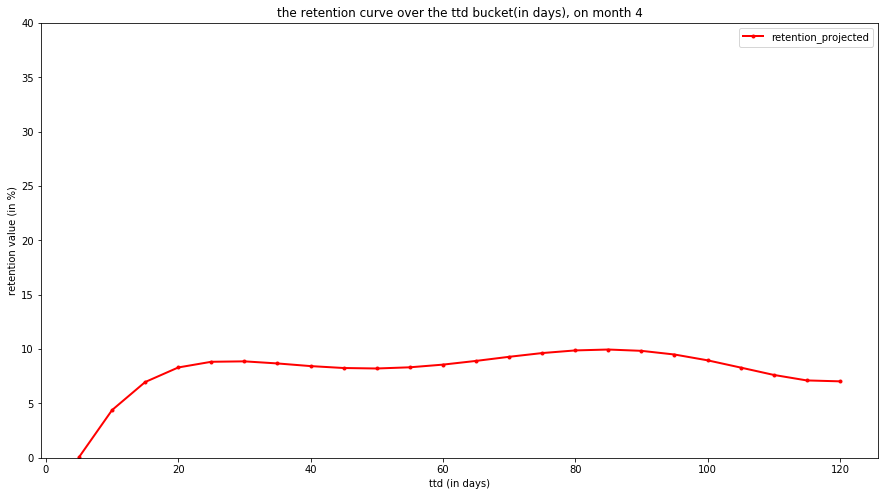

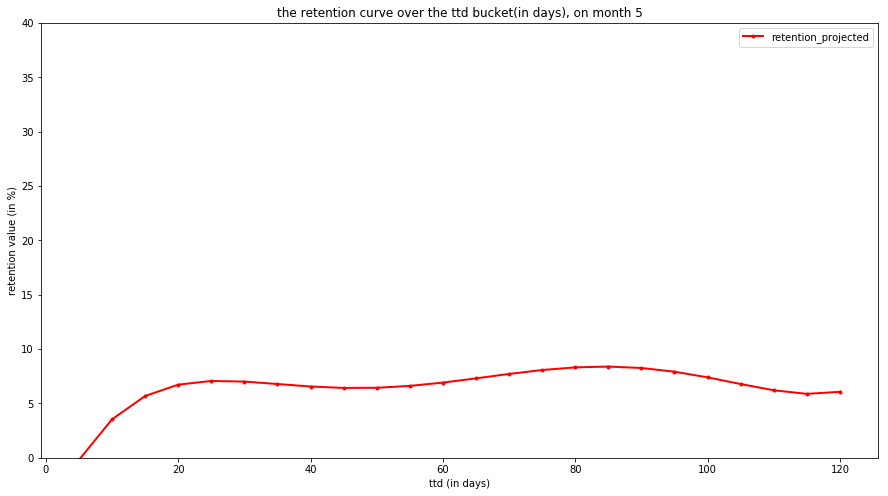

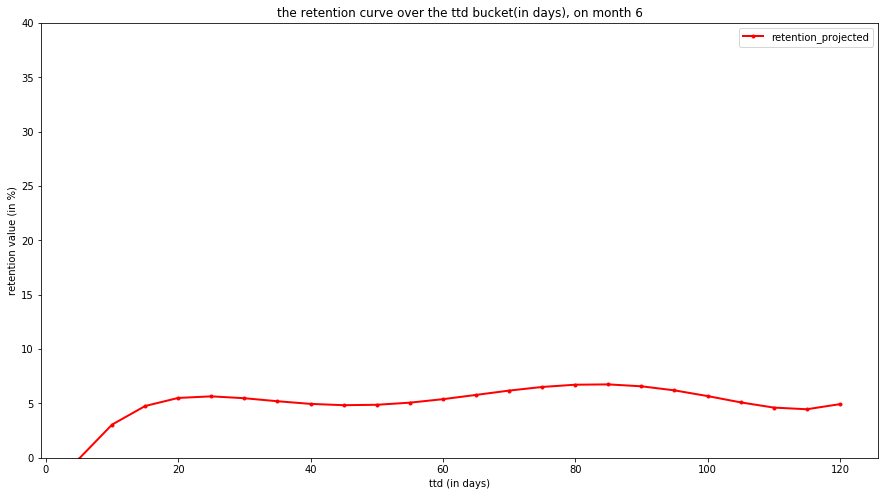

In [96]:
month = list(np.arange(1, 7, 1))

for i in month:    
    ttd = list(np.arange(5, 125, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### model on transaction based - without considering refund

In [60]:
df_base3.head()

,mixed_ttd_mean_bucket,first_txn_month,trans_cnt_m0,rentention_month_bucket,trans_cnt,retention_value
0,5.0,2019-01,92479,1,8391,9.073
1,5.0,2019-02,90758,1,6453,7.110
2,5.0,2019-03,102074,1,7377,7.227
3,5.0,2019-04,86307,1,5611,6.501
4,5.0,2019-05,72761,1,4569,6.279


In [59]:
y= df_base3.retention_value
X = df_base3[['mixed_ttd_mean_bucket','rentention_month_bucket','trans_cnt_m0']]
y.head(),X.head()

(0    9.073
 1    7.110
 2    7.227
 3    6.501
 4    6.279
 Name: retention_value, dtype: float64,
    mixed_ttd_mean_bucket  rentention_month_bucket  trans_cnt_m0
 0                    5.0                        1         92479
 1                    5.0                        1         90758
 2                    5.0                        1        102074
 3                    5.0                        1         86307
 4                    5.0                        1         72761)

In [61]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['trans_cnt_m0']
X2_train = X2_train[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_test = X2_test[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_train_weight.shape,X2_train.shape

((1411,), (1411, 2))

In [62]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.313592,0.315865,5.770579
2,0.338364,0.343841,5.651357
3,0.355719,0.365320,5.558094
4,0.379019,0.393413,5.433690
5,0.381711,0.402184,5.394261
6,0.367538,0.395811,5.422940
7,0.361999,0.398969,5.408747
8,0.331436,0.380140,5.492818


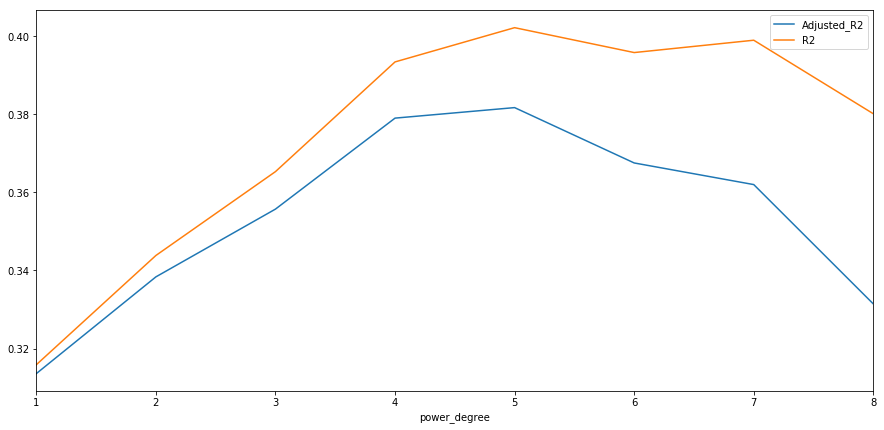

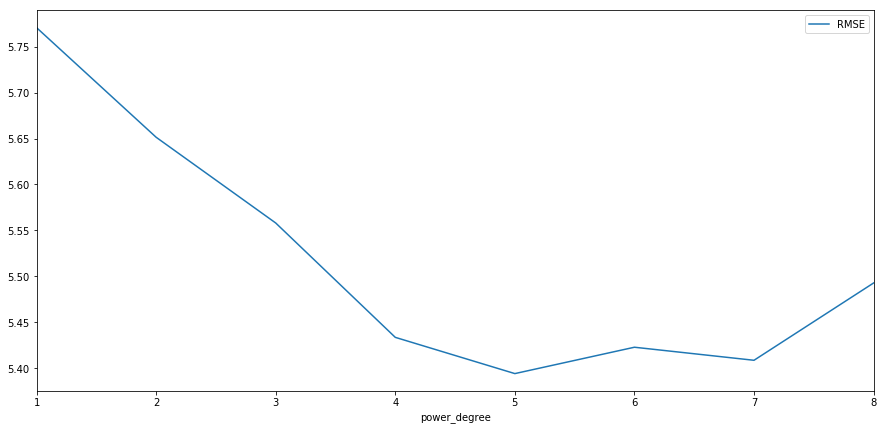

In [63]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

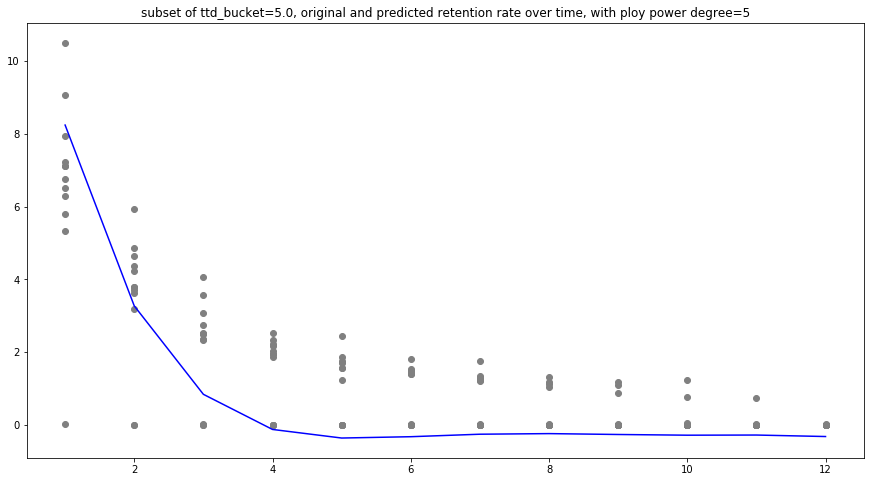

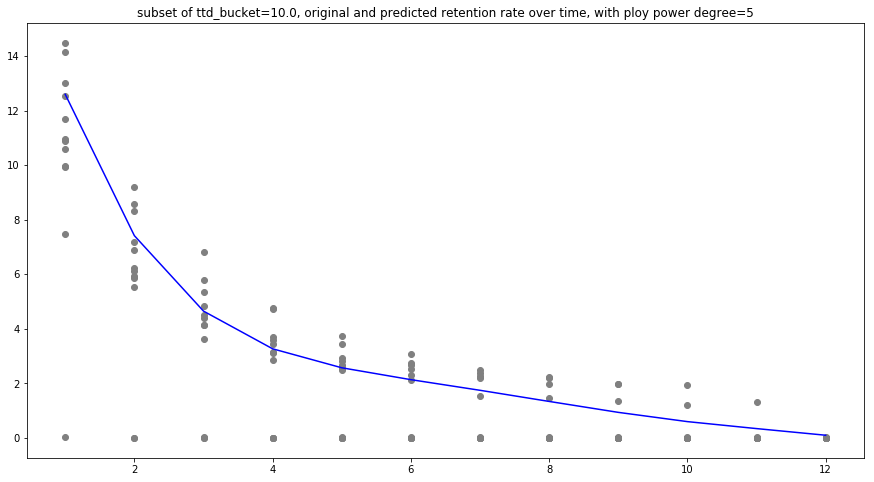

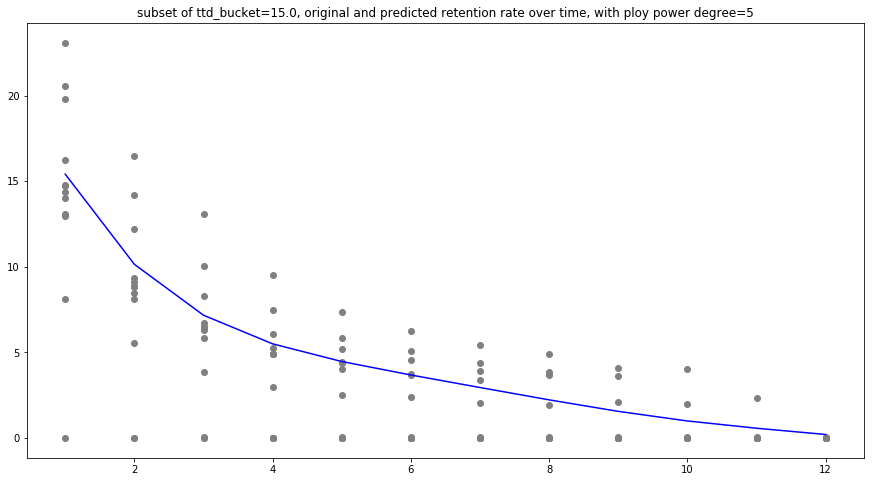

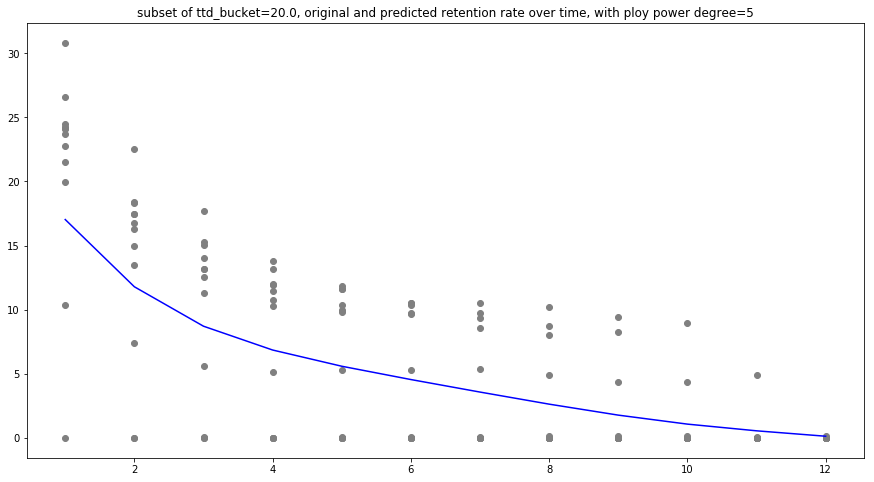

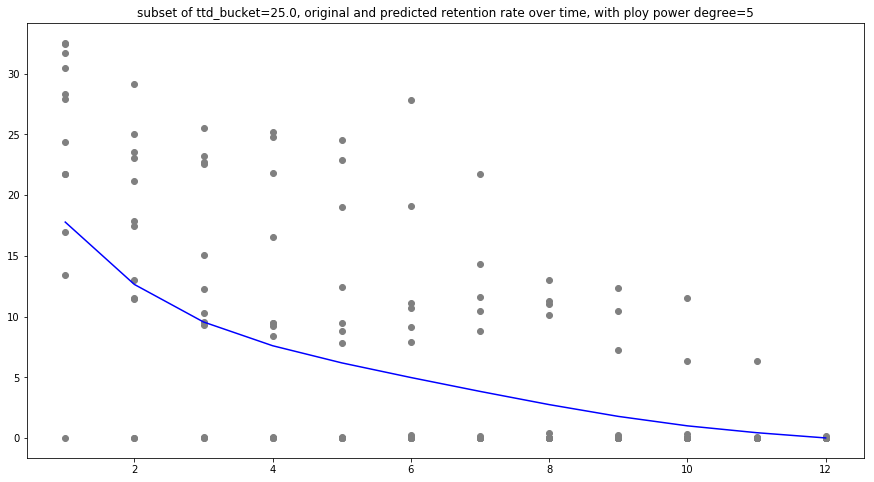

...

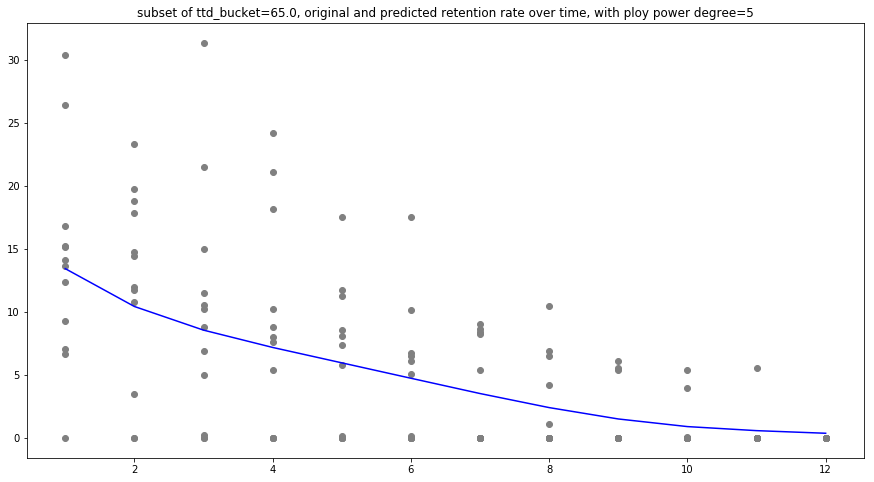

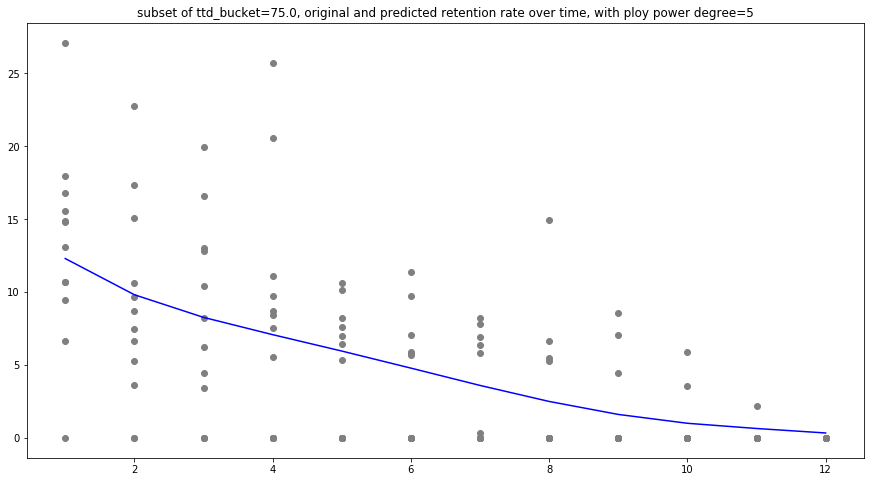

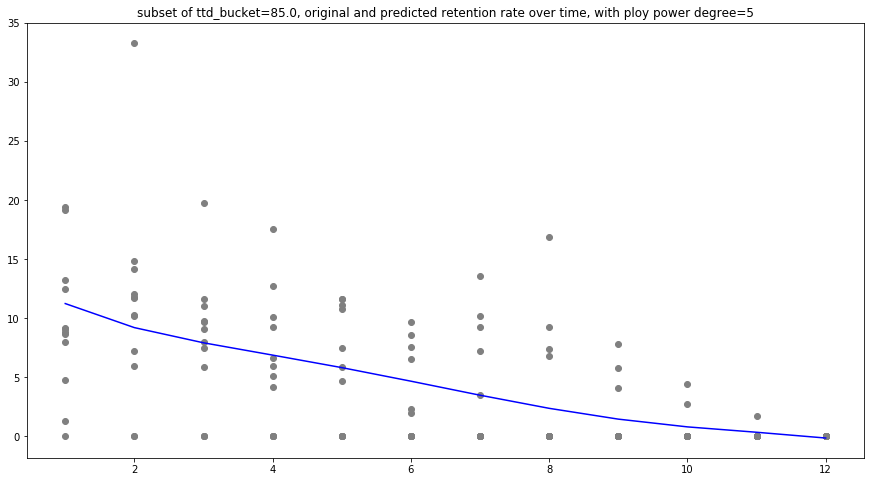

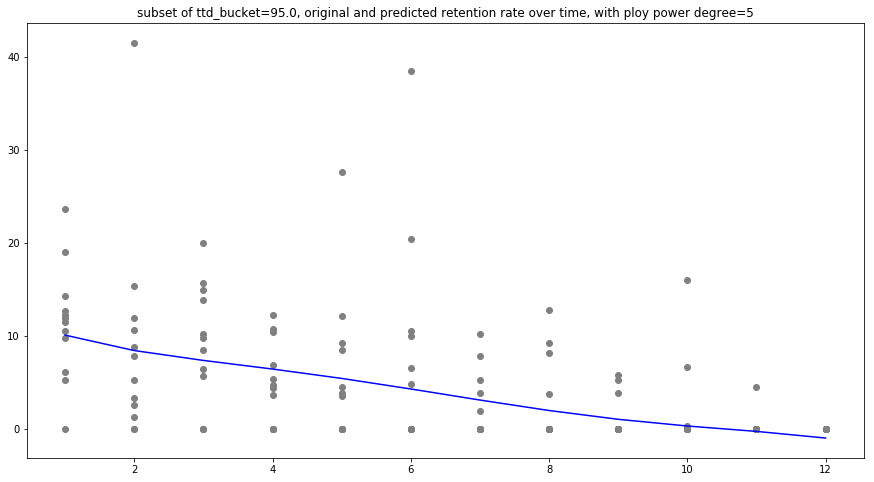

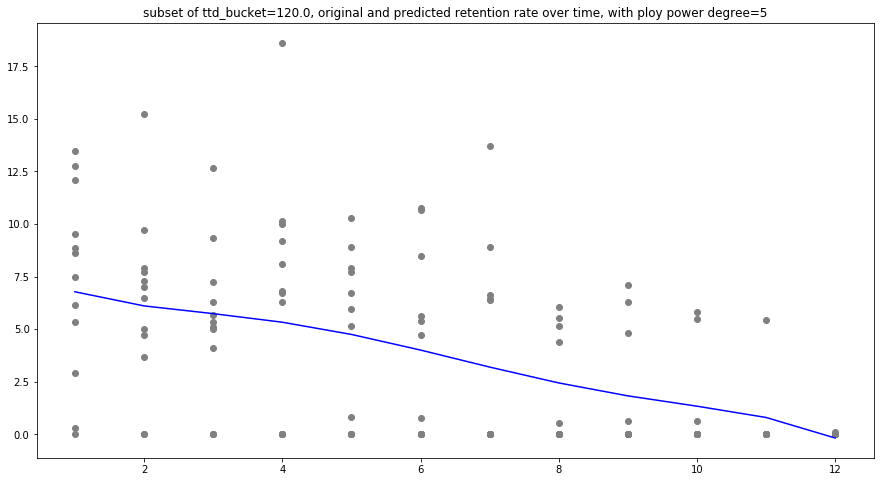

In [64]:
ttd_bucket = sorted(list(set(df_base3.mixed_ttd_mean_bucket)))
n=5

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

for i in ttd_bucket:
    mask = df_base3.mixed_ttd_mean_bucket ==i
    X_sub = df_base3.loc[mask,['mixed_ttd_mean_bucket','rentention_month_bucket']]
    y_sub = df_base3.loc[mask,'retention_value']
    y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

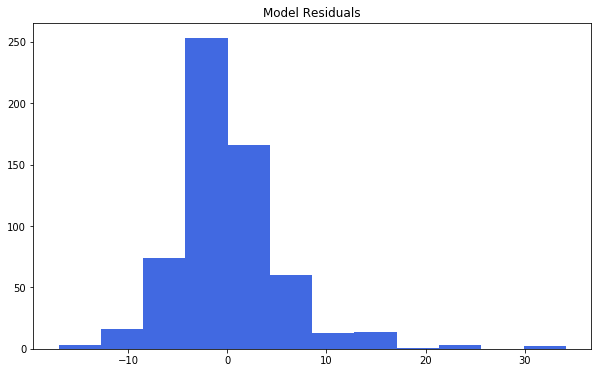

In [67]:
x2_test_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=12,figsize=(10, 6))
plt.title("Model Residuals")
plt.show()

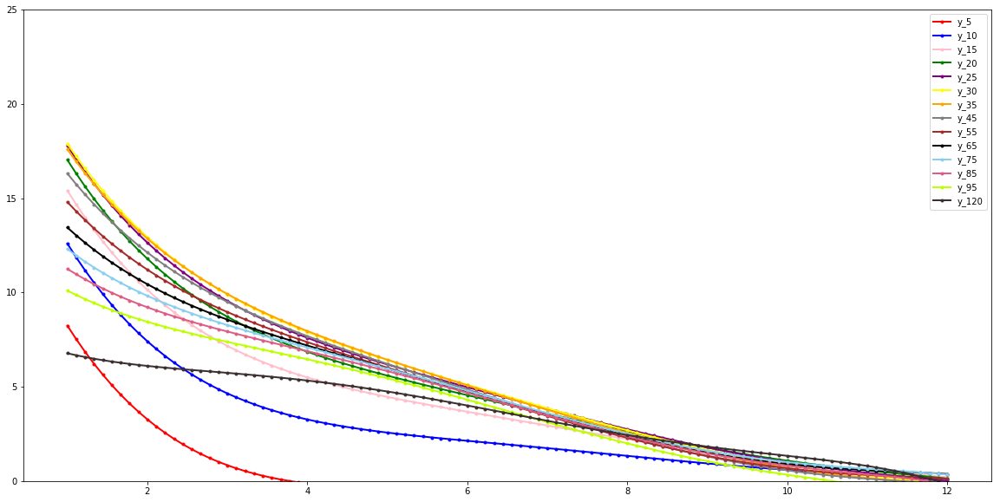

In [68]:
ttd_bucket = sorted(list(set(df_base3.mixed_ttd_mean_bucket)))
n=5
y_name = ['y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120']
df_simulated = pd.DataFrame(columns=['x','y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120'])
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 12, 100)

for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 12, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
    
plt.figure(figsize=(20,10))
plt.ylim(0, 25)
plt.plot( 'x', 'y_5', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_10', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_15', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_20', data=df_simulated, marker='.', color='green', linewidth=2)
plt.plot( 'x', 'y_25', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_30', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_35', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_45', data=df_simulated, marker='.', color='grey', linewidth=2)
plt.plot( 'x', 'y_55', data=df_simulated, marker='.', color='brown', linewidth=2)
plt.plot( 'x', 'y_65', data=df_simulated, marker='.', color='black', linewidth=2)
plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='#89CFF0', linewidth=2)
plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.legend()

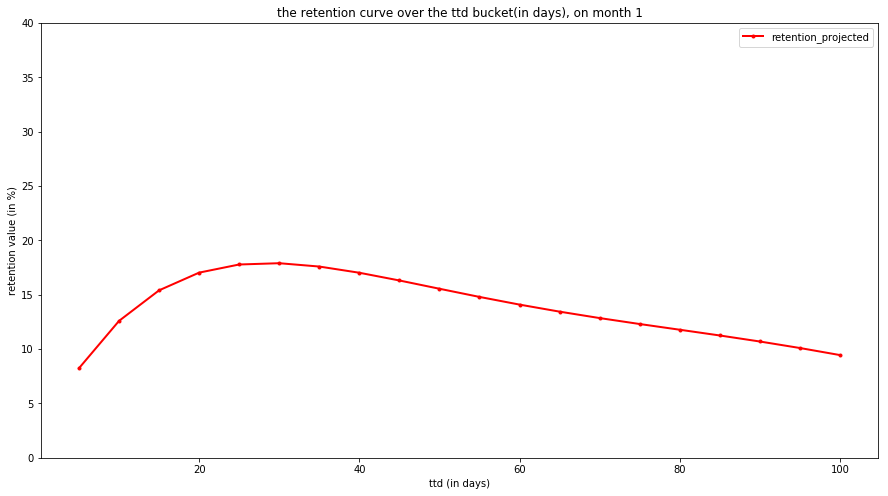

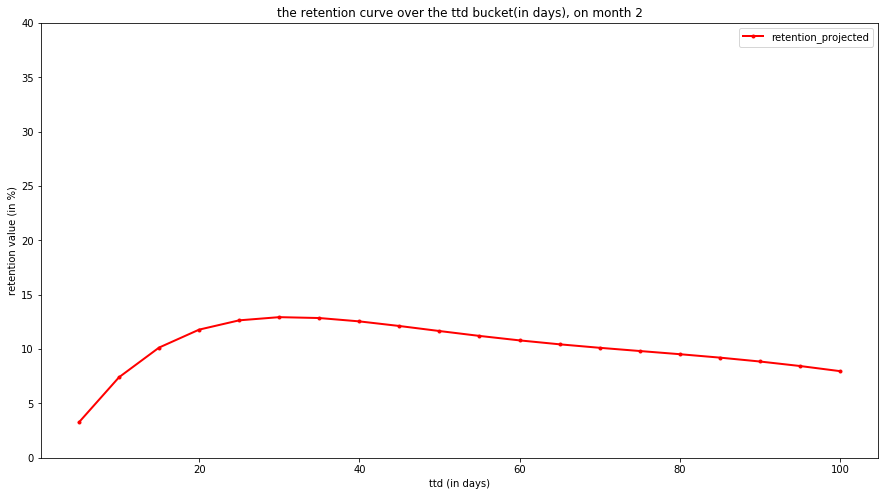

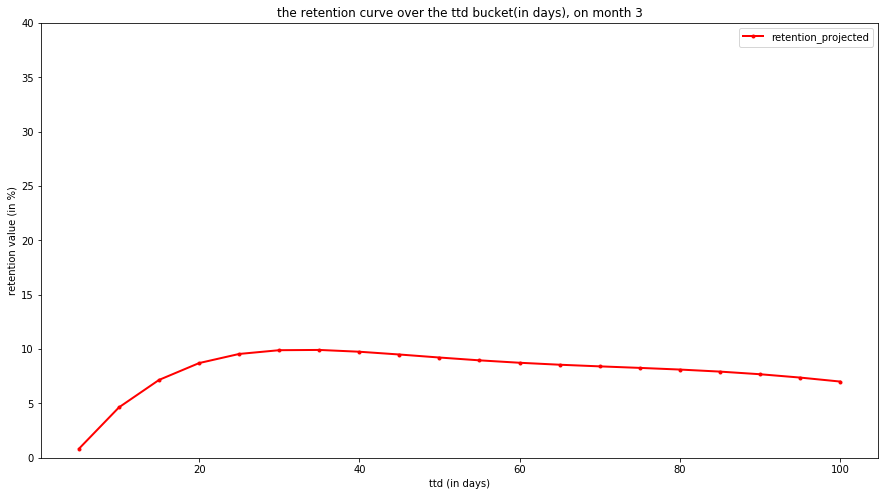

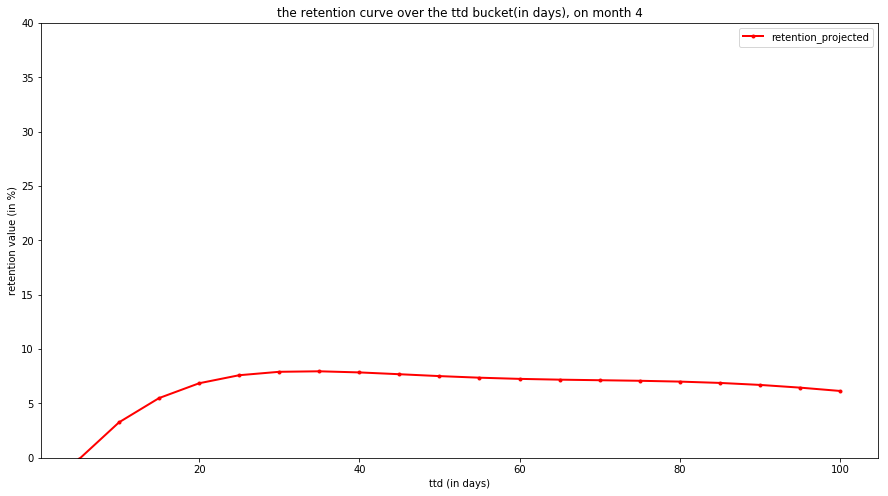

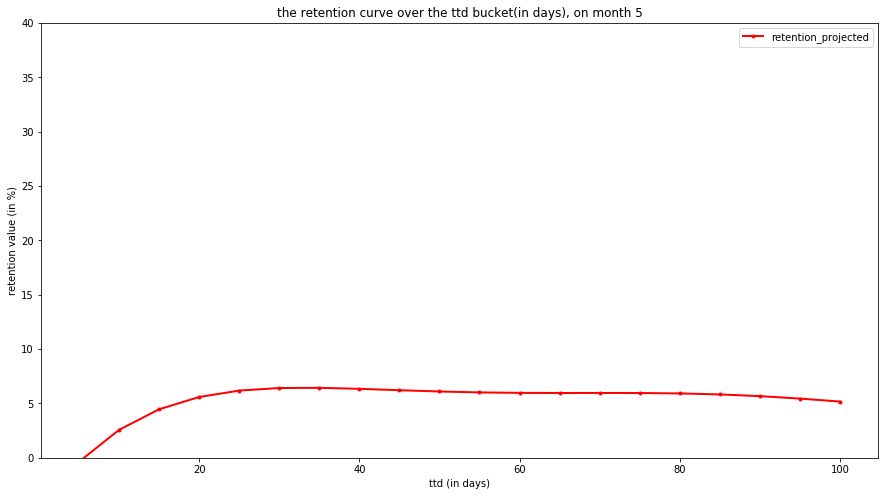

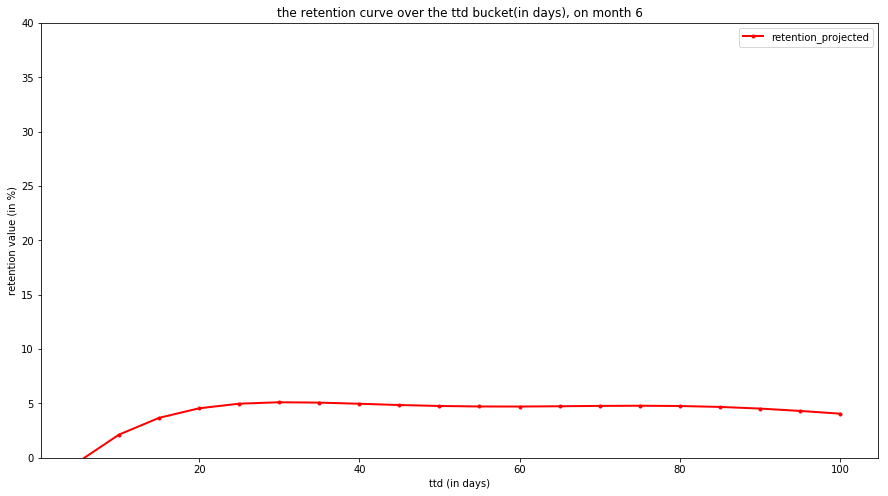

In [69]:
n=5
month = list(np.arange(1, 7, 1))

for i in month:    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### model on transaction based - with considering refund

In [102]:
df_base5.head()

,mixed_ttd_mean_bucket,first_txn_month,trans_cnt_m0,rentention_month_bucket,trans_cnt,retention_value
0,5.0,2019-01,91388,1,8247,9.073
1,5.0,2019-02,89726,1,6341,7.110
2,5.0,2019-03,100536,1,7259,7.227
3,5.0,2019-04,84755,1,5472,6.501
4,5.0,2019-05,71481,1,4420,6.279


In [103]:
y= df_base5.retention_value
X = df_base5[['mixed_ttd_mean_bucket','rentention_month_bucket','trans_cnt_m0']]
y.head(),X.head()

(0    9.073
 1    7.110
 2    7.227
 3    6.501
 4    6.279
 Name: retention_value, dtype: float64,
    mixed_ttd_mean_bucket  rentention_month_bucket  trans_cnt_m0
 0                    5.0                        1         91388
 1                    5.0                        1         89726
 2                    5.0                        1        100536
 3                    5.0                        1         84755
 4                    5.0                        1         71481)

In [104]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['trans_cnt_m0']
X2_train = X2_train[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_test = X2_test[['mixed_ttd_mean_bucket','rentention_month_bucket']]
X2_train_weight.shape,X2_train.shape

((1411,), (1411, 2))

In [105]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.313592,0.315865,5.770579
2,0.338364,0.343841,5.651357
3,0.355719,0.365320,5.558094
4,0.379019,0.393413,5.433690
5,0.381711,0.402184,5.394261
6,0.367538,0.395811,5.422940
7,0.361999,0.398969,5.408747
8,0.331436,0.380140,5.492818


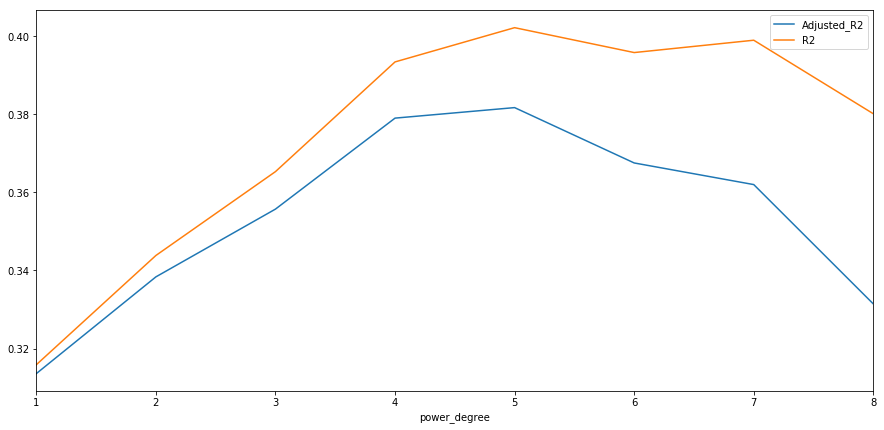

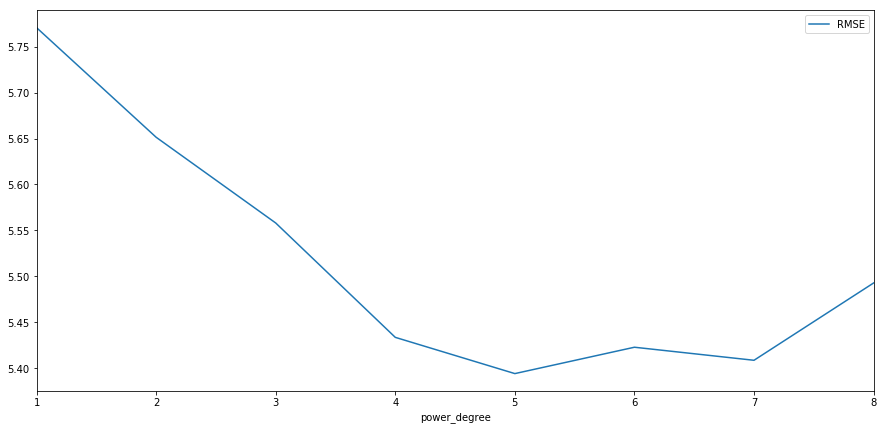

In [106]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

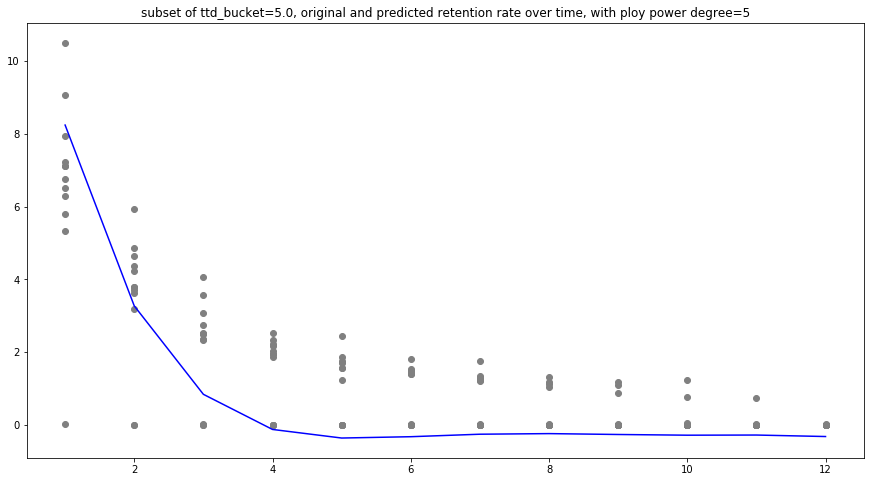

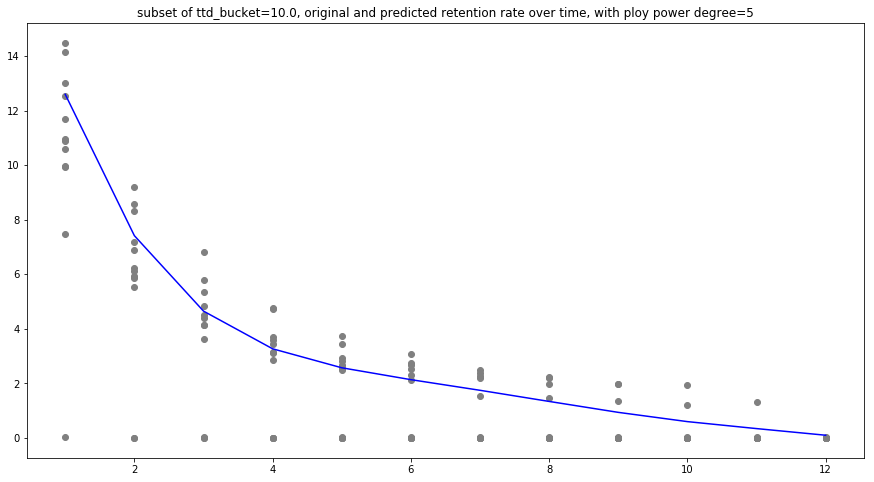

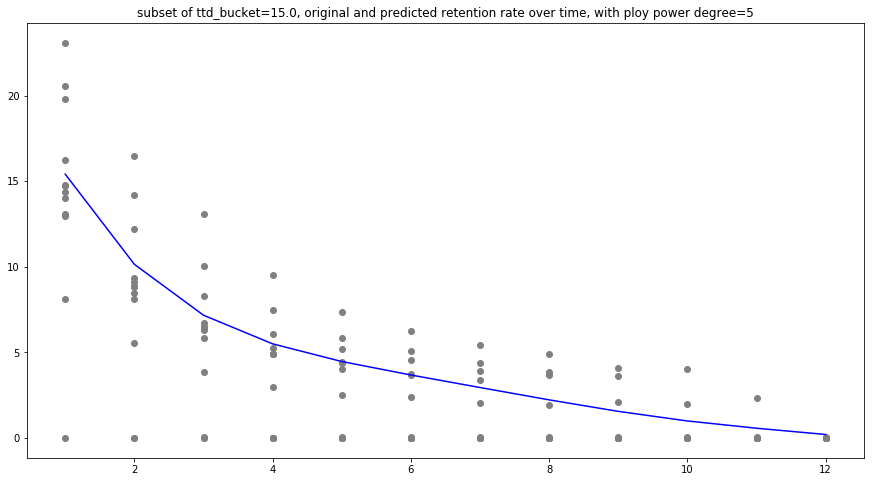

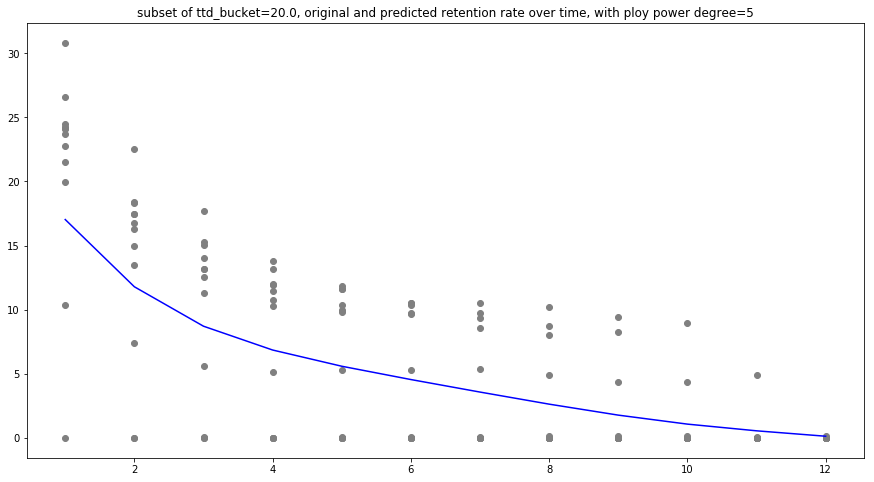

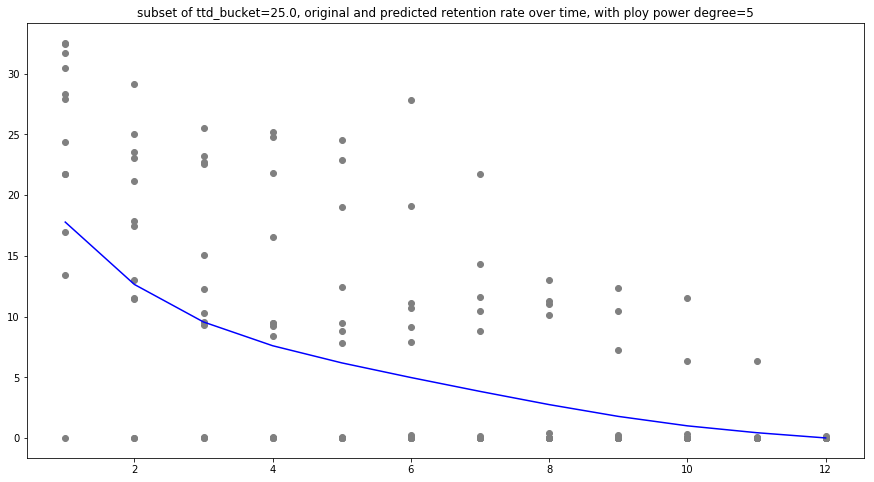

...

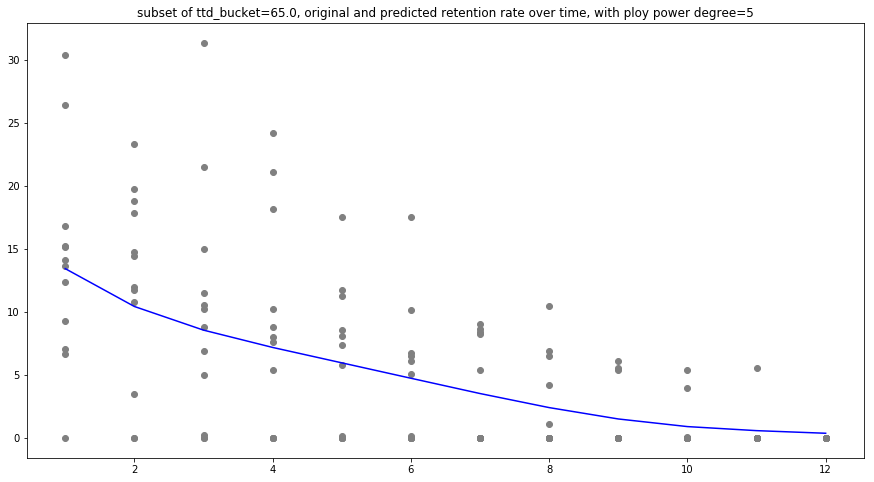

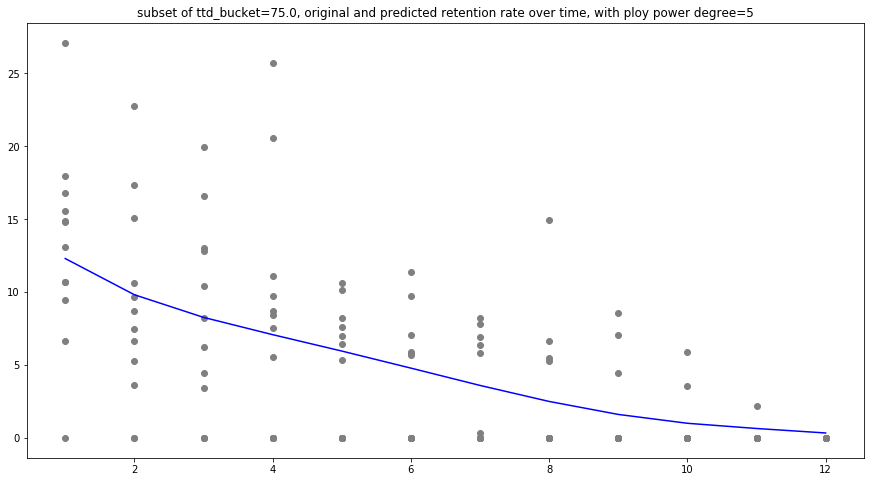

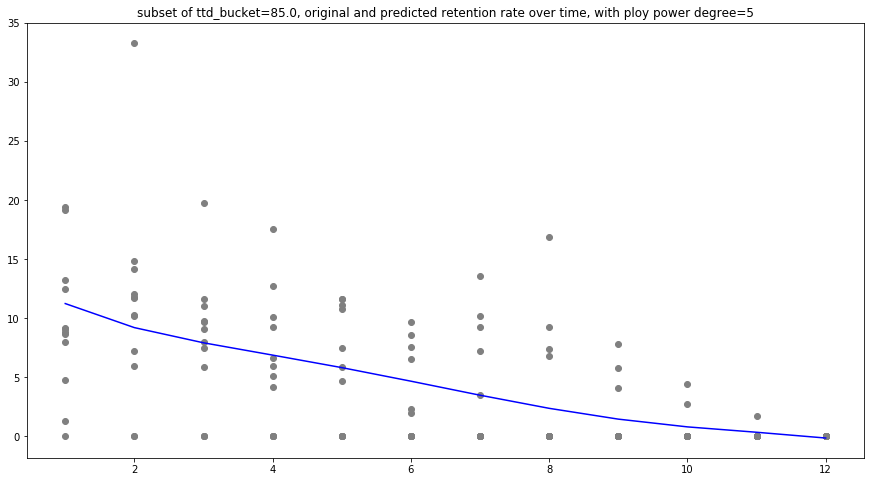

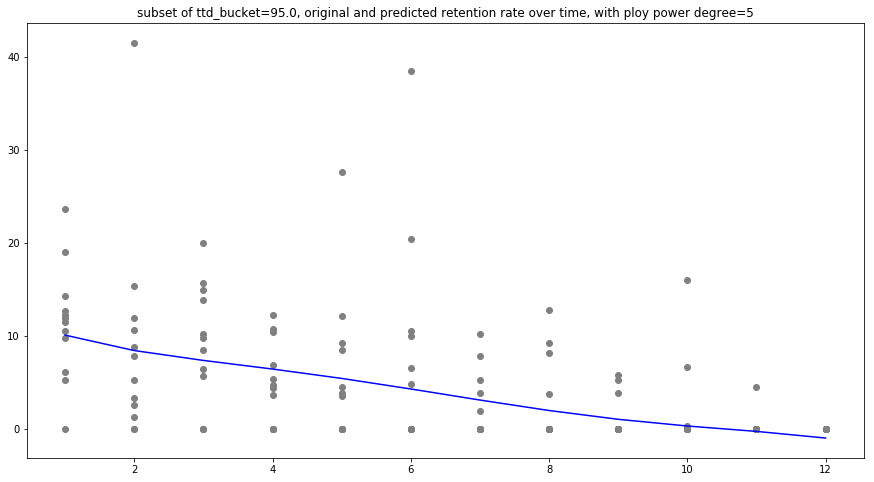

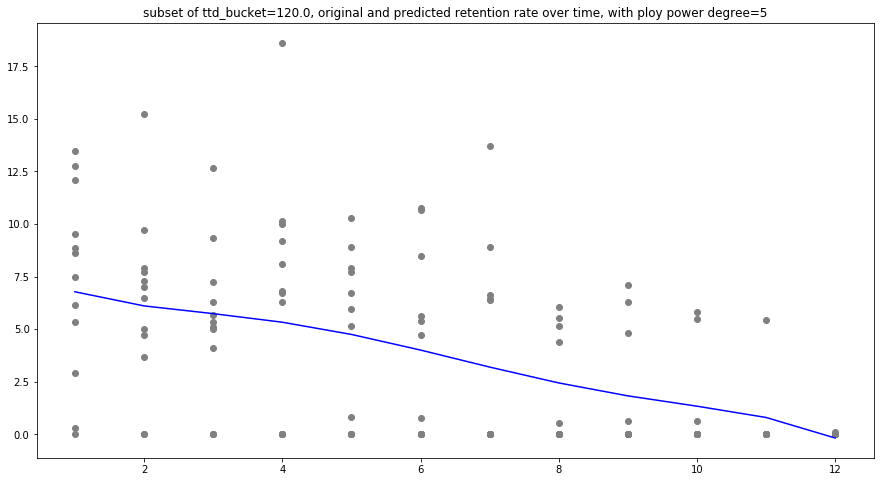

In [107]:
ttd_bucket = sorted(list(set(df_base5.mixed_ttd_mean_bucket)))
n=5

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

for i in ttd_bucket:
    mask = df_base5.mixed_ttd_mean_bucket ==i
    X_sub = df_base5.loc[mask,['mixed_ttd_mean_bucket','rentention_month_bucket']]
    y_sub = df_base5.loc[mask,'retention_value']
    y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

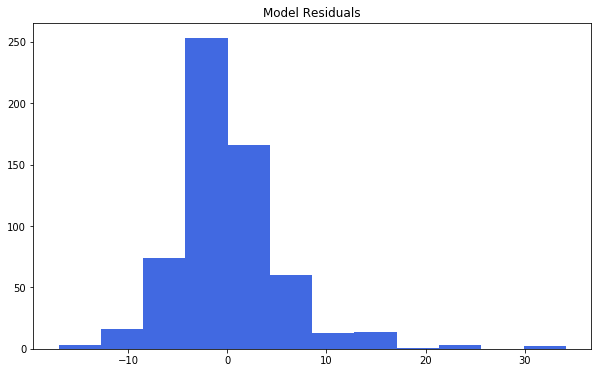

In [108]:
x2_test_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_test)
y2_test_predict = poly_reg.predict(x2_test_poly)
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=12,figsize=(10, 6))
plt.title("Model Residuals")
plt.show()

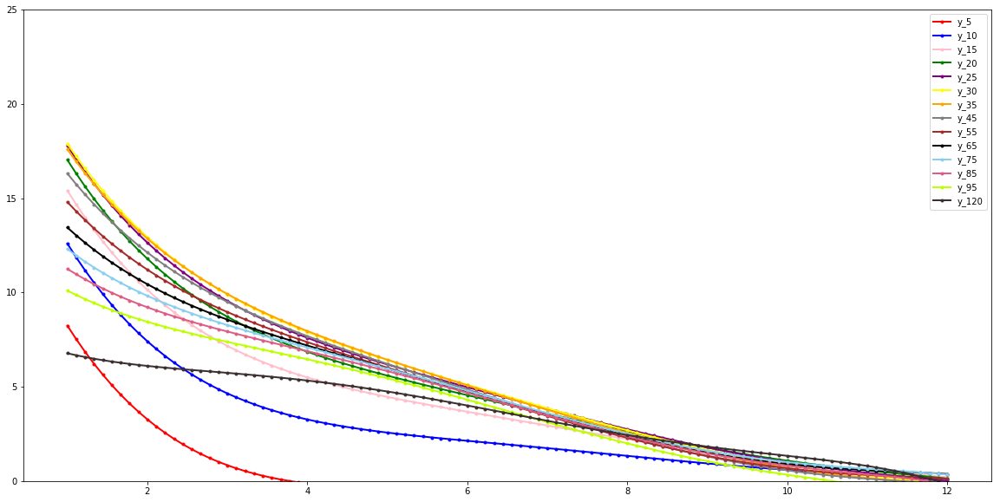

In [109]:
ttd_bucket = sorted(list(set(df_base5.mixed_ttd_mean_bucket)))
n=5
y_name = ['y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120']
df_simulated = pd.DataFrame(columns=['x','y_5','y_10','y_15','y_20','y_25','y_30','y_35','y_45','y_55','y_65','y_75','y_85','y_95','y_120'])
# simulated_rentention_month_bucket = np.linspace(1, 12, 100)
df_simulated['x'] = np.linspace(1, 12, 100)

for i,c in zip(ttd_bucket,y_name):
    simulated_rentention_month_bucket = np.linspace(1, 12, 100)
    ttd = [i]*len(simulated_rentention_month_bucket)
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated[c]=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
    
plt.figure(figsize=(20,10))
plt.ylim(0, 25)
plt.plot( 'x', 'y_5', data=df_simulated, marker='.', color='red', linewidth=2)
plt.plot( 'x', 'y_10', data=df_simulated, marker='.', color='blue', linewidth=2)
plt.plot( 'x', 'y_15', data=df_simulated, marker='.', color='pink', linewidth=2)
plt.plot( 'x', 'y_20', data=df_simulated, marker='.', color='green', linewidth=2)
plt.plot( 'x', 'y_25', data=df_simulated, marker='.', color='purple', linewidth=2)
plt.plot( 'x', 'y_30', data=df_simulated, marker='.', color='yellow', linewidth=2)
plt.plot( 'x', 'y_35', data=df_simulated, marker='.', color='orange', linewidth=2)
plt.plot( 'x', 'y_45', data=df_simulated, marker='.', color='grey', linewidth=2)
plt.plot( 'x', 'y_55', data=df_simulated, marker='.', color='brown', linewidth=2)
plt.plot( 'x', 'y_65', data=df_simulated, marker='.', color='black', linewidth=2)
plt.plot( 'x', 'y_75', data=df_simulated, marker='.', color='#89CFF0', linewidth=2)
plt.plot( 'x', 'y_85', data=df_simulated, marker='.', color='#DE5D83', linewidth=2)
plt.plot( 'x', 'y_95', data=df_simulated, marker='.', color='#BFFF00', linewidth=2)
plt.plot( 'x', 'y_120', data=df_simulated, marker='.', color='#3B2F2F', linewidth=2)
plt.legend()

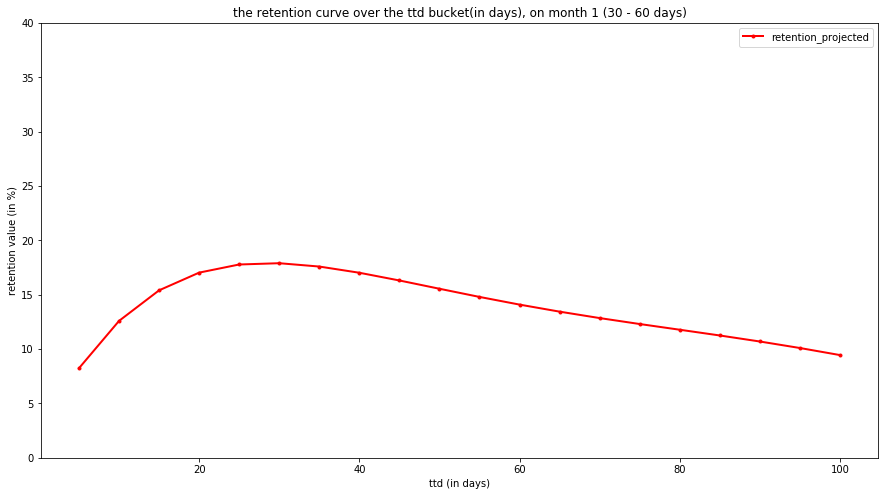

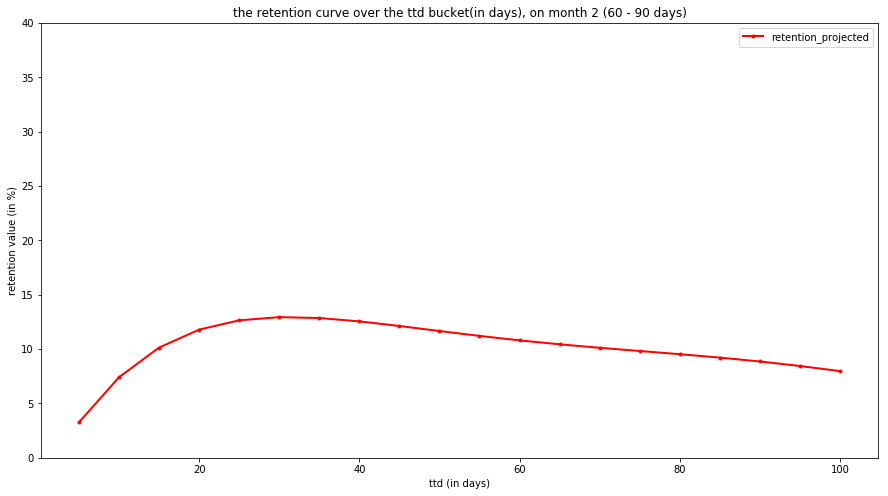

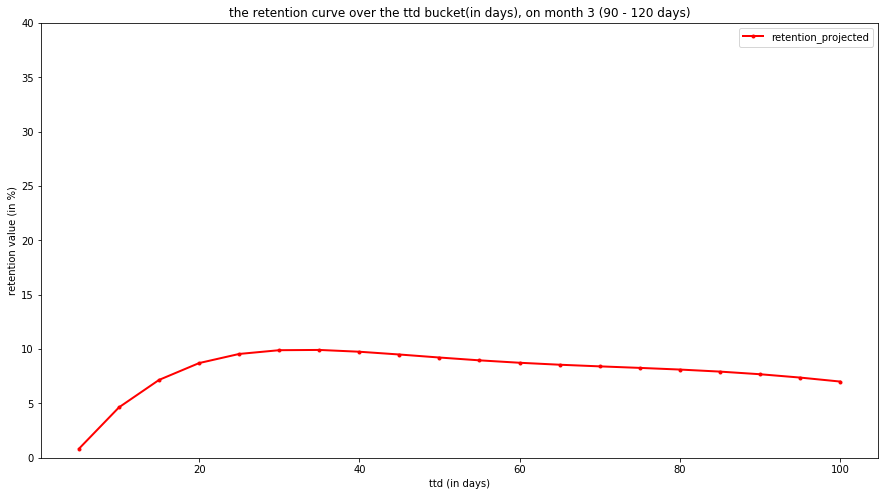

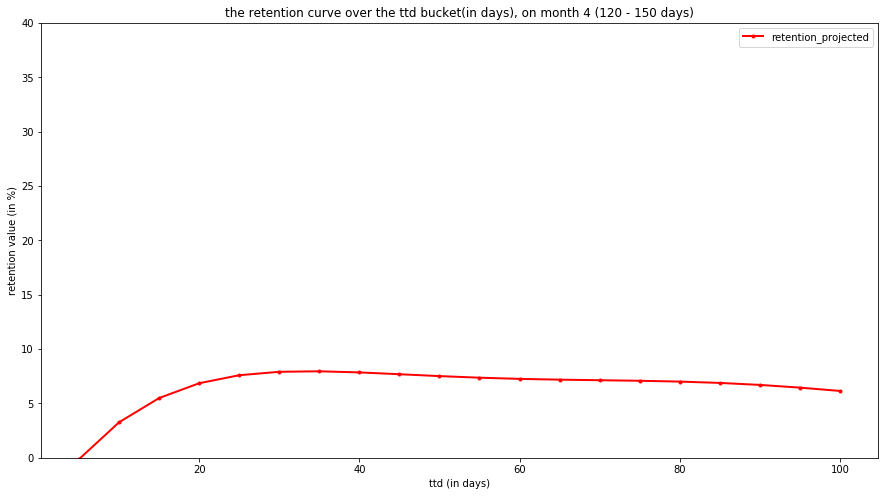

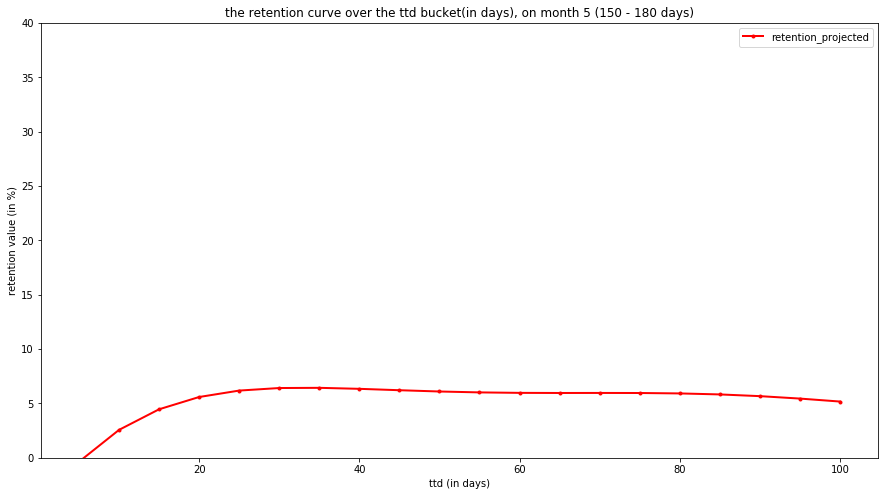

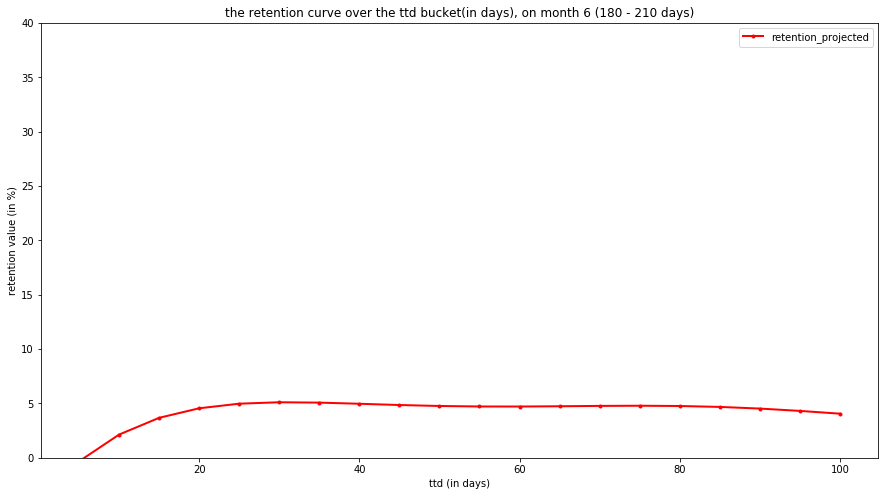

In [111]:
n=5
month = list(np.arange(1, 7, 1))

for i in month:    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {} ({} - {} days)'.format(i,i*30,(i+1)*30))

## Lasso Regression with L1 Regularization, feature elimination

### model based on user cnt

In [34]:
metrics_list = []
alpha=1

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

#     poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    lasso = Lasso(alpha=alpha, max_iter=10e5,random_state=10,tol=0.001)
    lasso.fit(x2_train_poly,y2_train)

    model_coef = lasso.coef_
    model_intercept = lasso.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=lasso.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2,'num of features used':np.sum(lasso.coef_!=0),'num of total feature': len(lasso.coef_)}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22392.415072242547, tolerance: 79.11811772271157
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21965.86341027707, tolerance: 79.11811772271157
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21686.954086604324, tolerance: 79.11811772271157
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model

,Adjusted_R2,R2,RMSE,num of features used,num of total feature
power_degree,,,,,
1,0.365957,0.368057,6.100160,2,2
2,0.367522,0.372758,6.077428,4,5
3,0.389305,0.398404,5.951885,8,9
4,0.402071,0.415930,5.864549,12,14
5,0.383912,0.404313,5.922586,17,20
6,0.386071,0.413515,5.876661,25,27
7,0.386049,0.421625,5.835886,31,35
8,0.380859,0.425962,5.813968,41,44


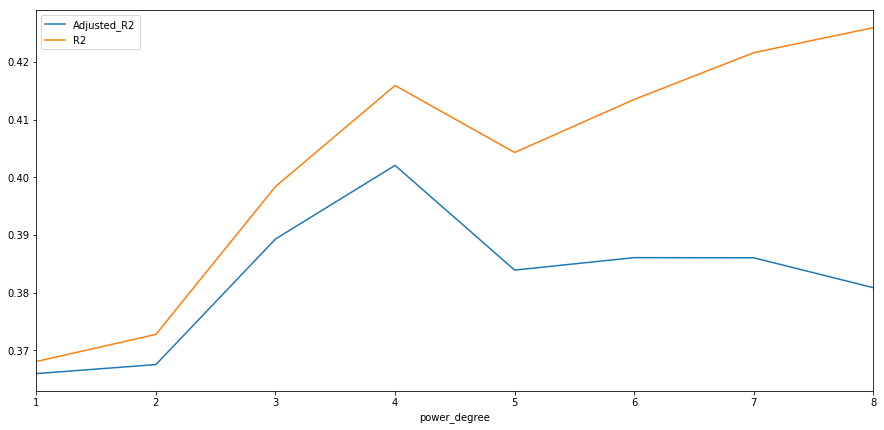

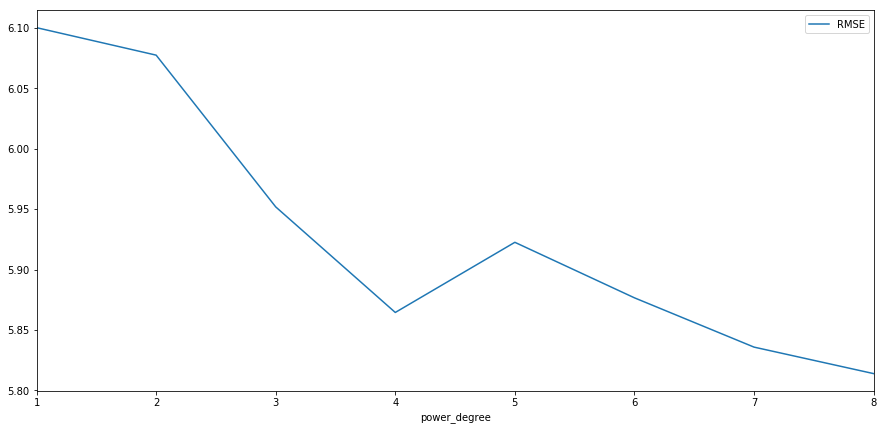

In [35]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

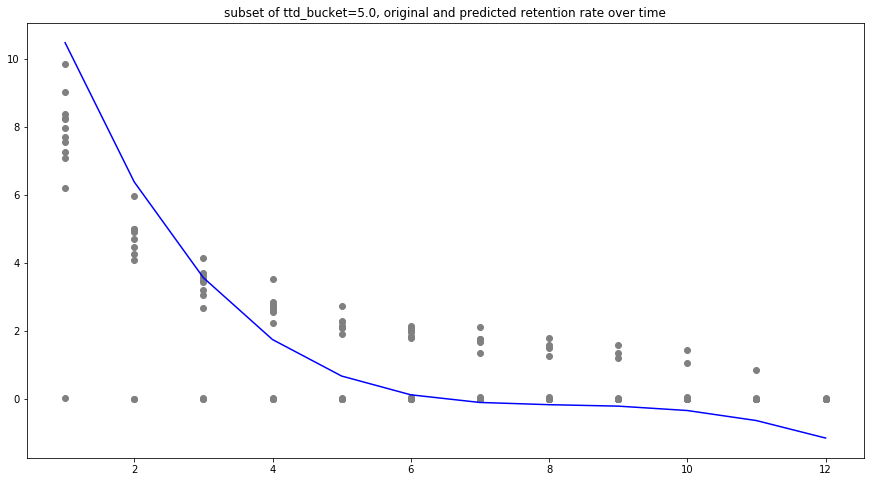

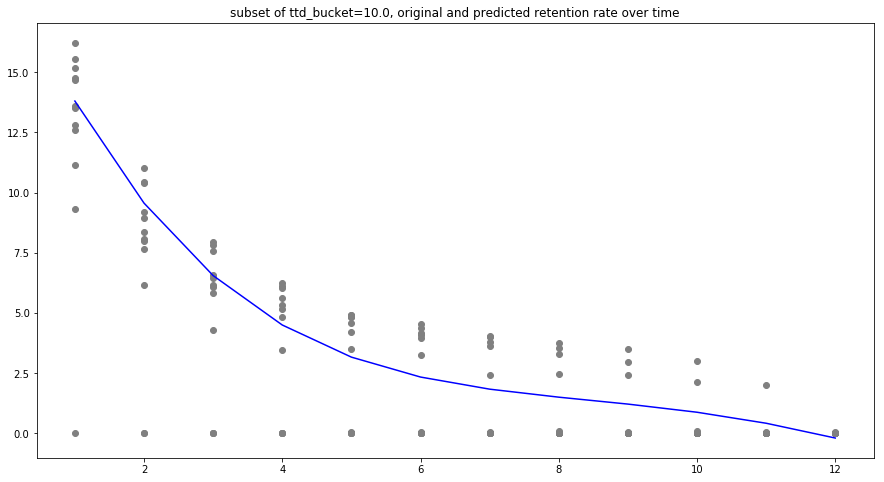

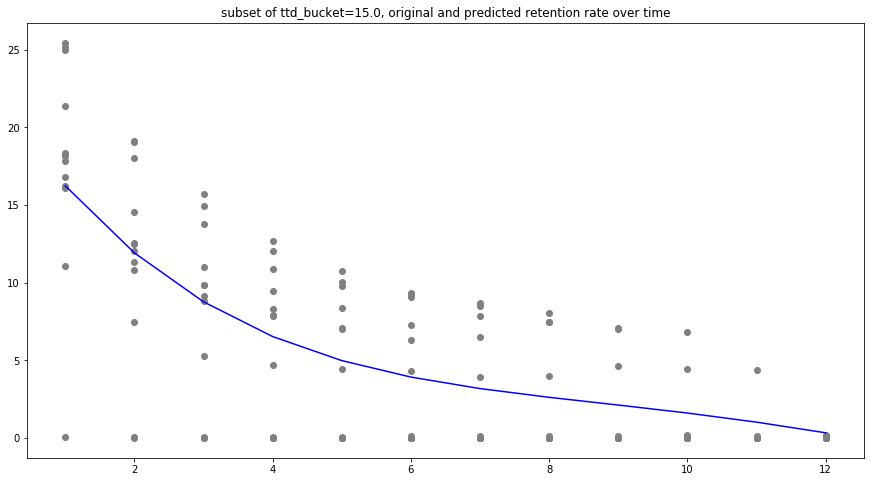

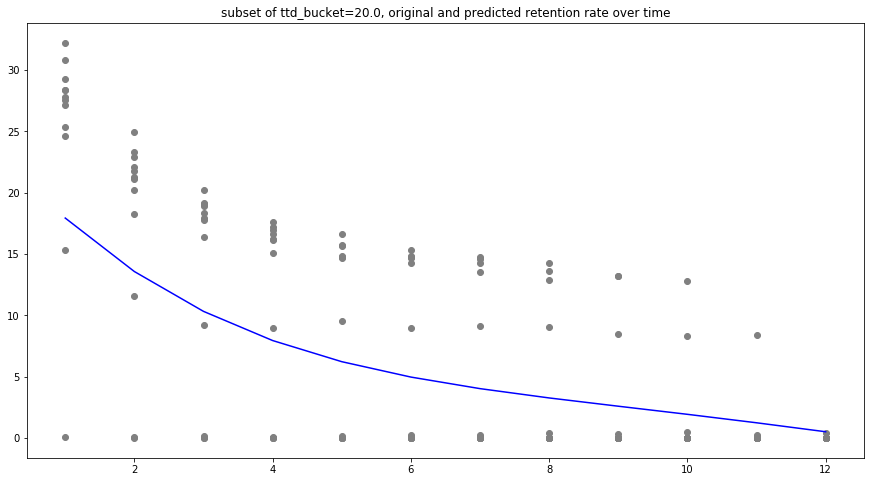

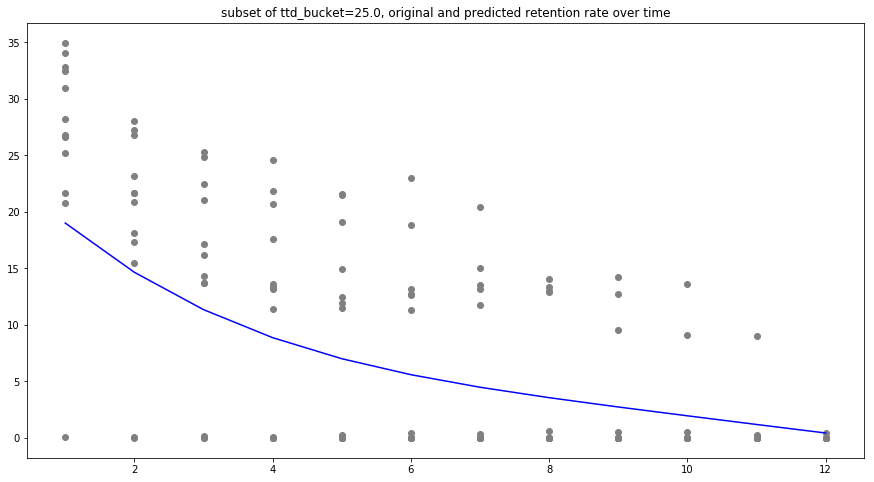

...

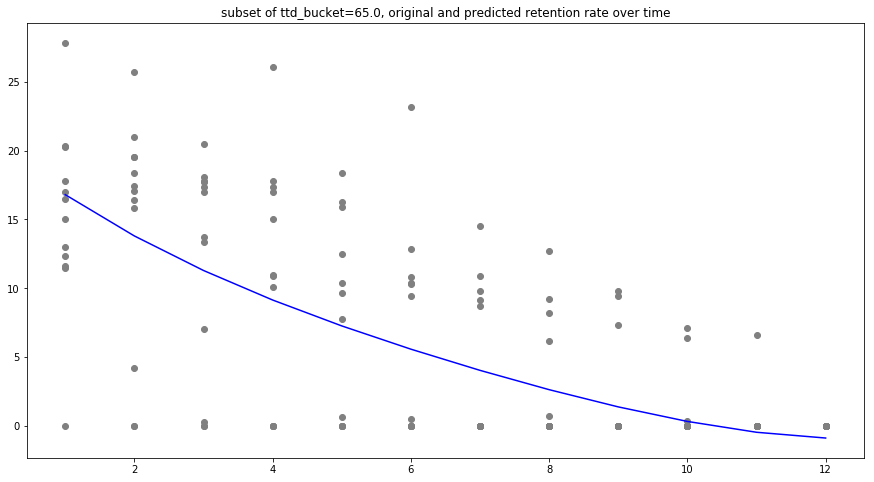

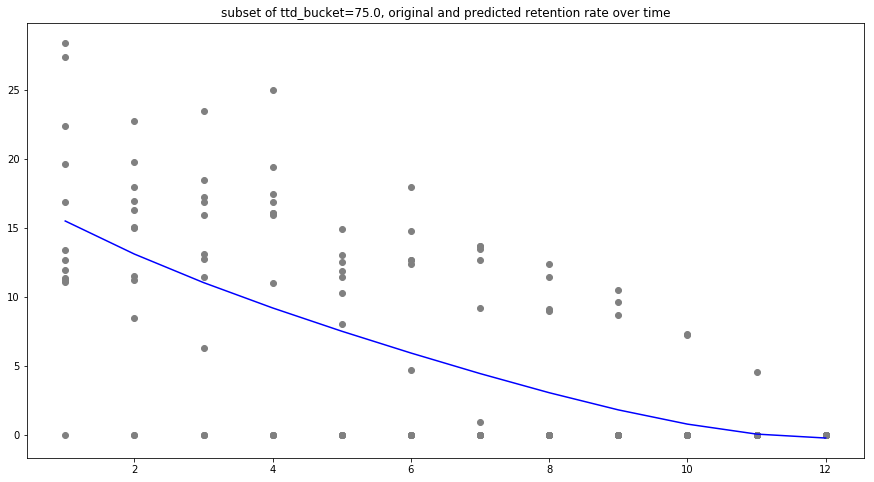

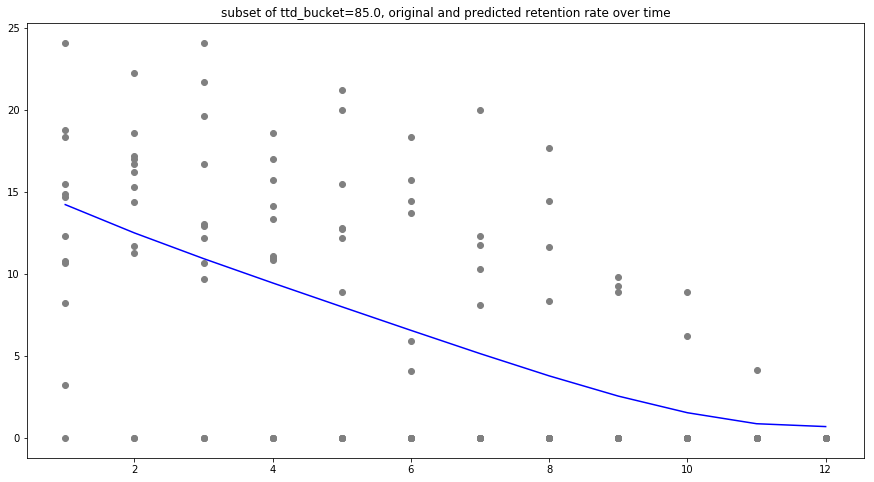

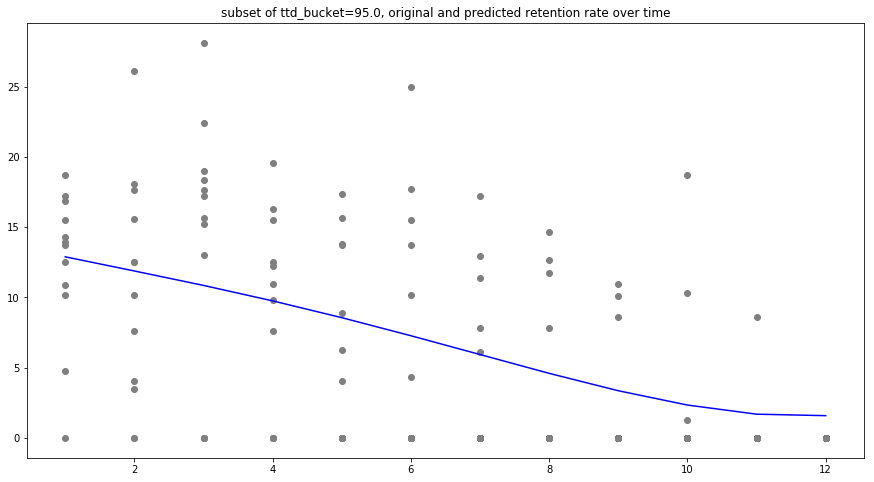

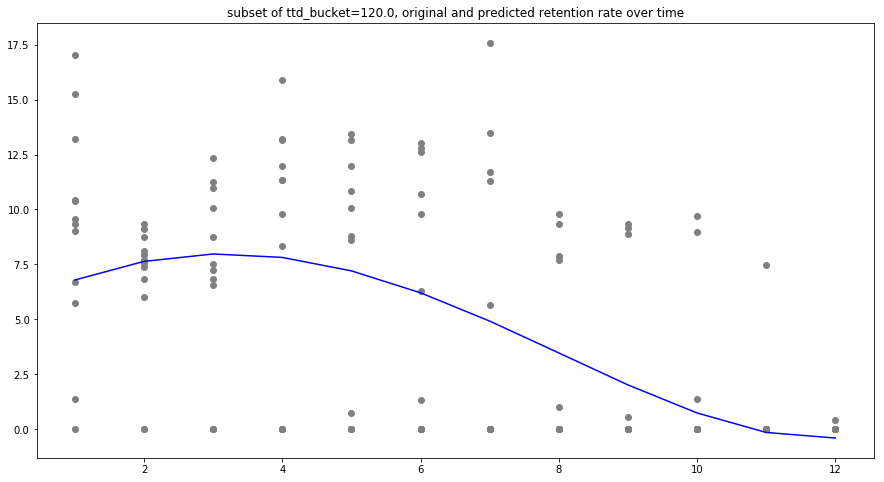

In [36]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket)))
n=4
alpha=0.01

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
lasso = Lasso(alpha=alpha, max_iter=10e5,random_state=0,tol=0.001)
lasso.fit(x2_train_poly,y2_train)

for i in ttd_bucket:
    mask = df_base2.mixed_ttd_mean_bucket ==i
    X_sub = df_base2.loc[mask,['mixed_ttd_mean_bucket','rentention_month_bucket']]
    y_sub = df_base2.loc[mask,'retention_value']
    y_sub_predict=lasso.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time'.format(i))

### model based on trans cnt

In [72]:
X2_train.head()

,mixed_ttd_mean_bucket,rentention_month_bucket
688,10.0,5
1540,15.0,10
1387,20.0,9
108,65.0,1
1780,55.0,11


In [70]:
metrics_list = []
alpha=1

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

#     poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    lasso = Lasso(alpha=alpha, max_iter=10e5,random_state=10,tol=0.001)
    lasso.fit(x2_train_poly,y2_train)

    model_coef = lasso.coef_
    model_intercept = lasso.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=lasso.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2,'num of features used':np.sum(lasso.coef_!=0),'num of total feature': len(lasso.coef_)}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18562.588172627526, tolerance: 61.13623094867752
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18322.211803323135, tolerance: 61.13623094867752
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18129.835736106954, tolerance: 61.13623094867752
  positive)


,Adjusted_R2,R2,RMSE,num of features used,num of total feature
power_degree,,,,,
1,0.311794,0.314072,5.778132,2,2
2,0.312421,0.318113,5.761087,5,5
3,0.335845,0.345741,5.643169,8,9
4,0.338567,0.353899,5.607879,12,14
5,0.331794,0.353920,5.607786,17,20
6,0.329137,0.359126,5.585149,24,27
7,0.327463,0.366435,5.553209,31,35


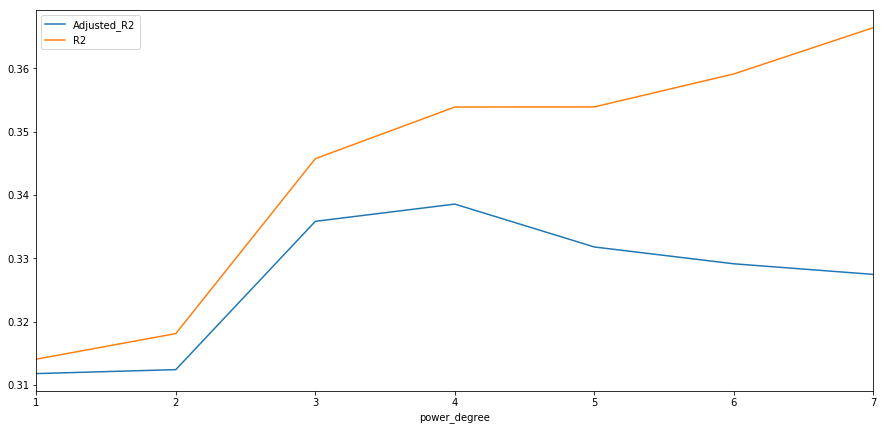

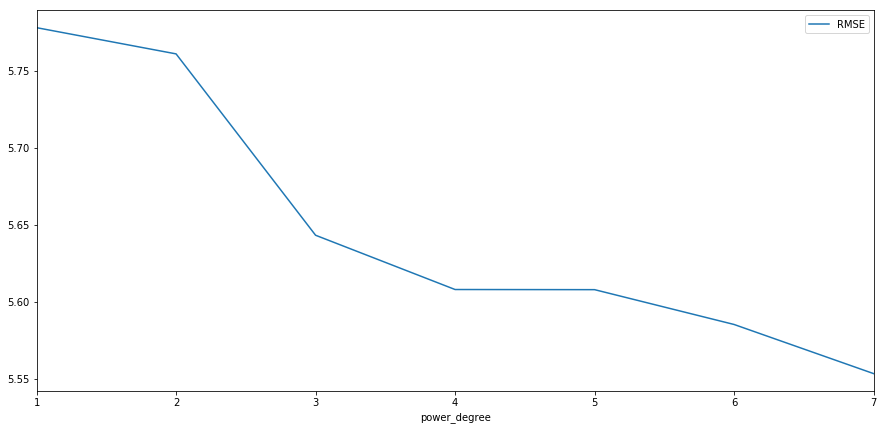

In [71]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
metrics_df[['RMSE']].plot(figsize=(15, 7))

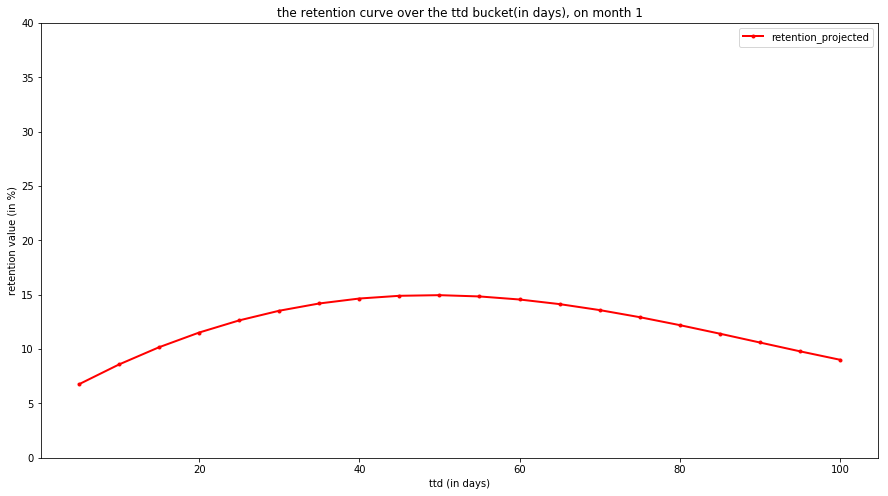

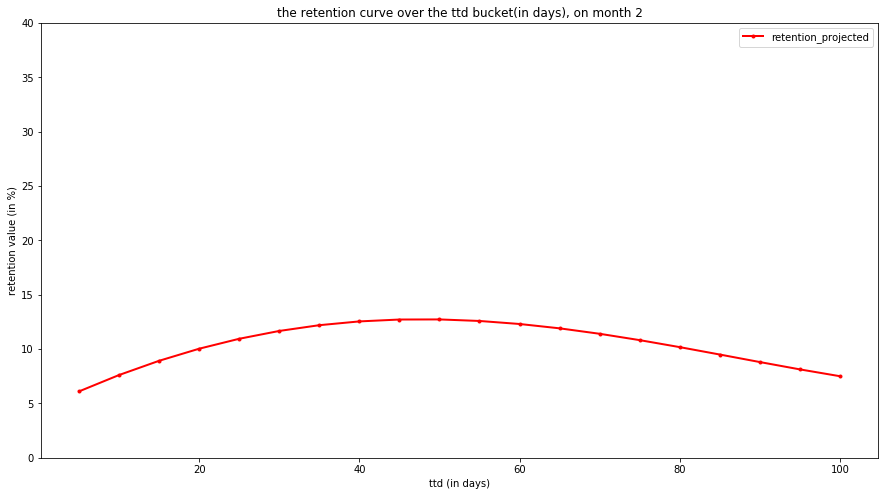

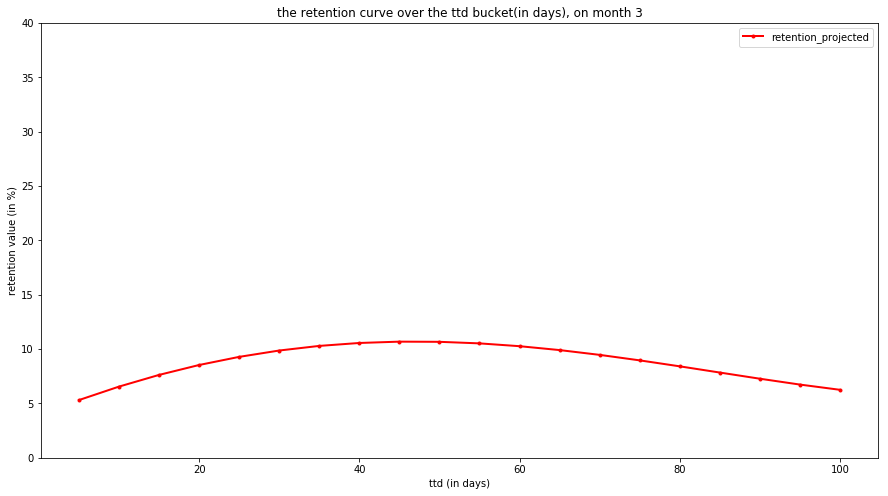

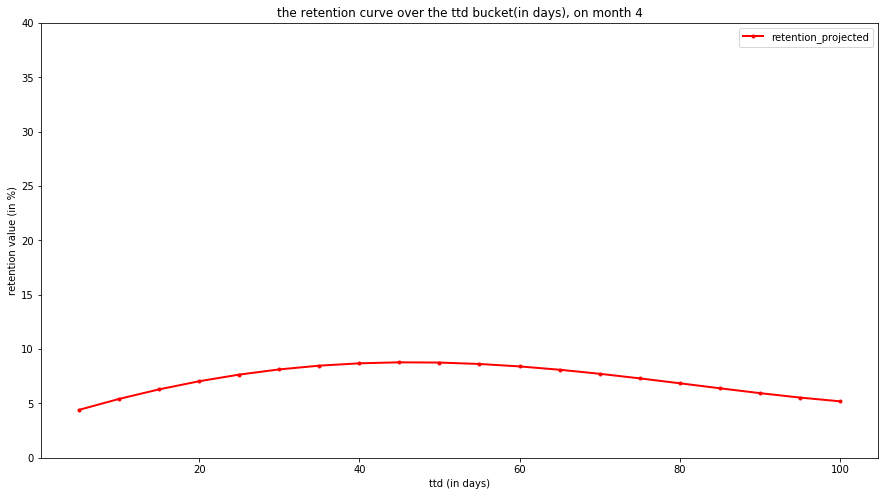

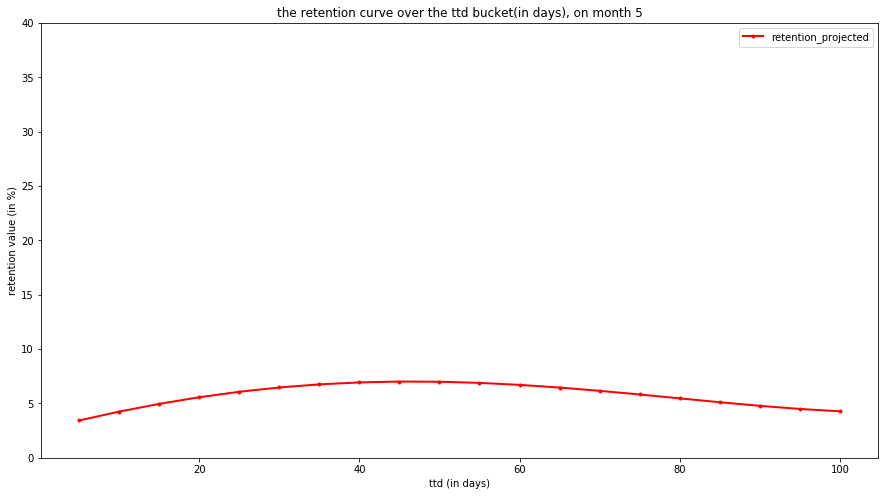

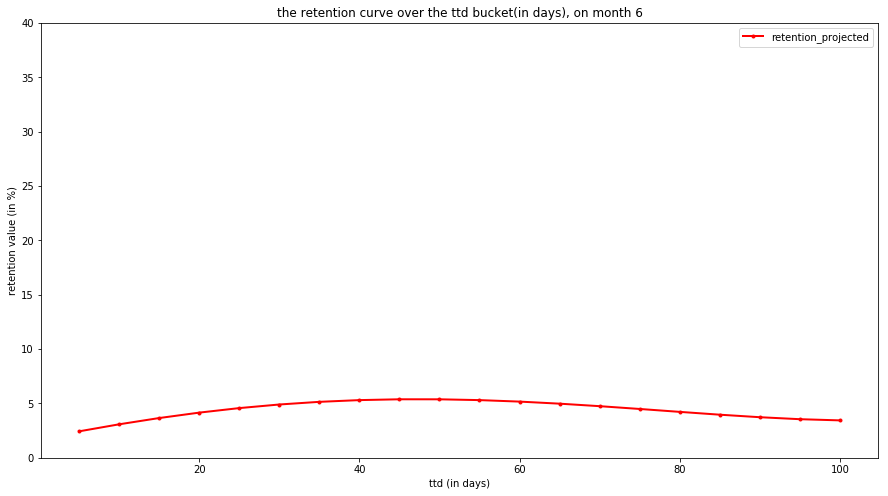

In [75]:
n=4
month = list(np.arange(1, 7, 1))

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
lasso = Lasso(alpha=alpha, max_iter=10e5,random_state=10,tol=0.001)
lasso.fit(x2_train_poly,y2_train)

for i in month:    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = [i]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(zip(ttd,simulated_rentention_month_bucket)),columns=['ttd_bucket','simulated_rentention_month_bucket'])
    
    df_simulated['retention_projected']=lasso.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_df))
        
    
    plt.figure(figsize=(15,8))
    plt.ylim(0, 40)
    plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    plt.legend()
    plt.xlabel('ttd (in days)')
    plt.ylabel('retention value (in %)')
    plt.title('the retention curve over the ttd bucket(in days), on month {}'.format(i))

### Fit on an exponential function

In [672]:
mask1 = df_base2.retention_value >0.0
df_base3=df_base2[mask1]

In [673]:
y = np.log(df_base3.retention_value)
y.shape

(775,)

In [674]:
X = df_base3[['mixed_ttd_mean_bucket','rentention_month_bucket','user_cnt_m0']]
X['ttd:retention_month'] = X.mixed_ttd_mean_bucket * X.rentention_month_bucket
X.head()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,mixed_ttd_mean_bucket,rentention_month_bucket,user_cnt_m0,ttd:retention_month
0,5.0,1,39585,5.0
1,5.0,1,33825,5.0
2,5.0,1,38023,5.0
3,5.0,1,33594,5.0
4,5.0,1,30906,5.0


In [675]:
X_e_train_w, X_e_test_w, y_e_train, y_e_test = train_test_split(X, y, test_size=0.3, random_state=0)
X_e_train = X_e_train_w[['mixed_ttd_mean_bucket','rentention_month_bucket','ttd:retention_month']]
X_e_test = X_e_test_w[['mixed_ttd_mean_bucket','rentention_month_bucket','ttd:retention_month']]
X_e_train_weight = X_e_train_w['user_cnt_m0']

In [676]:
# plt.scatter(X.rentention_month_bucket, y)

In [677]:
lin_reg = LinearRegression().fit(X=X_e_train , y=y_e_train)#,sample_weight=X_e_train_weight#
lin_reg.intercept_, lin_reg.coef_

(2.5408601473162795, array([ 0.0055152 , -0.33627477,  0.00342399]))

In [679]:
y_e_pred = lin_reg.predict(X_e_test)

In [680]:
model_mse = mean_squared_error(y_e_test, y_e_pred)
model_rmse =  math.sqrt(model_mse)
model_r2 = r2_score(y_e_test, y_e_pred)
model_mse,model_rmse,model_r2

(3.2155698384786606, 1.793201003367626, 0.1667125603115689)

In [681]:
model_mse_transfered = mean_squared_error(np.exp(y_e_test), np.exp(y_e_pred))
model_rmse_transfered =  math.sqrt(model_mse_transfered)
model_r2_transfered = r2_score(np.exp(y_e_test), np.exp(y_e_pred))
model_mse_transfered,model_rmse_transfered,model_r2_transfered

(56.748039687311724, 7.533129475013139, 0.07282322783504924)

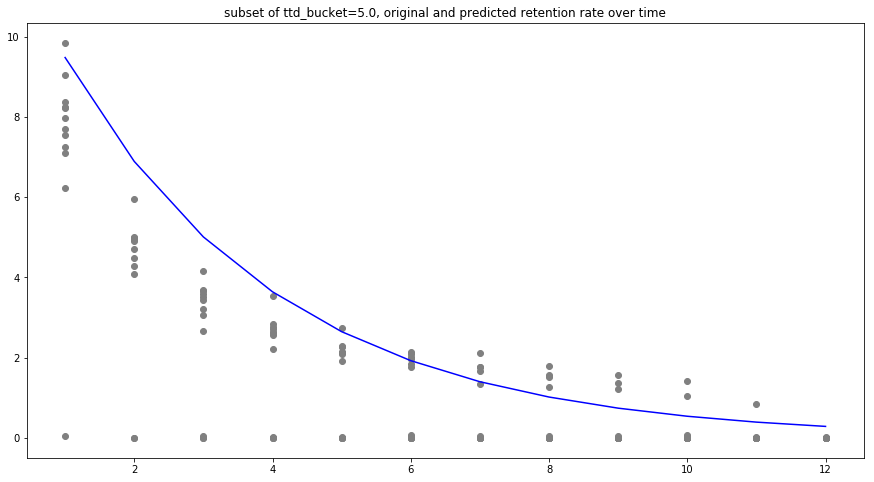

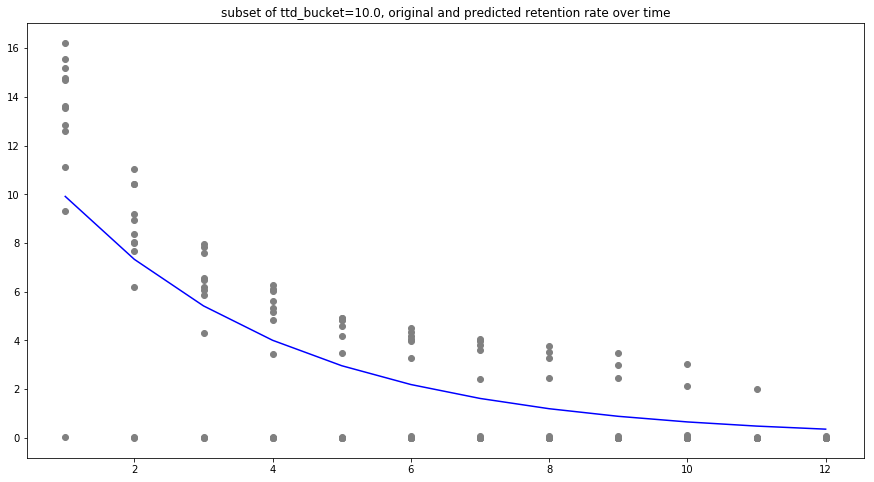

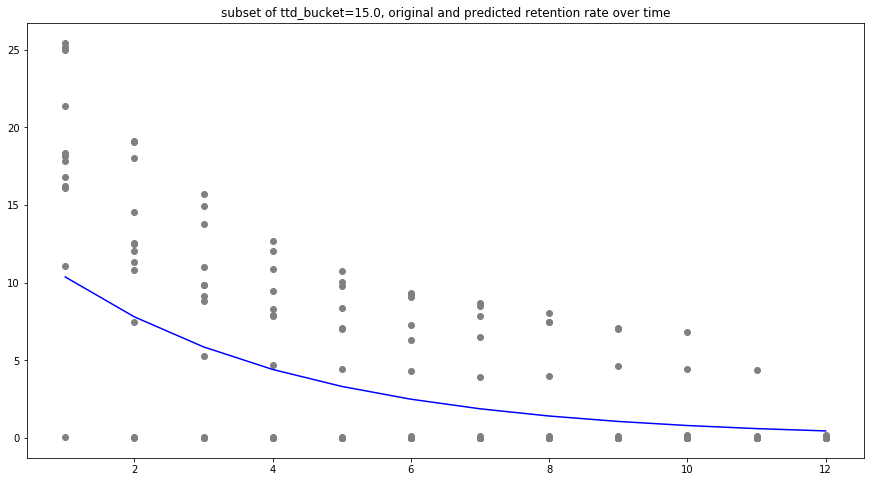

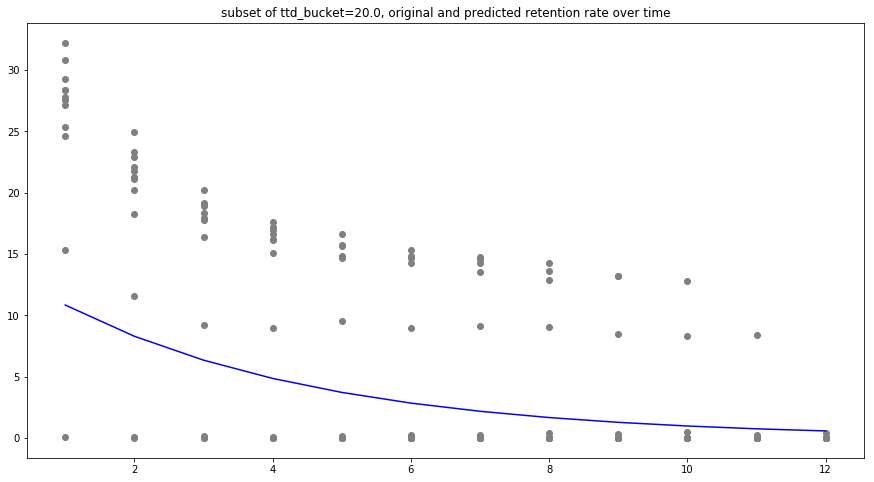

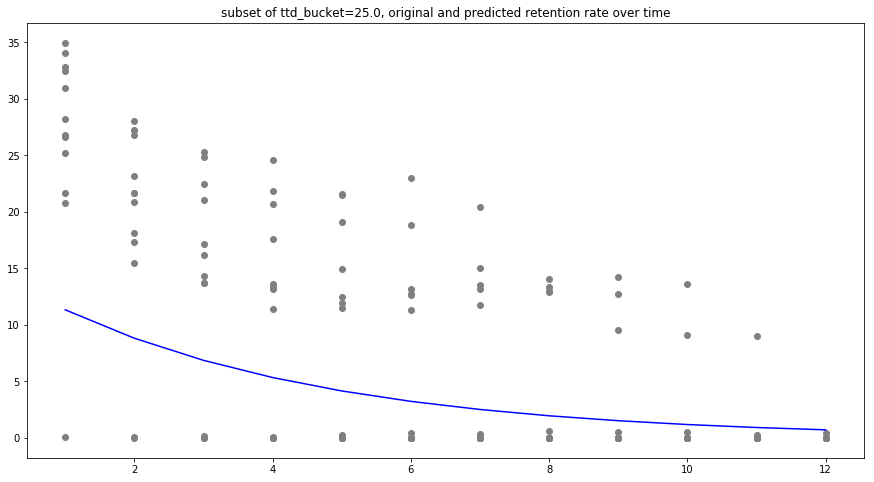

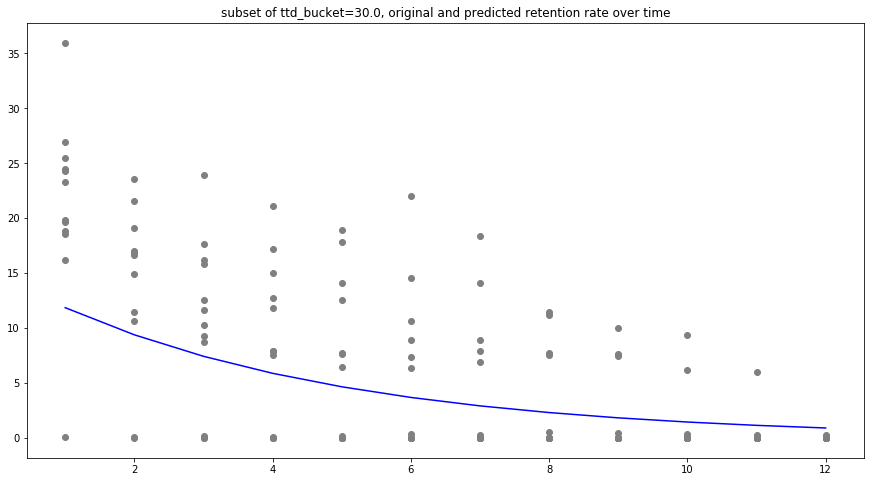

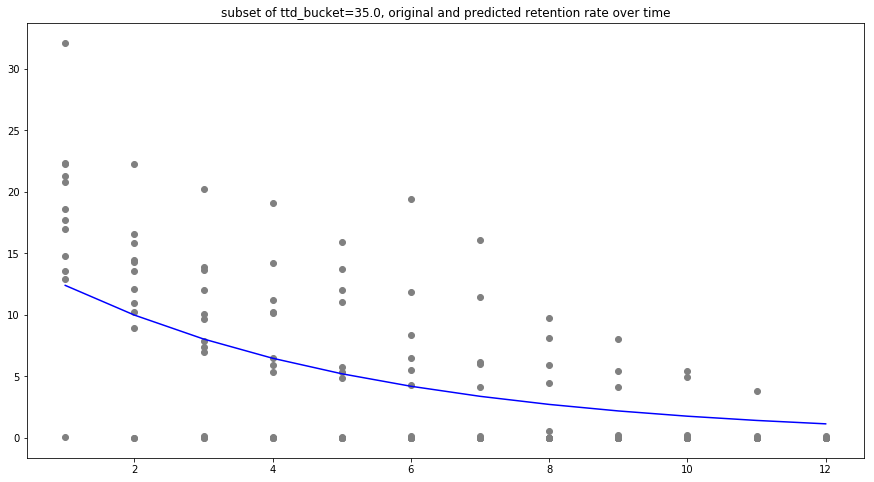

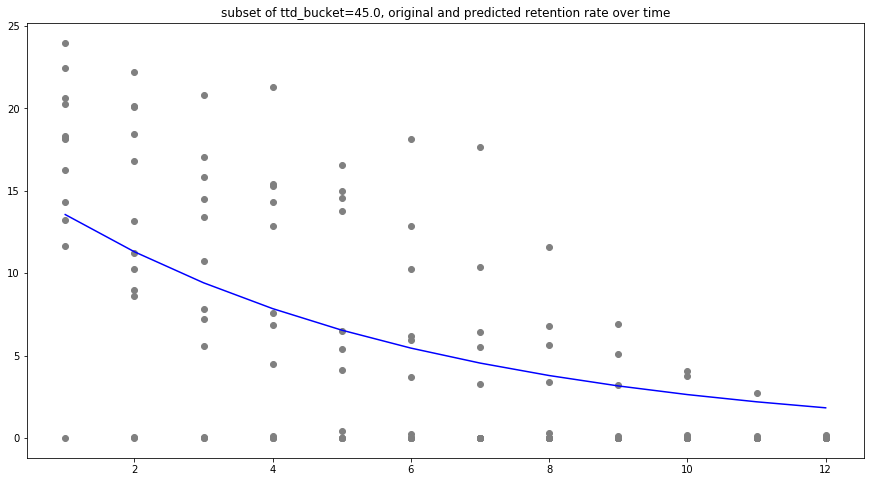

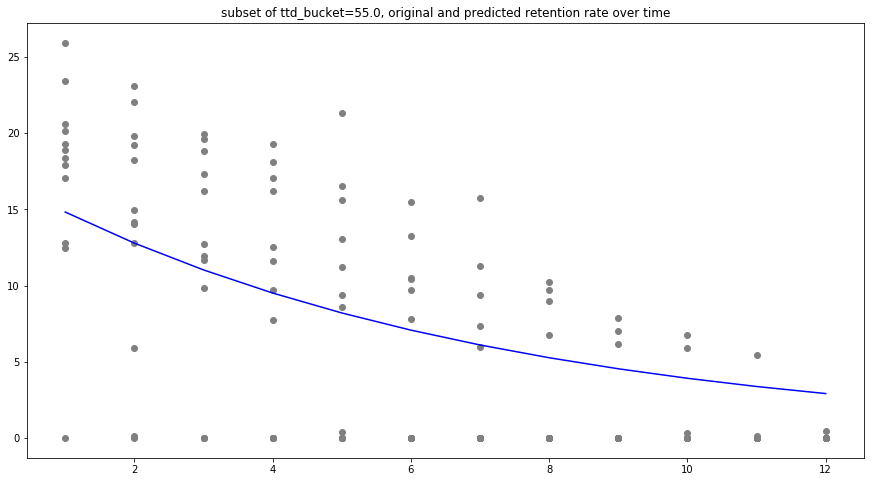

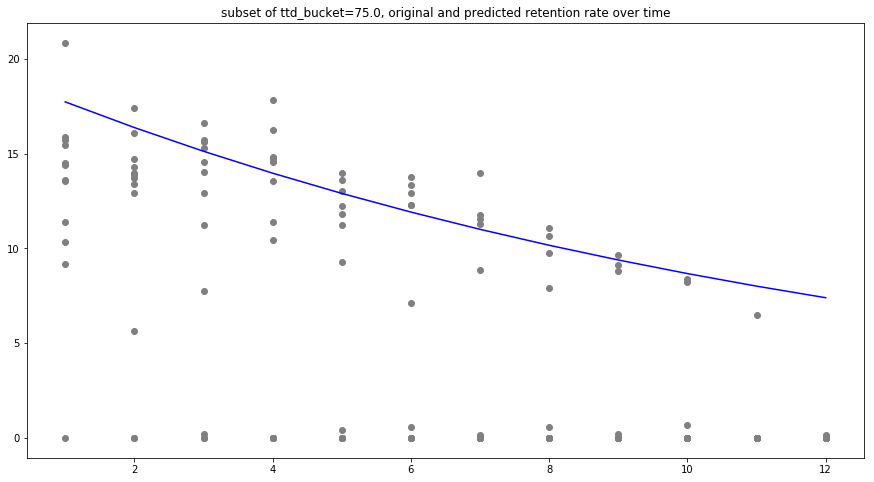

In [678]:
ttd_bucket = sorted(list(set(df_base2.mixed_ttd_mean_bucket)))

for i in ttd_bucket:
    mask = df_base2.mixed_ttd_mean_bucket ==i
    
    X_sub = df_base2.loc[mask,['mixed_ttd_mean_bucket','rentention_month_bucket']]
    X_sub['ttd:retention_month'] = X_sub.mixed_ttd_mean_bucket * X_sub.rentention_month_bucket
    
    y_sub = df_base2.loc[mask,'retention_value']
    y_sub_predict=lin_reg.predict(X_sub)
    y_sub_predict2 = np.exp(y_sub_predict)
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict2,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time'.format(i))

## exploration on other features

In [52]:
df_sample5 = dw.td_query('''
select cumulative_refunds_perc
       ,waiting_day_1st_txn
       ,user_first_txn_refund_category
       ,mixed_ttd_mean
       ,max_ttd_shown_mean
       ,min_ttd_shown_mean
       ,late_mixed_ttd_diff_mean
       ,late_mixed_delivery_perc
       ,logistics_o_overall_refund
       ,llr
       ,avg_value
       ,avg_gmv
       ,carrier_ttd_mean
       ,late_carrier_ttd_diff_mean
       ,late_carrier_delivery_perc
from
(SELECT cumulative_refunds_perc
       ,round((user_first_txn_time-registration_time)/86400.0,0) as waiting_day_1st_txn
       ,user_first_txn_refund_category
       ,mixed_ttd_mean
       ,max_ttd_shown_mean
       ,min_ttd_shown_mean
       ,late_mixed_ttd_diff_mean
       ,late_mixed_delivery_perc
       ,logistics_o_overall_refund
       ,llr
       ,avg_value
       ,avg_gmv
       ,carrier_ttd_mean
       ,late_carrier_ttd_diff_mean
       ,late_carrier_delivery_perc
from analytics.jay_ttd_rentention_base5
where country_code = 'US') as temp

TABLESAMPLE BERNOULLI (5)
'''
# ,job_id=756667984
,engine='presto'
                )

mapping = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

df_sample5.replace({'user_first_txn_refund_category': mapping},inplace=True)
df_sample5.head(10)

You can look at job id 777559236


,cumulative_refunds_perc,waiting_day_1st_txn,user_first_txn_refund_category,mixed_ttd_mean,max_ttd_shown_mean,min_ttd_shown_mean,late_mixed_ttd_diff_mean,late_mixed_delivery_perc,logistics_o_overall_refund,llr,avg_value,avg_gmv,carrier_ttd_mean,late_carrier_ttd_diff_mean,late_carrier_delivery_perc
0,None,0.0,1.0,15.777778,23.458484,15.346570,2.206897,10.469314,0.0,0.000000,8.432552,7.514007,15.777778,2.206897,10.469314
1,None,0.0,1.0,15.777778,23.458484,15.346570,2.206897,10.469314,0.0,0.000000,8.432552,7.514007,15.777778,2.206897,10.469314
2,None,103.0,1.0,6.000000,14.500000,7.000000,NaN,0.000000,NaN,0.000000,19.700000,40.000000,6.000000,NaN,0.000000
3,None,0.0,1.0,17.250000,35.285714,20.285714,NaN,0.000000,NaN,0.000000,1.466667,4.114286,17.250000,NaN,0.000000
4,None,0.0,1.0,NaN,37.000000,19.000000,NaN,0.000000,NaN,0.000000,0.260000,4.500000,NaN,NaN,0.000000
5,None,127.0,1.0,12.200000,26.266667,13.800000,NaN,0.000000,100.0,20.000000,2.181413,6.904000,12.200000,NaN,0.000000
6,None,0.0,1.0,21.166667,25.571429,15.244898,7.200000,30.612245,50.0,2.040816,3.479785,5.638571,20.500000,14.000000,8.163265
7,None,56.0,1.0,NaN,30.000000,17.000000,NaN,0.000000,NaN,0.000000,0.462180,3.966667,NaN,NaN,0.000000
8,None,155.0,1.0,22.250000,22.925000,12.875000,6.428571,17.500000,NaN,0.000000,6.642596,14.564000,22.250000,6.428571,17.500000
9,None,155.0,1.0,22.250000,22.925000,12.875000,6.428571,17.500000,NaN,0.000000,6.642596,14.564000,22.250000,6.428571,17.500000


In [257]:
# df_sample5.dropna(axis='index',inplace=True)

In [258]:
df_sample5.shape

(1609252, 13)

Text(0.5,1,'distribution of users profile - mixed_ttd_mean')

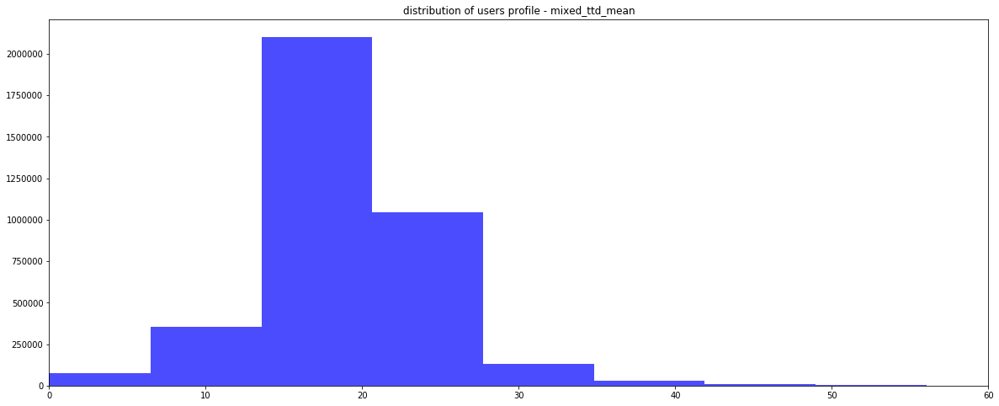

In [67]:
plt.figure(figsize=(20,8))
plt.xlim(0, 60)
plt.hist(x=df_sample5.mixed_ttd_mean.dropna(axis='index'), bins=100, color='blue', alpha=0.7)
plt.title('distribution of users profile - mixed_ttd_mean')

Text(0.5,1,'distribution of users profile - carrier_ttd_mean')

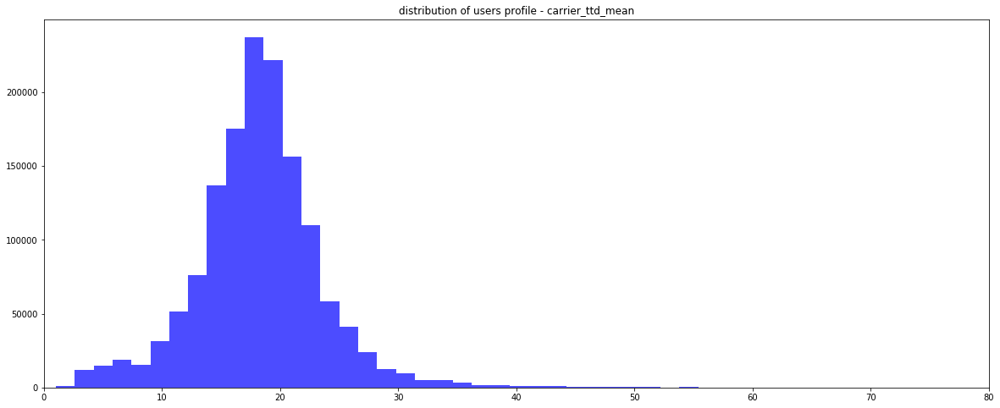

In [260]:
plt.figure(figsize=(20,8))
plt.xlim(0, 80)
plt.hist(x=df_sample5.carrier_ttd_mean.dropna(axis='index'), bins=100, color='blue', alpha=0.7)
plt.title('distribution of users profile - carrier_ttd_mean')

Text(0.5,1,'distribution of users profile - avg_price')

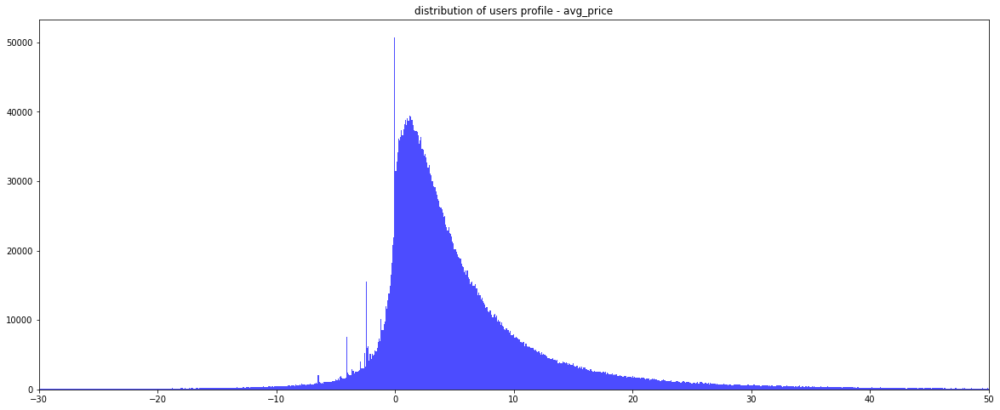

In [241]:
plt.figure(figsize=(20,8))
plt.xlim(-30, 50)
plt.hist(x=df_sample5.avg_value.dropna(axis='index'), bins='auto', color='blue', alpha=0.7)
plt.title('distribution of users profile - avg_price')

Text(0.5,1,'distribution of users profile - avg_gmv')

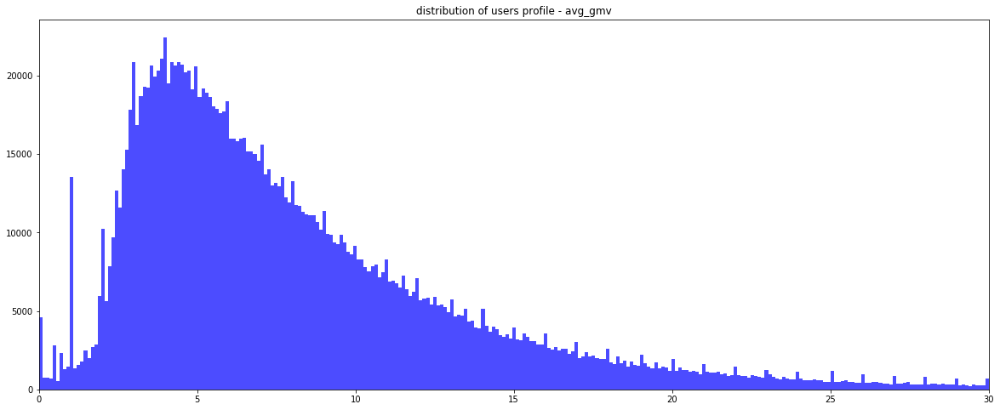

In [262]:
plt.figure(figsize=(20,8))
plt.xlim(0, 30)
plt.hist(x=df_sample5.avg_gmv.dropna(axis='index'), bins='auto', color='blue', alpha=0.7)
plt.title('distribution of users profile - avg_gmv')

Text(0.5,1,'distribution of users profile - avg_gmv')

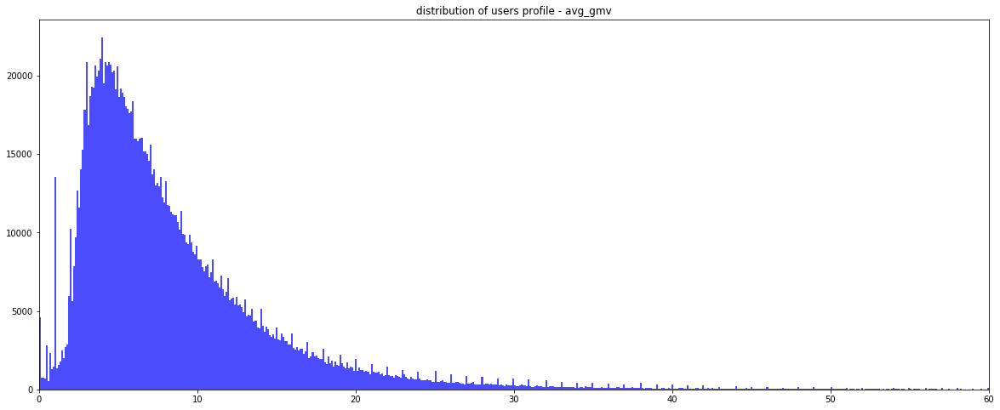

In [263]:
plt.figure(figsize=(20,8))
plt.xlim(0, 60)
plt.hist(x=df_sample5.avg_gmv.dropna(axis='index'), bins='auto', color='blue', alpha=0.7)
plt.title('distribution of users profile - avg_gmv')

Text(0.5,1,'distribution of users profile - late_mixed_ttd_diff_mean')

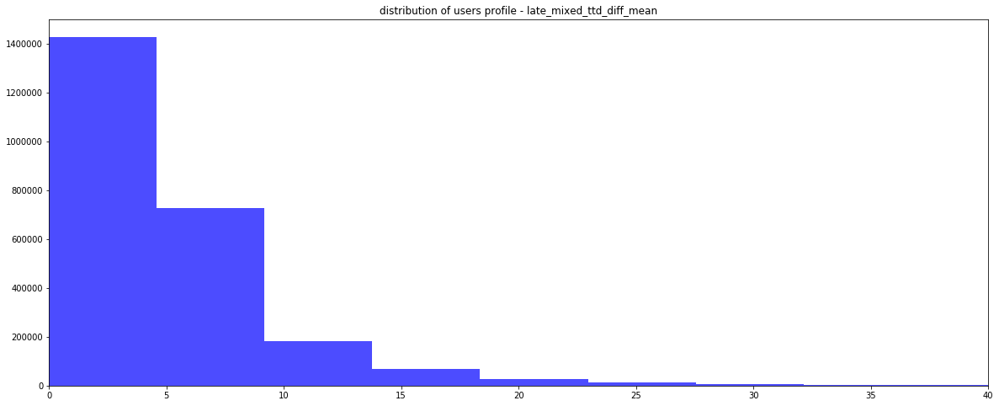

In [55]:
plt.figure(figsize=(20,8))
plt.xlim(0, 40)
plt.hist(x=df_sample5.late_mixed_ttd_diff_mean.dropna(axis='index'), bins=100, color='blue', alpha=0.7)
plt.title('distribution of users profile - late_mixed_ttd_diff_mean')

Text(0.5,1,'distribution of users profile - late_carrier_ttd_diff_mean')

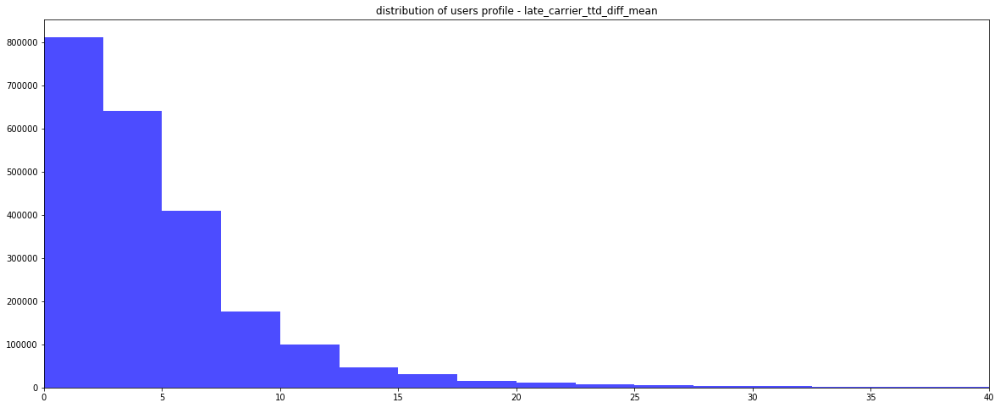

In [58]:
plt.figure(figsize=(20,8))
plt.xlim(0, 40)
plt.hist(x=df_sample5.late_carrier_ttd_diff_mean.dropna(axis='index'), bins=100, color='blue', alpha=0.7)
plt.title('distribution of users profile - late_carrier_ttd_diff_mean')

Text(0.5,1,'distribution of users profile - late_mixed_delivery_perc')

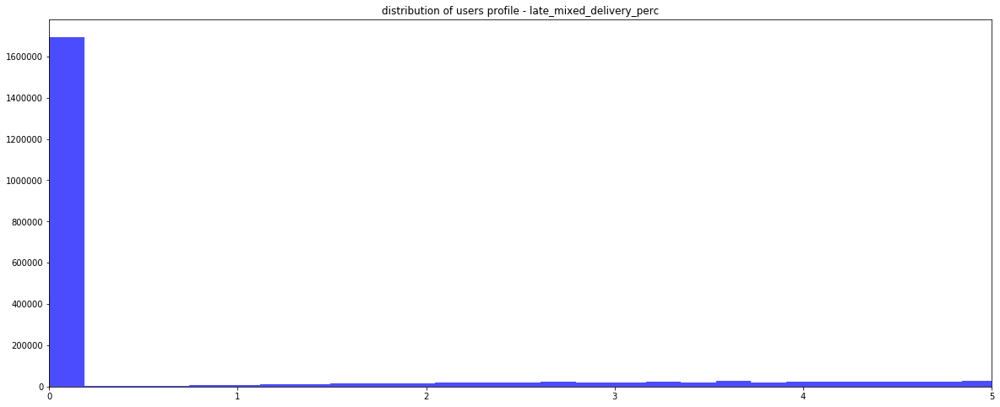

In [72]:
plt.figure(figsize=(20,8))
plt.xlim(0, 5)
plt.hist(x=df_sample5.late_mixed_delivery_perc.dropna(axis='index'), bins='auto', color='blue', alpha=0.7)
plt.title('distribution of users profile - late_mixed_delivery_perc')

Text(0.5,1,'distribution of users profile - late_carrier_delivery_perc')

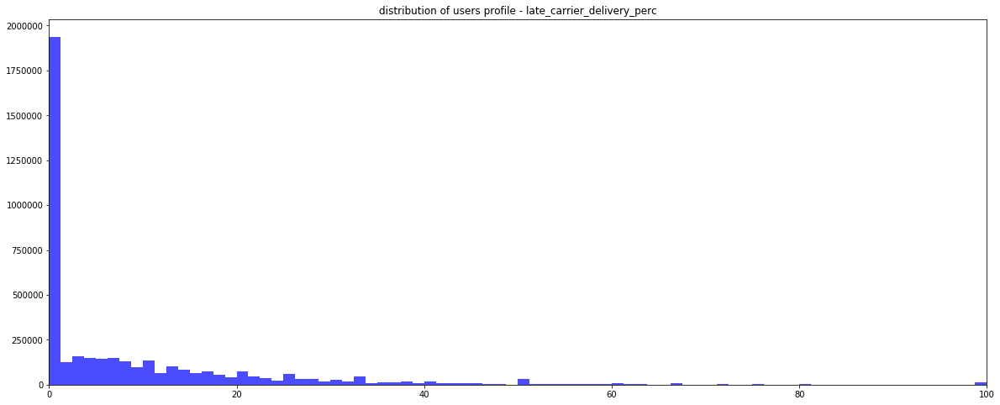

In [65]:
plt.figure(figsize=(20,8))
plt.xlim(0, 100)
plt.hist(x=df_sample5.late_carrier_delivery_perc.dropna(axis='index'), bins=80, color='blue', alpha=0.7)
plt.title('distribution of users profile - late_carrier_delivery_perc')

In [617]:
df_sample5.corr()

,cumulative_refunds_perc,waiting_day_1st_txn,user_first_txn_refund_category,mixed_ttd_mean,max_ttd_shown_mean,min_ttd_shown_mean,late_mixed_ttd_diff_mean,late_mixed_delivery_perc,logistics_o_overall_refund,llr
cumulative_refunds_perc,1.000000,0.039759,0.274046,0.104904,-0.043989,0.016873,0.049204,0.115263,-0.023208,0.436880
waiting_day_1st_txn,0.039759,1.000000,0.103720,0.054815,0.004177,0.023015,0.013621,0.051959,0.048883,0.074644
user_first_txn_refund_category,0.274046,0.103720,1.000000,0.106343,0.024464,0.002518,0.026141,0.080893,0.172007,0.360130
mixed_ttd_mean,0.104904,0.054815,0.106343,1.000000,0.238536,0.224452,0.497100,0.385706,0.070095,0.181012
max_ttd_shown_mean,-0.043989,0.004177,0.024464,0.238536,1.000000,0.601643,0.044949,-0.451763,-0.010377,-0.054436
min_ttd_shown_mean,0.016873,0.023015,0.002518,0.224452,0.601643,1.000000,0.031040,-0.104894,-0.036776,-0.026113
late_mixed_ttd_diff_mean,0.049204,0.013621,0.026141,0.497100,0.044949,0.031040,1.000000,0.076027,0.063885,0.103978
late_mixed_delivery_perc,0.115263,0.051959,0.080893,0.385706,-0.451763,-0.104894,0.076027,1.000000,0.017997,0.106121
logistics_o_overall_refund,-0.023208,0.048883,0.172007,0.070095,-0.010377,-0.036776,0.063885,0.017997,1.000000,0.511084
llr,0.436880,0.074644,0.360130,0.181012,-0.054436,-0.026113,0.103978,0.106121,0.511084,1.000000


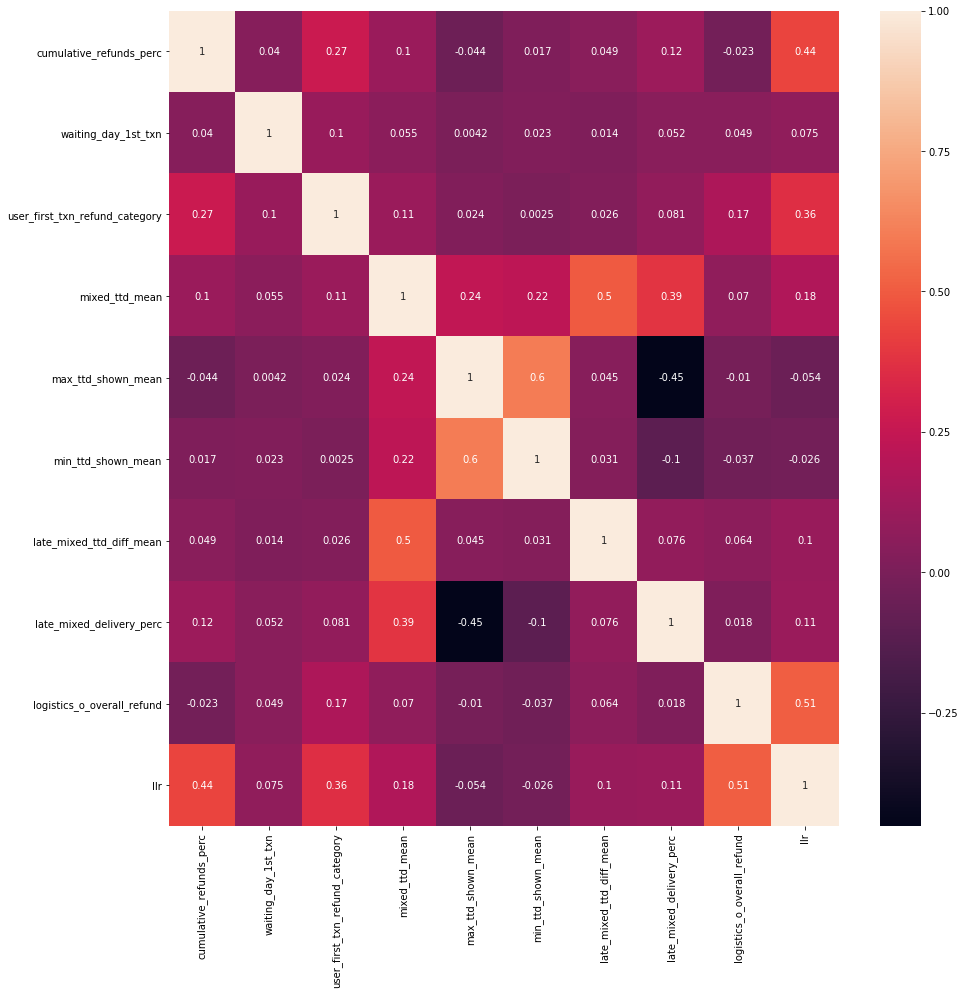

In [618]:
corrMatrix = df_sample5.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corrMatrix, annot=True)
plt.show()

<Figure size 1080x1080 with 0 Axes>

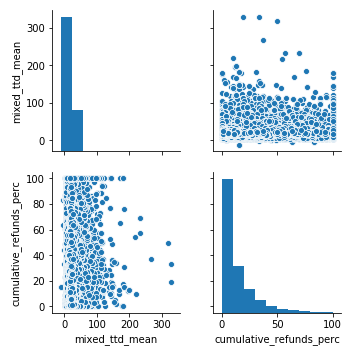

<Figure size 1080x1080 with 0 Axes>

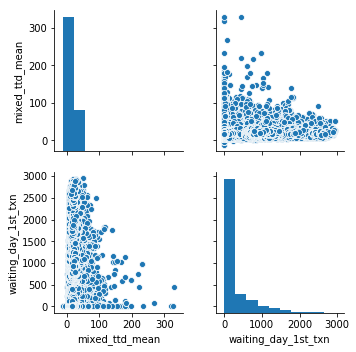

<Figure size 1080x1080 with 0 Axes>

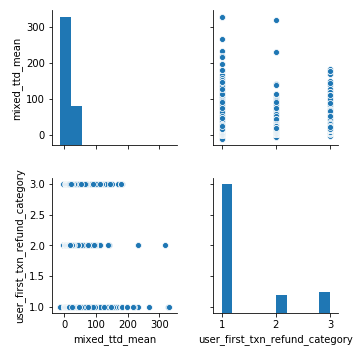

<Figure size 1080x1080 with 0 Axes>

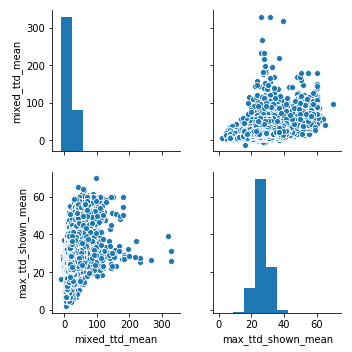

<Figure size 1080x1080 with 0 Axes>

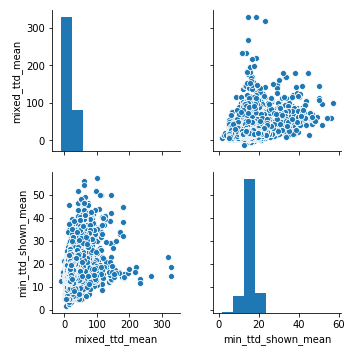

<Figure size 1080x1080 with 0 Axes>

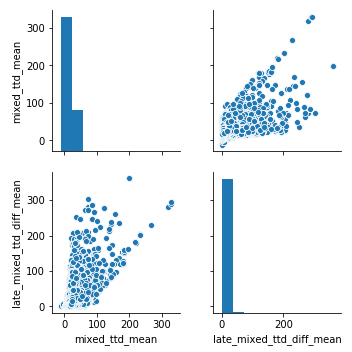

<Figure size 1080x1080 with 0 Axes>

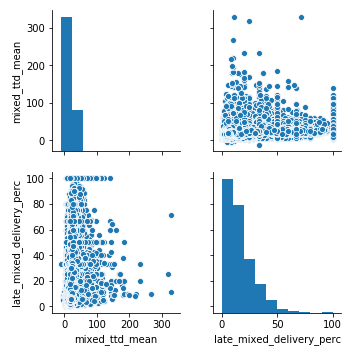

<Figure size 1080x1080 with 0 Axes>

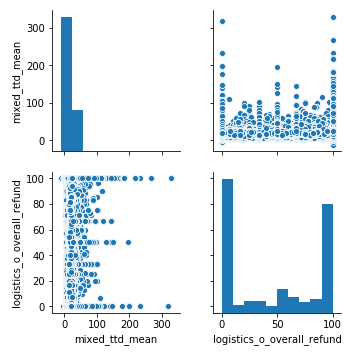

<Figure size 1080x1080 with 0 Axes>

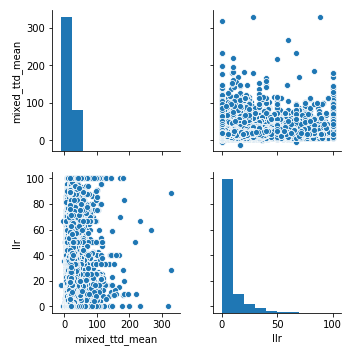

In [620]:
names = ['cumulative_refunds_perc'
       ,'waiting_day_1st_txn'
       ,'user_first_txn_refund_category'
       ,'max_ttd_shown_mean'
       ,'min_ttd_shown_mean'
       ,'late_mixed_ttd_diff_mean'
       ,'late_mixed_delivery_perc'
       ,'logistics_o_overall_refund'
       ,'llr']
for name in names:
    plt.figure(figsize=(15,15))
    sns.pairplot(df_sample5[['mixed_ttd_mean',name]])
    plt.show()

<Figure size 1080x1080 with 0 Axes>

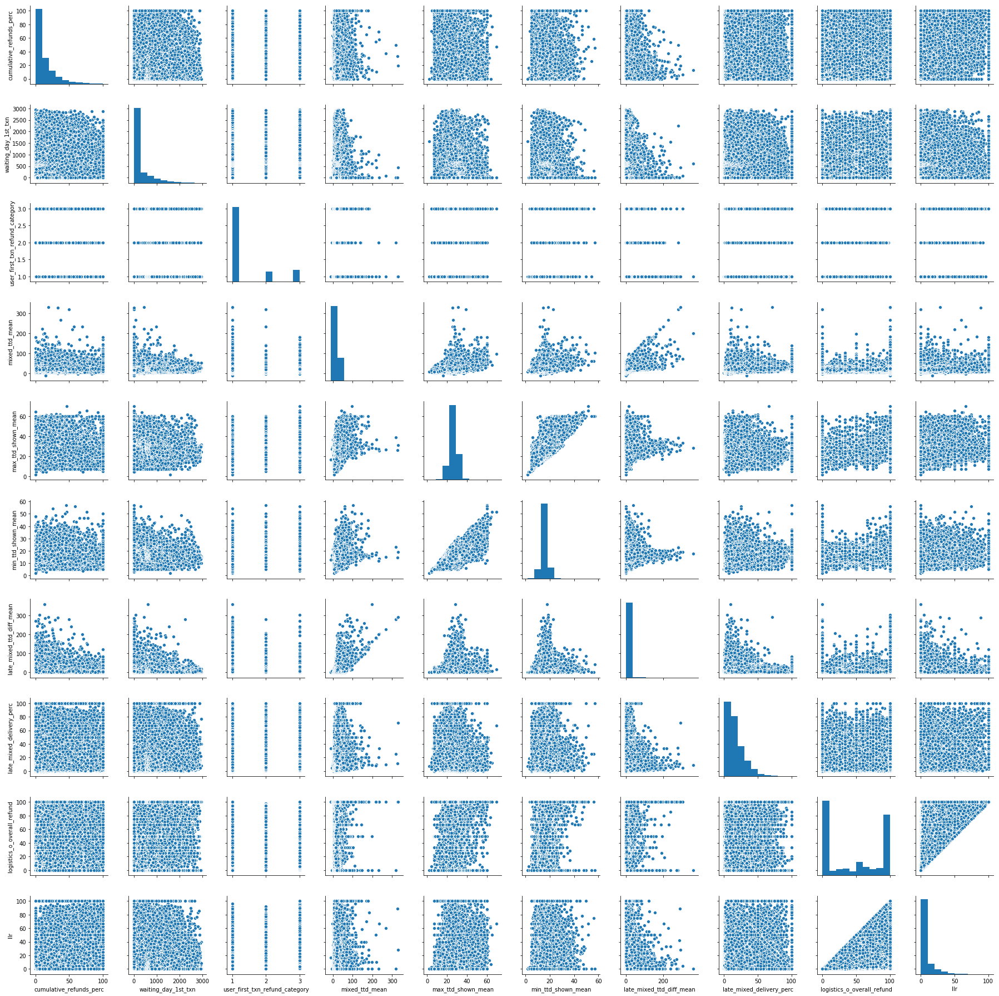

In [621]:
plt.figure(figsize=(15,15))
sns.pairplot(df_sample5)
# plt.show()

## models based on other 1 feature

In [759]:
feature = 'late_mixed_delivery_perc_bucket'
df_base_diff = df.groupby([feature,'first_txn_month'],as_index=False)['user_cnt_m0','user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6'
                                                                                 ,'user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12'].sum()
df_base_diff = pd.melt(df_base_diff, id_vars=[feature,'first_txn_month','user_cnt_m0']
                   ,value_vars=['user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6','user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12']
                   ,var_name='rentention_month_bucket', value_name='user_cnt')
df_base_diff['retention_value'] = round(100*df_base_diff.user_cnt/df_base_diff.user_cnt_m0,3)

mapping = {'user_cnt_m1': 1, 'user_cnt_m2': 2, 'user_cnt_m3': 3, 'user_cnt_m4': 4, 'user_cnt_m5': 5, 'user_cnt_m6': 6, 
           'user_cnt_m7': 7, 'user_cnt_m8': 8, 'user_cnt_m9': 9, 'user_cnt_m10': 10, 'user_cnt_m11': 11, 'user_cnt_m12': 12
          }
mapping2 = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

df_base_diff.replace({'rentention_month_bucket': mapping},inplace=True)
df_base_diff.replace({'user_first_txn_refund_category': mapping2},inplace=True)

# df_base_diff.head(10)

In [760]:
df_base_diff.info(),df_base_diff.dropna().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 6 columns):
late_mixed_delivery_perc_bucket    864 non-null int64
first_txn_month                    864 non-null object
user_cnt_m0                        864 non-null int64
rentention_month_bucket            864 non-null int64
user_cnt                           864 non-null int64
retention_value                    864 non-null float64
dtypes: float64(1), int64(4), object(1)
memory usage: 40.6+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 864 entries, 0 to 863
Data columns (total 6 columns):
late_mixed_delivery_perc_bucket    864 non-null int64
first_txn_month                    864 non-null object
user_cnt_m0                        864 non-null int64
rentention_month_bucket            864 non-null int64
user_cnt                           864 non-null int64
retention_value                    864 non-null float64
dtypes: float64(1), int64(4), object(1)
memory usage: 47.2+ KB


(None, None)

In [761]:
y= df_base_diff.retention_value
X = df_base_diff[[feature,'rentention_month_bucket','user_cnt_m0']]
y.head(),X.head()
X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_train = X2_train[[feature,'rentention_month_bucket']]
X2_test = X2_test[[feature,'rentention_month_bucket']]
X2_train_weight.shape,X2_train.shape

((604,), (604, 2))

In [762]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
    poly_reg.fit(x2_train_poly, y2_train)
#     poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
metrics_df

,Adjusted_R2,R2,RMSE
power_degree,,,
1,0.359937,0.364879,11.472976
2,0.450593,0.461199,10.567256
3,0.519823,0.536509,9.800963
4,0.610197,0.631267,8.741858
5,0.652335,0.679182,8.154125
6,0.655398,0.691322,7.998358
7,0.645374,0.693296,7.972739
8,0.564265,0.638290,8.658215


Text(0.5,1,'model evaluation metrics on feature = late_mixed_delivery_perc_bucket')

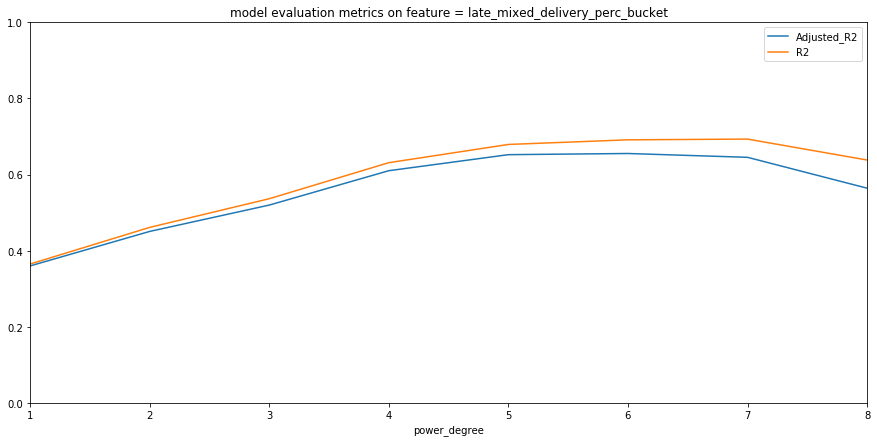

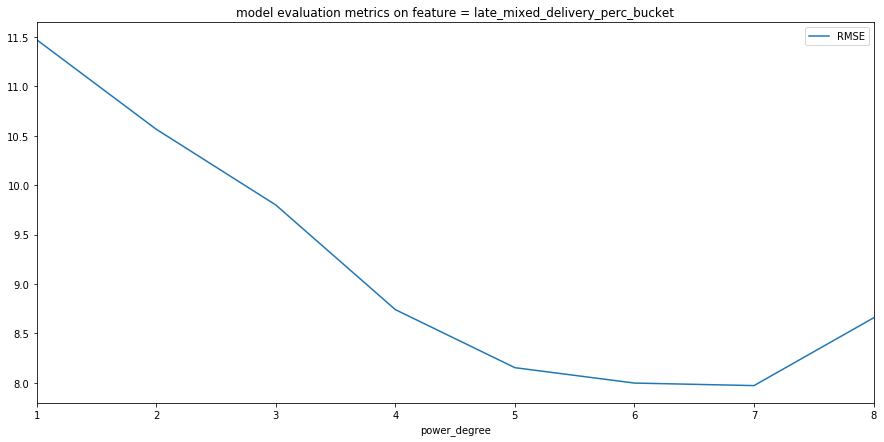

In [763]:
metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

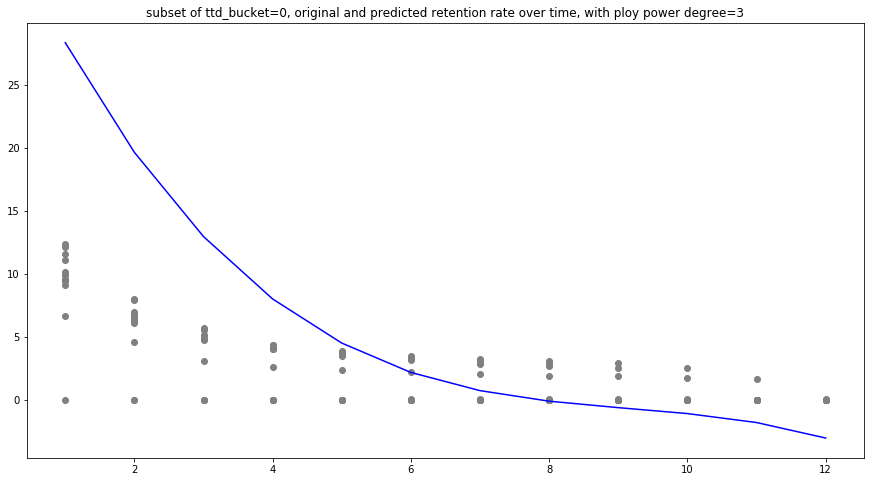

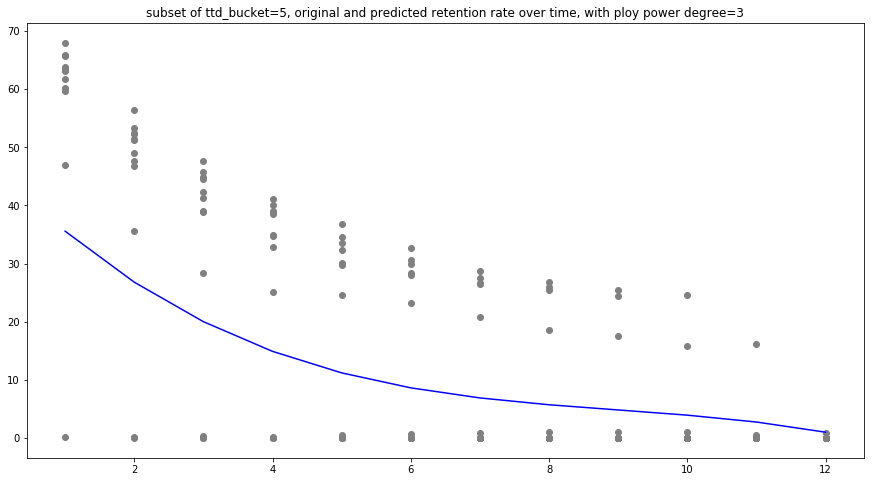

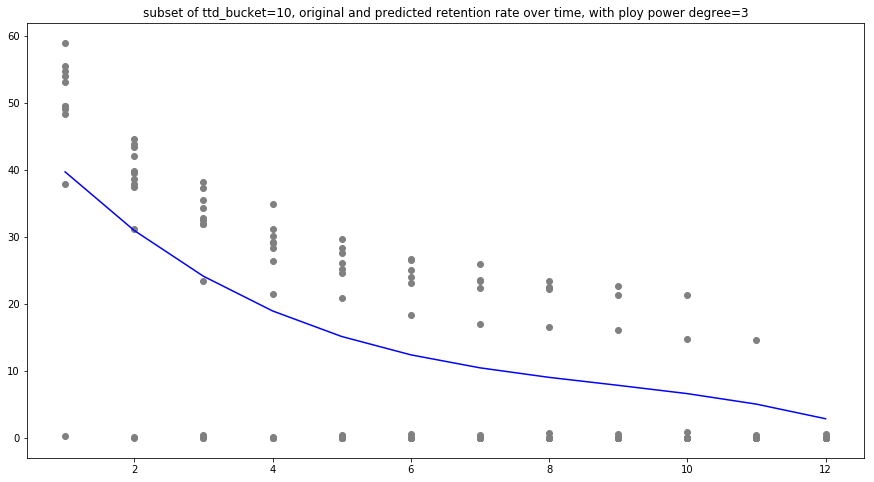

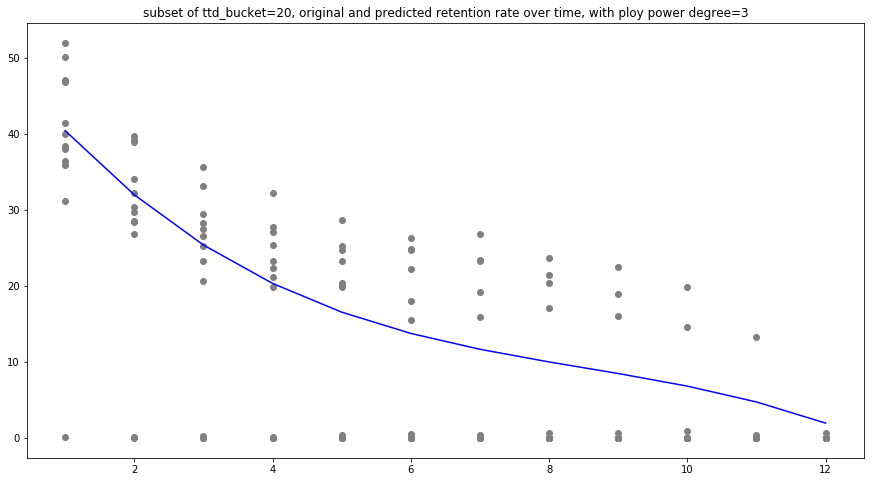

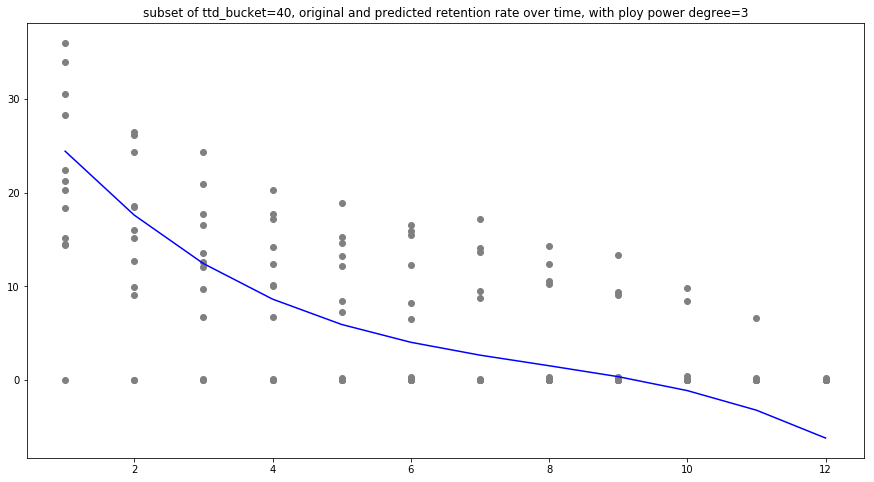

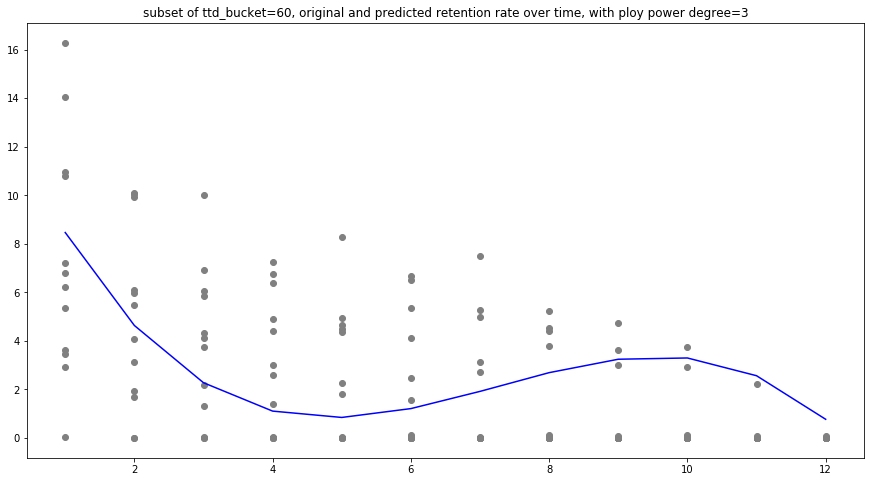

In [764]:
ttd_bucket = sorted(list(set(df_base_diff[feature])))
n=3

x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

for i in ttd_bucket:
    mask = df_base_diff[feature] ==i
    X_sub = df_base_diff.loc[mask,[feature,'rentention_month_bucket']]
    y_sub = df_base_diff.loc[mask,'retention_value']
    y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
    plt.figure(figsize=(15,8))
    plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
    plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
    plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

## models with more features

In [ ]:
# user_first_txn_refund_category
# ,cumulative_refunds_perc_bucket
# ,waiting_day_1st_txn_bucket
# ,mixed_ttd_mean_bucket
# ,max_ttd_shown_mean_bucket
# ,min_ttd_shown_mean_bucket
# ,late_mixed_ttd_diff_mean_bucket
# ,late_mixed_delivery_perc_bucket
# ,logistics_o_overall_refund_bucket
# ,llr_bucket

In [197]:
# # feature0 = ['late_mixed_delivery_perc_bucket','avg_value_bucket','mixed_ttd_mean_bucket']
# feature0 = ['avg_value_bucket','mixed_ttd_mean_bucket']
# feature = feature0.copy()
# # feature.append('first_txn_month')

# df_base_diff = df.groupby(feature,as_index=False)['user_cnt_m0','user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6'
#                                                                                  ,'user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12'].sum()
# feature.append('user_cnt_m0')
# df_base_diff = pd.melt(df_base_diff, id_vars=feature
#                ,value_vars=['user_cnt_m1','user_cnt_m2','user_cnt_m3','user_cnt_m4','user_cnt_m5','user_cnt_m6','user_cnt_m7','user_cnt_m8','user_cnt_m9','user_cnt_m10','user_cnt_m11','user_cnt_m12']
#                ,var_name='rentention_month_bucket', value_name='user_cnt')

# df_base_diff['retention_value'] = round(100*df_base_diff.user_cnt/df_base_diff.user_cnt_m0,3)

# mapping = {'user_cnt_m1': 1, 'user_cnt_m2': 2, 'user_cnt_m3': 3, 'user_cnt_m4': 4, 'user_cnt_m5': 5, 'user_cnt_m6': 6, 
#            'user_cnt_m7': 7, 'user_cnt_m8': 8, 'user_cnt_m9': 9, 'user_cnt_m10': 10, 'user_cnt_m11': 11, 'user_cnt_m12': 12
#           }
# mapping2 = {'no refund': 1, 'other refund': 2, 'logistics refund': 3}

# df_base_diff.replace({'rentention_month_bucket': mapping},inplace=True)
# # df_base_diff.replace({'user_first_txn_refund_category': mapping2},inplace=True)
# df_base_diff.head()

In [198]:
df_base2.head()

,avg_gmv_bucket_med,mixed_ttd_mean_bucket_med,user_cnt_m0,retention_month_bucket,user_cnt,retention_value
0,0.0,4.0,664,1,173,26.054
1,0.0,8.0,823,1,372,45.200
2,0.0,13.6,734,1,391,53.270
3,0.0,18.0,594,1,275,46.296
4,0.0,21.9,341,1,127,37.243


In [730]:
y= df_base2.retention_value
X = df_base2[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','retention_month_bucket','user_cnt_m0']]

X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
X2_train_weight = X2_train['user_cnt_m0']
X2_test_weight = X2_test['user_cnt_m0']
X2_train = X2_train[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','retention_month_bucket']]
X2_test = X2_test[['avg_gmv_bucket_med','mixed_ttd_mean_bucket_med','retention_month_bucket']]
X2_train_weight.shape,X2_train.shape,X2_test_weight.shape

((982,), (982, 3), (422,))

In [731]:
X2_train.head(),X2_train_weight.head(),X2_test.head(),X2_test_weight.head()

(     avg_gmv_bucket_med  mixed_ttd_mean_bucket_med  retention_month_bucket
 434                22.0                       13.6                       4
 991                 8.3                        8.0                       9
 349                52.4                       37.0                       3
 940                 0.0                       21.9                       9
 371                 1.8                       13.6                       4,
 434    119404
 991     81303
 349      1541
 940       341
 371     12256
 Name: user_cnt_m0, dtype: int64,
       avg_gmv_bucket_med  mixed_ttd_mean_bucket_med  retention_month_bucket
 654                 12.0                       32.0                       6
 312                 17.0                       32.0                       3
 224                 33.9                       42.2                       2
 608                  1.8                       26.8                       6
 1235                12.0                       1

In [732]:
# # feature.remove('first_txn_month')
# feature.append('rentention_month_bucket')

# y= df_base_diff.retention_value
# X = df_base_diff[feature]
# y.head(),X.head()
# X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.3, random_state=0)
# X2_train_weight = X2_train['user_cnt_m0']
# X2_test_weight = X2_test['user_cnt_m0']

# feature.remove('user_cnt_m0')
# X2_train = X2_train[feature]
# X2_test = X2_test[feature]
# X2_train_weight.shape,X2_train.shape,X2_train_weight.head(),X2_test_weight.head()

              Adjusted_R2        R2      RMSE
power_degree                                 
1                0.388729  0.393085  5.384958
2                0.558982  0.568410  4.541028
3                0.649101  0.664937  4.001119
4                0.679588  0.705465  3.751346
5                0.664697  0.708501  3.731958
6                0.643369  0.713678  3.698668
7                0.656193  0.753374  3.432716
8                0.719952  0.829044  2.857987


Text(0.5,1,"model evaluation metrics on feature = ['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'user_cnt_m0']")

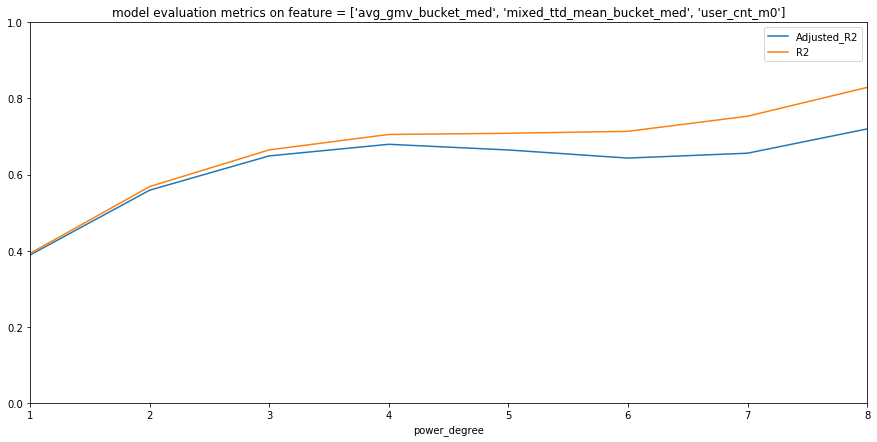

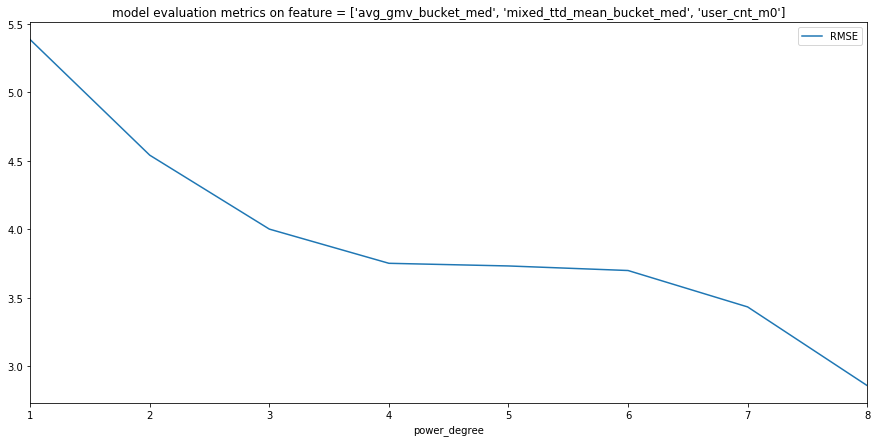

In [733]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    poly_reg.fit(x2_train_poly, y2_train)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
print(metrics_df)

metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

In [734]:
ttd_bucket = sorted(list(set(df_base_diff.mixed_ttd_mean_bucket_med)))

d=2

poly = PolynomialFeatures(d, include_bias=False)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))

# x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
# poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
poly_reg.fit(x2_train_poly, y2_train)

# model_coef = pd.DataFrame(list(zip(poly_feature_name,poly_reg.coef_)),columns=['poly_feature_name','poly_feature_coef'])
# print(model_coef)

# for i in ttd_bucket:
#     mask = df_base_diff.mixed_ttd_mean_bucket ==i
#     X_sub = df_base_diff.loc[mask,feature]
#     y_sub = df_base_diff.loc[mask,'retention_value']
#     y_sub_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X_sub))
    
#     plt.figure(figsize=(15,8))
#     plt.scatter(X_sub['rentention_month_bucket'],y_sub,c='grey')
#     plt.plot(X_sub['rentention_month_bucket'], y_sub_predict,c='blue')
#     plt.title('subset of ttd_bucket={}, original and predicted retention rate over time, with ploy power degree={}'.format(i,n))

The polynomial features name are:['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'retention_month_bucket', 'avg_gmv_bucket_med^2', 'avg_gmv_bucket_med mixed_ttd_mean_bucket_med', 'avg_gmv_bucket_med retention_month_bucket', 'mixed_ttd_mean_bucket_med^2', 'mixed_ttd_mean_bucket_med retention_month_bucket', 'retention_month_bucket^2']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

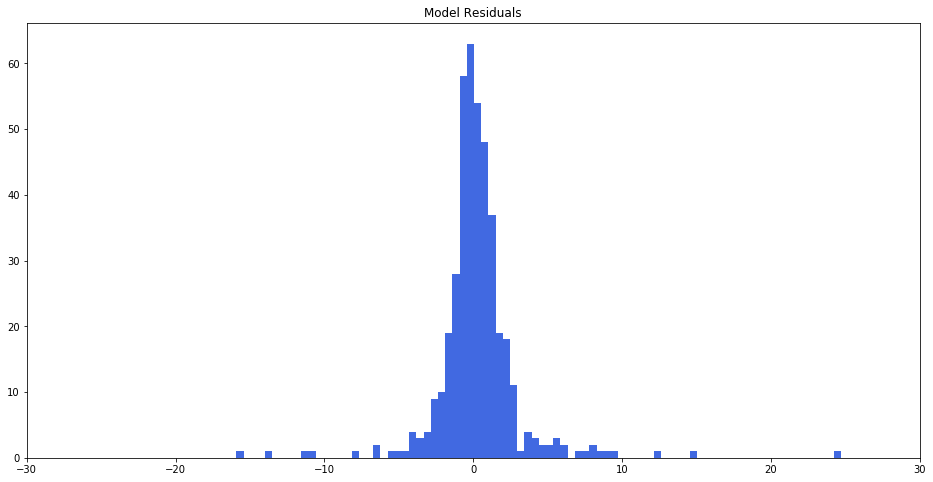

In [735]:
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins='auto',figsize=(16, 8))
plt.title("Model Residuals")
plt.xlim(-30,30)
plt.show()

In [736]:
sorted(list(set(X2_train.avg_gmv_bucket_med))),sorted(list(set(X2_train.mixed_ttd_mean_bucket_med)))

([0.0, 1.0, 1.8, 2.7, 4.0, 5.9, 8.3, 12.0, 17.0, 22.0, 27.1, 33.9, 52.4],
 [4.0, 8.0, 13.6, 18.0, 21.9, 26.8, 32.0, 37.0, 42.2])

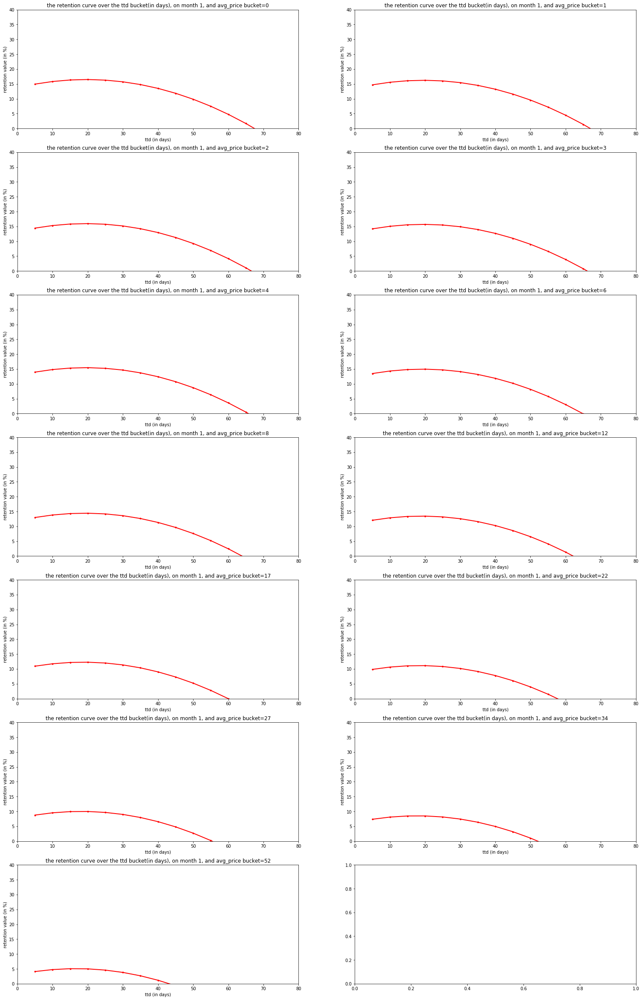

In [737]:
# month = list(np.arange(1, 6, 1))
month = 1
# price = sorted(list(set(X2_train.avg_value_bucket)))
price = [0,1,2,3,4,6,8,12,17,22,27,34,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=3

for i in range(len(price)):
    
    ttd = list(np.arange(5, 95, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,40)
    axes[x][y].set_xlim(0,80)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

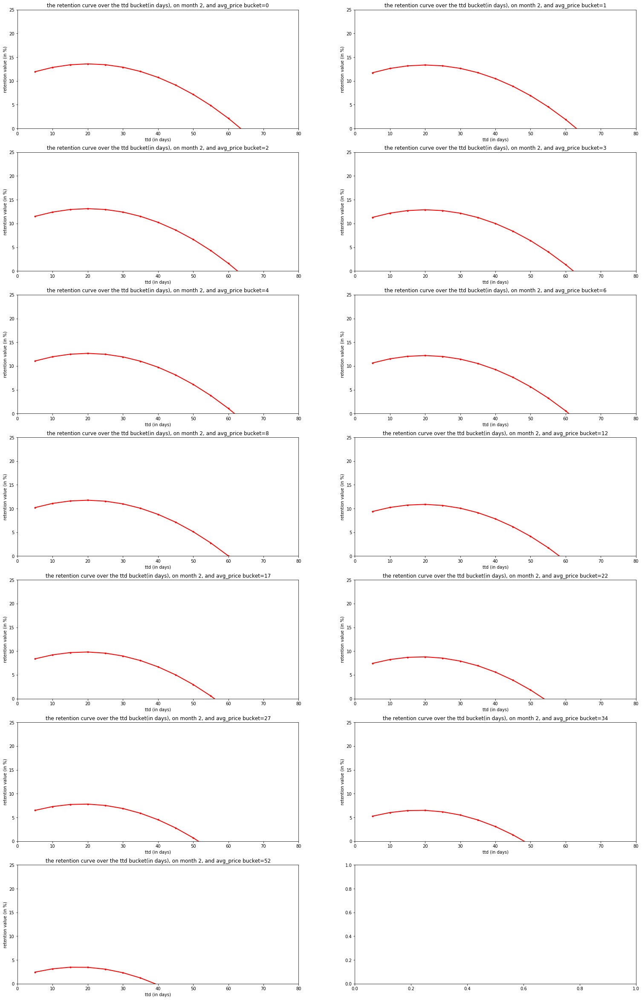

In [739]:
# month = list(np.arange(1, 6, 1))
month = 2
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,44,68]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=7

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,25)
    axes[x][y].set_xlim(0,80)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

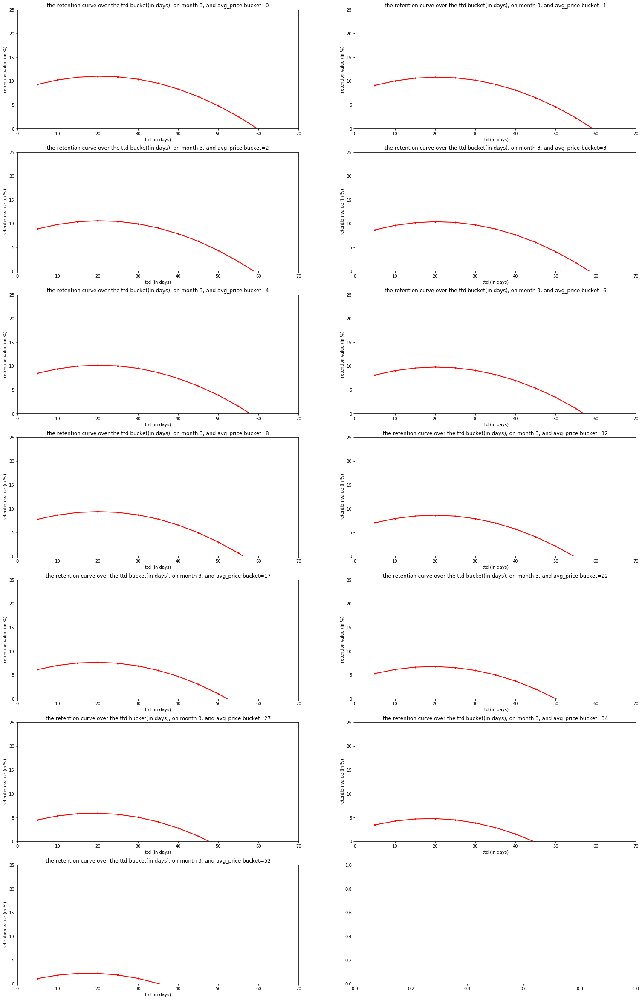

In [738]:
# month = list(np.arange(1, 6, 1))
month = 3
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,5,6,7,8,9,10,12,18,25]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))
# d=7

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,25)
    axes[x][y].set_xlim(0,70)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

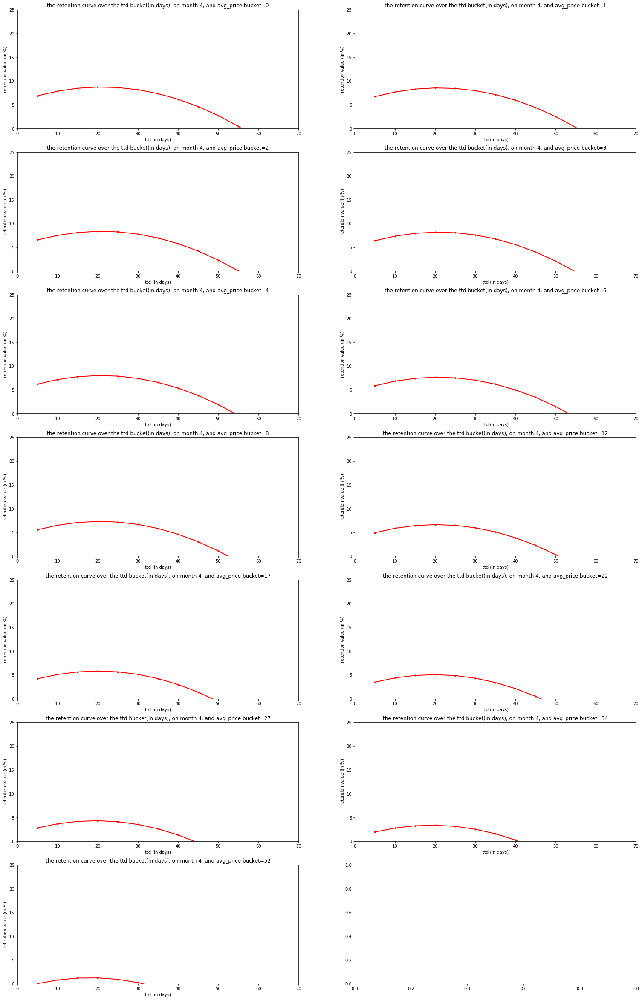

In [740]:
# month = list(np.arange(1, 6, 1))
month = 4
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,5,6,7,8,9,10,12,18,25]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))
# d=7

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,25)
    axes[x][y].set_xlim(0,70)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

### weighted regression by user_cnt

              Adjusted_R2        R2      RMSE
power_degree                                 
1                0.655826  0.658278  4.705030
2                0.843300  0.846649  3.151874
3                0.903242  0.907609  2.446474
4                0.934700  0.939973  1.971958
5                0.959392  0.964697  1.512278
6                0.972933  0.978270  1.186478
7                0.977318  0.983729  1.026669
8                0.970156  0.981781  1.086382


Text(0.5,1,"model evaluation metrics on feature = ['avg_gmv_bucket_med', 'mixed_ttd_mean_bucket_med', 'user_cnt_m0']")

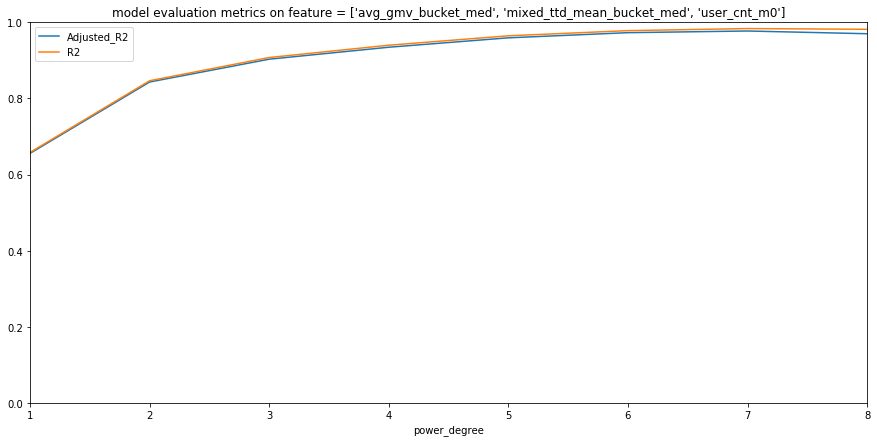

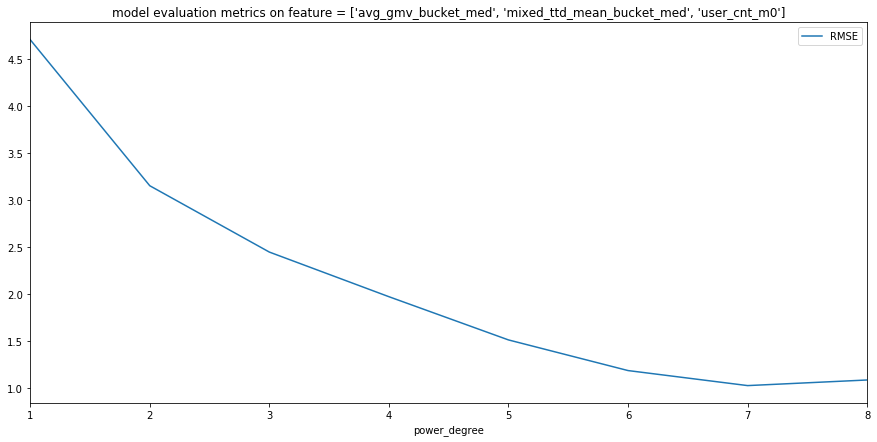

In [741]:
metrics_list = []

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

    poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    poly_reg.fit(x2_train_poly, y2_train, sample_weight=X2_train_weight)

    model_coef = poly_reg.coef_
    model_intercept = poly_reg.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=poly_reg.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict, sample_weight=X2_test_weight)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict, sample_weight=X2_test_weight)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2}
    metrics_list.append(metrics_dic)
    
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
print(metrics_df)

metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

In [727]:
ttd_bucket = sorted(list(set(df_base_diff.mixed_ttd_mean_bucket_med)))

d=2

poly = PolynomialFeatures(d, include_bias=False)
x2_train_poly = poly.fit_transform(X2_train)
poly_feature_name = poly.get_feature_names(X2_train.columns)
print('The polynomial features name are:{}'.format(poly_feature_name))

# x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
poly_reg = LinearRegression()
poly_reg.fit(x2_train_poly, y2_train,sample_weight=X2_train_weight)
# poly_reg.fit(x2_train_poly, y2_train)

The polynomial features name are:['mixed_ttd_mean_bucket_med', 'sqrt_retention_month_bucket', 'mixed_ttd_mean_bucket_med^2', 'mixed_ttd_mean_bucket_med sqrt_retention_month_bucket', 'sqrt_retention_month_bucket^2']


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

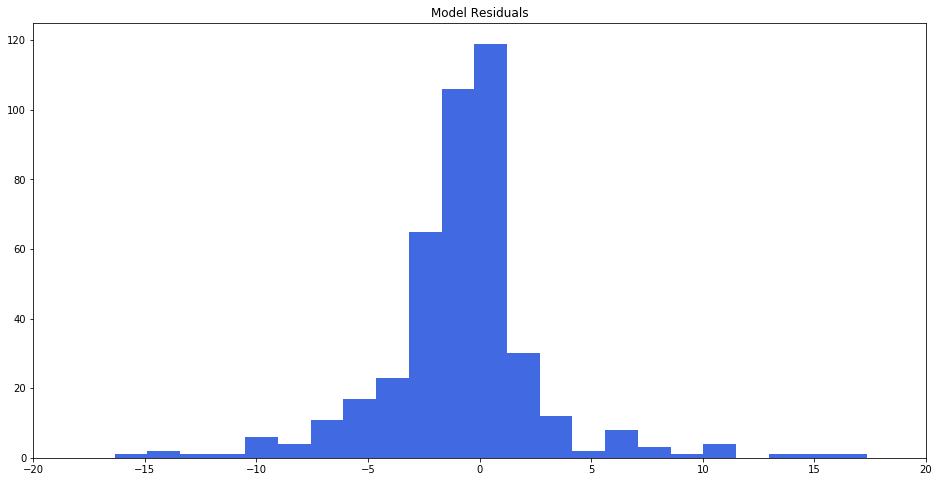

In [728]:
(y2_test - y2_test_predict).hist(grid = False, color = 'royalblue',bins=35,figsize=(16, 8))
plt.title("Model Residuals")
plt.xlim(-20,20)
plt.show()

ValueError: shapes (20,9) and (5,) not aligned: 9 (dim 1) != 5 (dim 0)

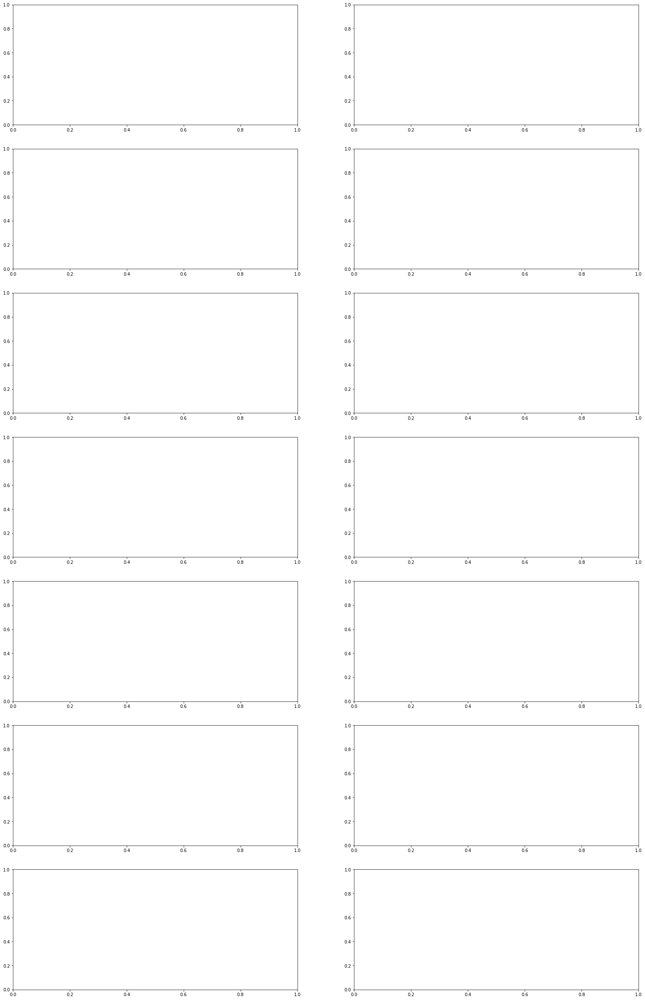

In [729]:
# month = list(np.arange(1, 6, 1))
month = 1
# price = sorted(list(set(X2_train.avg_value_bucket)))
price = [0,1,2,3,4,6,8,12,17,22,27,34,44,52]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=4

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,35)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

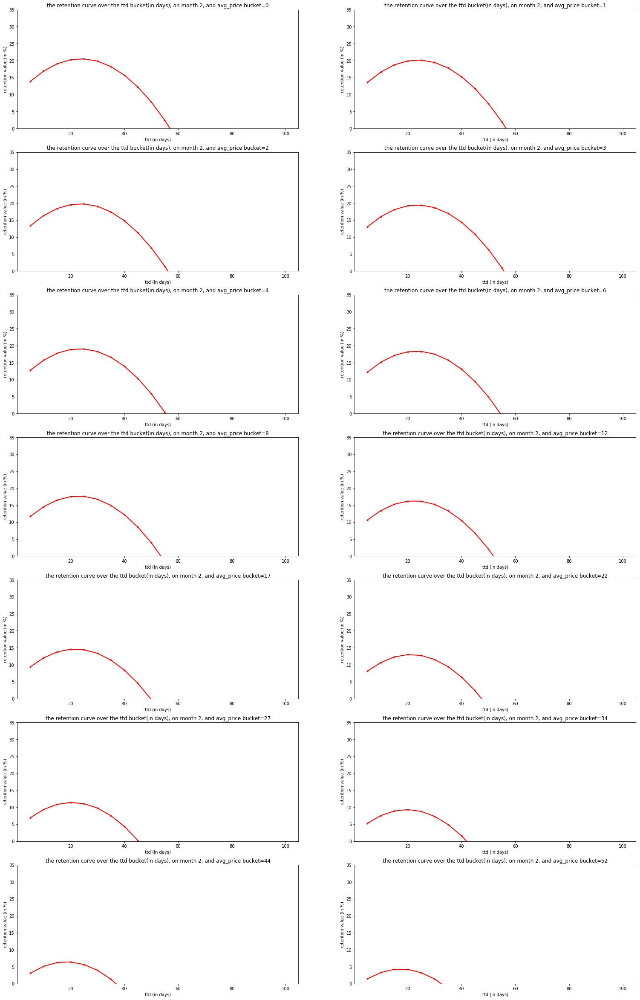

In [664]:
# month = list(np.arange(1, 6, 1))
month = 2
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,44,68]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=5

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,35)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

ValueError: shapes (20,9) and (164,) not aligned: 9 (dim 1) != 164 (dim 0)

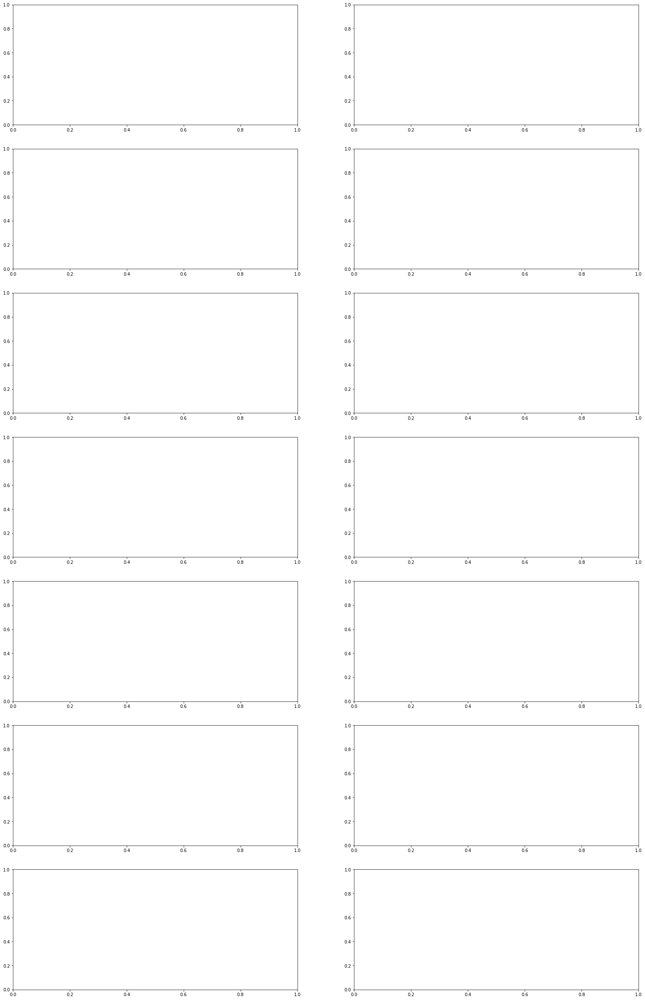

In [746]:
# month = list(np.arange(1, 6, 1))
month = 3
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,44,68]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=5

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,35)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

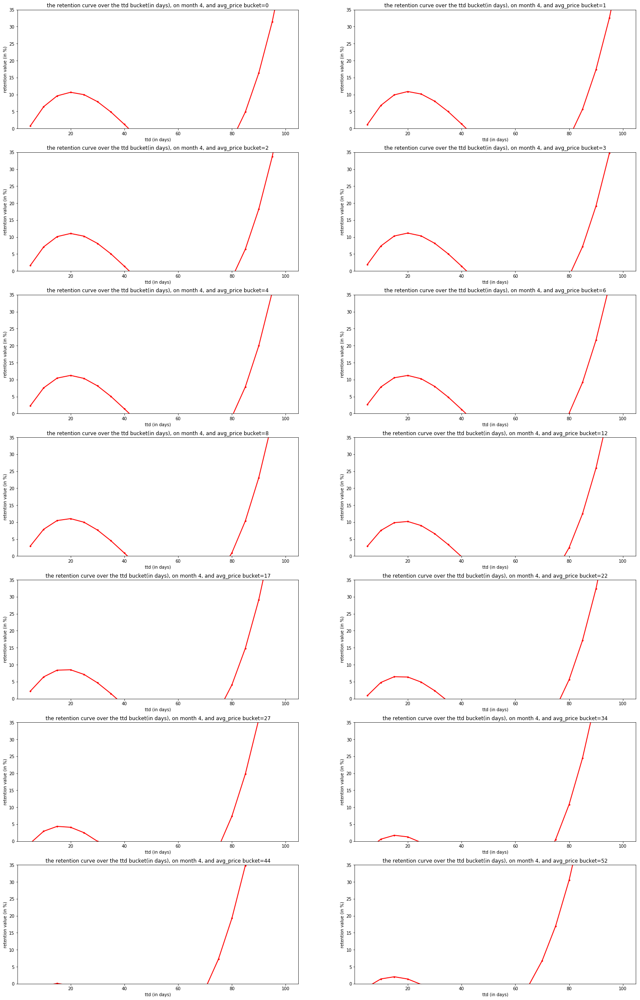

In [660]:
# month = list(np.arange(1, 6, 1))
month = 4
# price = sorted(list(set(X2_train.avg_value_bucket)))
# price = [0,1,2,3,4,6,8,12,17,22,27,34,44,68]
m = 2
n = (len(price)+1) // m

fig, axes = plt.subplots(n, m, figsize=(m*13, n*6))

# d=5

for i in range(len(price)):
    
    ttd = list(np.arange(5, 105, 5))
    
    simulated_rentention_month_bucket = list([month]*len(ttd))
    simulated_price = [price[i]]*len(ttd)
    
    df_simulated = pd.DataFrame(columns=['ttd','retention_projected'])
    
    df_simulated['ttd'] = ttd
    
    X_df = pd.DataFrame(list(np.column_stack([simulated_price,ttd,simulated_rentention_month_bucket])),columns=['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket'])
    X_df['avg_value_bucket'] = simulated_price
    df_simulated['retention_projected']=poly_reg.predict(PolynomialFeatures(d, include_bias=False).fit_transform(X_df[['avg_value_bucket','mixed_ttd_mean_bucket','rentention_month_bucket']]))
        
    x = i//m
    y = i%m
    
#     plt.figure(figsize=(15,8))
#     plt.ylim(0, 40)
#     df_simulated.plot(ax=axes[x][y])
    axes[x][y].plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, marker='.', color='red', linewidth=2)
#     plt.plot( 'ttd', 'retention_projected', data=df_simulated, ax=axes[x][y], marker='.', color='red', linewidth=2)
    axes[x][y].set_ylim(0,35)
    axes[x][y].set_xlabel('ttd (in days)')
    axes[x][y].set_ylabel('retention value (in %)')
    axes[x][y].set_title('the retention curve over the ttd bucket(in days), on month {}, and avg_price bucket={}'.format(month,price[i]))

### fit on Lasso regression

In [103]:
X2_train.head()

,avg_value_bucket,mixed_ttd_mean_bucket,rentention_month_bucket
2027,3.5,85.0,11
1038,3.5,15.0,6
55,2.5,120.0,1
653,3.5,65.0,4
43,2.5,10.0,1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5664.502746387007, tolerance: 46.49142742120045
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8467.944532630443, tolerance: 46.49142742120045
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8162.001944425996, tolerance: 46.49142742120045
  positive)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/c

              Adjusted_R2        R2      RMSE  num of features used  \
power_degree                                                          
1                0.499136  0.501268  3.680947                     3   
2                0.553208  0.558912  3.461692                     8   
3                0.576145  0.587568  3.347357                    17   
4                0.654806  0.671453  2.987613                    31   
5                0.656451  0.683252  2.933476                    49   
6                0.669532  0.708438  2.814433                    77   
7                0.663252  0.720093  2.757607                   113   
8                0.613942  0.703748  2.836980                   158   

              num of total feature  
power_degree                        
1                                3  
2                                9  
3                               19  
4                               34  
5                               55  
6                             

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7697.82767308513, tolerance: 46.49142742120045
  positive)


Text(0.5,1,"model evaluation metrics on feature = ['avg_value_bucket', 'mixed_ttd_mean_bucket', 'rentention_month_bucket']")

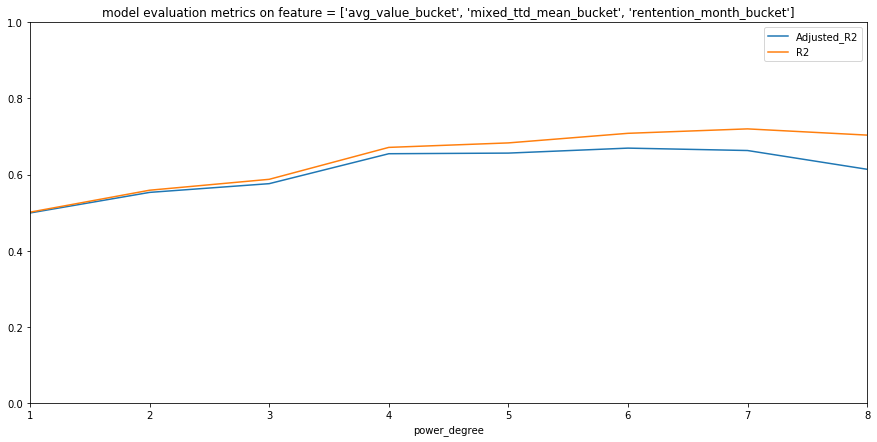

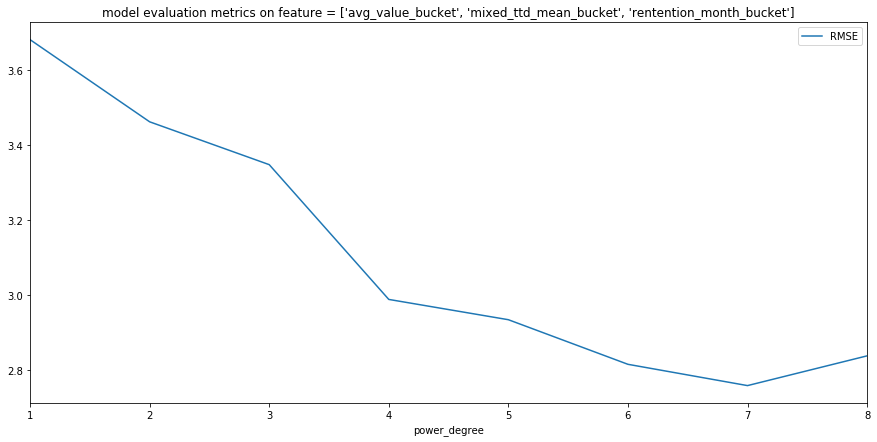

In [104]:
metrics_list = []
alpha=1

for n in range(1,9):

    x2_train_poly = PolynomialFeatures(n, include_bias=False).fit_transform(X2_train)
    ## poly feature orders is x1, x2, x1^2, x1*x2, x2^2
#     print('The new Polynomial feature matrix has dim of {}'.format(x2_train_poly.shape))

#     poly_reg = LinearRegression()
#     poly_reg.fit(x2_train_poly, y2_train)
    lasso = Lasso(alpha=alpha, max_iter=10e4,random_state=1,tol=0.001)
    lasso.fit(x2_train_poly,y2_train)

    model_coef = lasso.coef_
    model_intercept = lasso.intercept_
#     print('The poly regression model coefficient is:{}, with the intercept = {}'.format(model_coef,model_intercept))

    y2_test_predict=lasso.predict(PolynomialFeatures(n, include_bias=False).fit_transform(X2_test))

    model_mse = mean_squared_error(y2_test, y2_test_predict)
    model_rmse =  math.sqrt(model_mse)
    model_r2 = r2_score(y2_test, y2_test_predict)
    adjusted_r2 = 1 - (1-model_r2)*(len(y2_test)-1)/(len(y2_test)-PolynomialFeatures(n, include_bias=False).fit_transform(X2_test).shape[1]-1)
    
    metrics_dic = {'power_degree':n,'RMSE':model_rmse,'R2':model_r2,'Adjusted_R2':adjusted_r2,'num of features used':np.sum(lasso.coef_!=0),'num of total feature': len(lasso.coef_)}
    metrics_list.append(metrics_dic)
     
metrics_df = pd.DataFrame(metrics_list)
metrics_df.set_index('power_degree',inplace=True)
print(metrics_df)

metrics_df[['Adjusted_R2','R2']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))
plt.ylim(0,1)
metrics_df[['RMSE']].plot(figsize=(15, 7))
plt.title('model evaluation metrics on feature = {}'.format(feature))

## Investigation on abnormal high retention value when avg_ttd = 45+

In [276]:
df_inv1 = dw.td_query('''
with base as (
select *
       ,(case
        when mixed_ttd_mean <=5 then '5-'
        when (mixed_ttd_mean >5) and (mixed_ttd_mean <=10) then '5-10'
        when (mixed_ttd_mean >10) and (mixed_ttd_mean <=15) then '10-15'
        when (mixed_ttd_mean >15) and (mixed_ttd_mean <=20) then '15-20'
        when (mixed_ttd_mean >20) and (mixed_ttd_mean <=25) then '20-25'
        when (mixed_ttd_mean >25) and (mixed_ttd_mean <=30) then '25-30'
        when (mixed_ttd_mean >30) and (mixed_ttd_mean <=35) then '30-35'
        when (mixed_ttd_mean >35) and (mixed_ttd_mean <=40) then '35-40'
        when (mixed_ttd_mean >40) and (mixed_ttd_mean <=45) then '40-45'
        when (mixed_ttd_mean >45) and (mixed_ttd_mean <=50) then '45-50'
        when (mixed_ttd_mean >50) and (mixed_ttd_mean <=55) then '50-55'
        when (mixed_ttd_mean >55) and (mixed_ttd_mean <=60) then '55-60'
        when mixed_ttd_mean >60 then '60+'
        end) as mixed_ttd_mean_bucket2
from analytics.jay_ttd_rentention_training
)

select *
       ,sum(user_cnt) ove›r () as total_user_cnt
       ,round(10000.00*user_cnt/(100.00*sum(user_cnt) over ()),1) as user_perc
       ,round(10000.00*m_order_cnt/(100.00*sum(m_order_cnt) over ()),1) as m_order_perc
       ,round(10000.00*c_order_cnt/(100.00*sum(c_order_cnt) over ()),1) as c_order_perc
from (
select mixed_ttd_mean_bucket2
       ,count(distinct user_id) as user_cnt
       ,count(distinct m_transaction_id) as m_order_cnt
       ,count(distinct c_transaction_id) as c_order_cnt
from base
group by 1
) as temp
order by 1
'''
# ,job_id=756667984
,engine='presto'
                )
df_inv1

You can look at job id 767736330


,mixed_ttd_mean_bucket2,user_cnt,m_order_cnt,c_order_cnt,total_user_cnt,user_perc,m_order_perc,c_order_perc
0,10-15,1343194,10504622,5225299,9687235,13.9,12.6,14.6
1,15-20,2263204,32901682,13123894,9687235,23.4,39.6,36.6
2,20-25,1254035,21454987,7615358,9687235,12.9,25.8,21.2
3,25-30,403290,4687323,1702787,9687235,4.2,5.6,4.7
4,30-35,142145,1198720,476347,9687235,1.5,1.4,1.3
5,35-40,57380,412287,174848,9687235,0.6,0.5,0.5
6,40-45,28771,182800,80372,9687235,0.3,0.2,0.2
7,45-50,12237,81796,36873,9687235,0.1,0.1,0.1
8,5-,345806,1027788,694023,9687235,3.6,1.2,1.9
9,5-10,529107,2419235,1478838,9687235,5.5,2.9,4.1


In [278]:
df_inv2 = dw.td_query('''
select *
       ,sum(user_cnt) over () as total_user_cnt
       ,round(10000.00*user_cnt/(100.00*sum(user_cnt) over ()),1) as user_perc
       ,round(10000.00*m_order_cnt/(100.00*sum(m_order_cnt) over ()),1) as m_order_perc
       ,round(10000.00*c_order_cnt/(100.00*sum(c_order_cnt) over ()),1) as c_order_perc
from ( 
select mixed_ttd_mean_bucket
       ,count(distinct user_id) as user_cnt
       ,count(distinct m_transaction_id) as m_order_cnt
       ,count(distinct c_transaction_id) as c_order_cnt
from analytics.jay_ttd_rentention_training
group by 1
) as temp
order by 1
'''
# ,job_id=756667984
,engine='presto'
                )
df_inv2

You can look at job id 767741459


,mixed_ttd_mean_bucket,user_cnt,m_order_cnt,c_order_cnt,total_user_cnt,user_perc,m_order_perc,c_order_perc
0,10-15,1343194,10504622,5225299,9687235,13.9,12.6,14.6
1,15-20,2263204,32901682,13123894,9687235,23.4,39.6,36.6
2,20-25,1254035,21454987,7615358,9687235,12.9,25.8,21.2
3,25-30,403290,4687323,1702787,9687235,4.2,5.6,4.7
4,30-35,142145,1198720,476347,9687235,1.5,1.4,1.3
5,35-45,86151,595087,255220,9687235,0.9,0.7,0.7
6,45-60,22674,147743,69089,9687235,0.2,0.2,0.2
7,5-,345806,1027788,694023,9687235,3.6,1.2,1.9
8,5-10,529107,2419235,1478838,9687235,5.5,2.9,4.1
9,60+,9284,58226,31345,9687235,0.1,0.1,0.1


In [389]:
df_inv3 = dw.td_query('''
select *
       ,sum(user_cnt) over () as total_user_cnt
       ,round(10000.00*user_cnt/(100.00*sum(user_cnt) over ()),1) as user_perc
       ,round(10000.00*m_order_cnt/(100.00*sum(m_order_cnt) over ()),1) as m_order_perc
       ,round(10000.00*c_order_cnt/(100.00*sum(c_order_cnt) over ()),1) as c_order_perc
from ( 
select avg_gmv_bucket
       ,count(distinct user_id) as user_cnt
       ,count(distinct m_transaction_id) as m_order_cnt
       ,count(distinct c_transaction_id) as c_order_cnt
from analytics.jay_ttd_rentention_training
group by 1
) as temp
order by 1
'''
# ,job_id=756667984
,engine='presto'
                )
df_inv3

You can look at job id 767754637


,avg_gmv_bucket,user_cnt,m_order_cnt,c_order_cnt,total_user_cnt,user_perc,m_order_perc,c_order_perc
0,0,15783,207019,133027,9687235,0.2,0.2,0.4
1,0-1,955354,1498389,1225654,9687235,9.9,1.8,3.4
2,1-2,463600,1723549,1106161,9687235,4.8,2.1,3.1
3,10-15,1370866,13298185,5672487,9687235,14.2,16.0,15.8
4,15-20,744230,5251909,2481965,9687235,7.7,6.3,6.9
5,2-3,906868,5981714,2773342,9687235,9.4,7.2,7.7
6,20-25,428161,2199132,1149964,9687235,4.4,2.6,3.2
7,25-30,245703,1010915,570770,9687235,2.5,1.2,1.6
8,3-5,1578695,18886638,7347715,9687235,16.3,22.7,20.5
9,30-40,257659,806576,505502,9687235,2.7,1.0,1.4


In [390]:
df_inv4 = dw.td_query('''
select *
       ,sum(user_cnt) over () as total_user_cnt
       ,round(10000.00*user_cnt/(100.00*sum(user_cnt) over ()),1) as user_perc
       ,round(10000.00*m_order_cnt/(100.00*sum(m_order_cnt) over ()),1) as m_order_perc
       ,round(10000.00*c_order_cnt/(100.00*sum(c_order_cnt) over ()),1) as c_order_perc
from ( 
select carrier_ttd_mean_bucket
       ,count(distinct user_id) as user_cnt
       ,count(distinct m_transaction_id) as m_order_cnt
       ,count(distinct c_transaction_id) as c_order_cnt
from analytics.jay_ttd_rentention_training
group by 1
) as temp
order by 1
'''
# ,job_id=756667984
,engine='presto'
                )
df_inv4

You can look at job id 767757087


,carrier_ttd_mean_bucket,user_cnt,m_order_cnt,c_order_cnt,total_user_cnt,user_perc,m_order_perc,c_order_perc
0,10-15,1360478,11859996,5910963,9687235,14.0,14.3,16.5
1,15-20,2142069,32365812,12607529,9687235,22.1,38.9,35.2
2,20-25,1105530,19163059,6456746,9687235,11.4,23.0,18.0
3,25-30,340470,4131252,1397237,9687235,3.5,5.0,3.9
4,30-35,113855,1030765,373352,9687235,1.2,1.2,1.0
5,35-45,68049,493702,191389,9687235,0.7,0.6,0.5
6,45-55,13635,92098,37707,9687235,0.1,0.1,0.1
7,5-,360970,1212651,812039,9687235,3.7,1.5,2.3
8,5-10,556458,2898118,1784707,9687235,5.7,3.5,5.0
9,55+,7162,41985,19860,9687235,0.1,0.1,0.1


### check the distribution per delivery program on low TTD orders

In [123]:
df_inv5 = dw.td_query('''
with base as (
select mixed_ttd_mean_bucket
       ,user_id
       ,user_ttd_avg
       ,user_order_cnt
       ,round(100.00*user_DS_order_cnt/(1.0*user_order_cnt),1) as DS_order_perc
       ,round(100.00*user_WE_order_cnt/(1.0*user_order_cnt),1) as WE_order_perc
       ,round(100.00*user_EPC_order_cnt/(1.0*user_order_cnt),1) as EPC_order_perc
       ,round(100.00*user_FBW_order_cnt/(1.0*user_order_cnt),1) as FBW_order_perc
       ,round(100.00*user_Fusion_order_cnt/(1.0*user_order_cnt),1) as Fusion_order_perc
       ,user_DS_order_cnt
       ,user_WE_order_cnt
       ,user_EPC_order_cnt
       ,user_FBW_order_cnt
       ,user_Fusion_order_cnt
from(
select mixed_ttd_mean_bucket
       ,user_id
       ,avg(user_ttd_mean) as user_ttd_avg
       ,sum(m_order_cnt_w_ttd) as user_order_cnt
       ,sum(if(dim_delivery_program='Dropship',m_order_cnt_w_ttd,0)) as user_DS_order_cnt
       ,sum(if(dim_delivery_program='Wish_Express',m_order_cnt_w_ttd,0)) as user_WE_order_cnt
       ,sum(if(dim_delivery_program='EPC',m_order_cnt_w_ttd,0)) as user_EPC_order_cnt
       ,sum(if(dim_delivery_program='FBW',m_order_cnt_w_ttd,0)) as user_FBW_order_cnt
       ,sum(if(dim_delivery_program='Fusion',m_order_cnt_w_ttd,0)) as user_Fusion_order_cnt
from analytics.jay_ttd_rentention_investigation
group by mixed_ttd_mean_bucket
         ,user_id
)
)

select mixed_ttd_mean_bucket
       ,sum(user_order_cnt) as total_order_cnt
       ,round(avg(user_ttd_avg),1) as user_ttd_avg
       ,round(avg(DS_order_perc),1) as DS_order_perc_avg
       ,round(avg(WE_order_perc),1) as WE_order_perc_avg
       ,round(avg(EPC_order_perc),1) as EPC_order_perc_avg
       ,round(avg(FBW_order_perc),1) as FBW_order_perc_avg
       ,round(avg(Fusion_order_perc),1) as Fusion_order_perc_avg
from base
group by 1
order by 3 asc
'''
,job_id=769094419
,engine='presto'
                )
df_inv5

You can look at job id 769094419


,mixed_ttd_mean_bucket,total_order_cnt,user_ttd_avg,DS_order_perc_avg,WE_order_perc_avg,EPC_order_perc_avg,FBW_order_perc_avg,Fusion_order_perc_avg
0,5-,449075,4.0,31.4,67.8,0.0,0.7,0.0
1,5-10,1108515,7.9,49.2,49.4,0.8,0.6,0.0
2,10-15,5272874,13.2,72.2,11.2,15.9,0.5,0.3
3,15-20,17819858,17.7,56.5,3.7,38.2,0.5,1.1
4,20-25,11716566,22.3,49.5,1.8,45.0,0.5,3.2
5,25-30,2472468,27.3,55.3,1.1,38.8,0.6,4.3
6,30-35,591043,32.4,63.5,0.9,31.4,0.7,3.4
7,35-40,193890,37.6,69.3,0.8,25.5,1.2,3.0


### identify the DS orders (shipped to US), which have less than 5 days TTD


In [125]:
df_inv6 = dw.td_query('''
select user_id
       ,c_transaction_id
       ,m_transaction_id
       ,TD_TIME_FORMAT(order_time,'yyyy-MM-dd') as order_date
       ,mixed_ttd
       ,carrier_ttd
       ,dim_delivery_program
       ,tracking_id
       ,combined_order_id
       ,provider
       ,wishpost_registered
       ,wishpost_channel
       ,origin_country
       ,country_code
from analytics.jay_ttd_rentention_base2
where mixed_ttd <=5
      and mixed_ttd >=0
      and dim_delivery_program='Dropship'
      and country_code = 'US' 
      and mixed_ttd is not null
      and ((origin_country != 'US') or (origin_country is null))
order by order_time desc
'''
,job_id=769240148
,engine='presto'
                )
df_inv6.head(10)

You can look at job id 769240148


,origin_country,order_cnt
0,US,258729
1,CN,56871
2,None,54176
3,DE,5137
4,HK,4057
5,CA,1064
6,GB,1027
7,FR,563
8,IN,354
9,PK,232


### simulation on exponential and log curves

(0, 27.31341063964024)

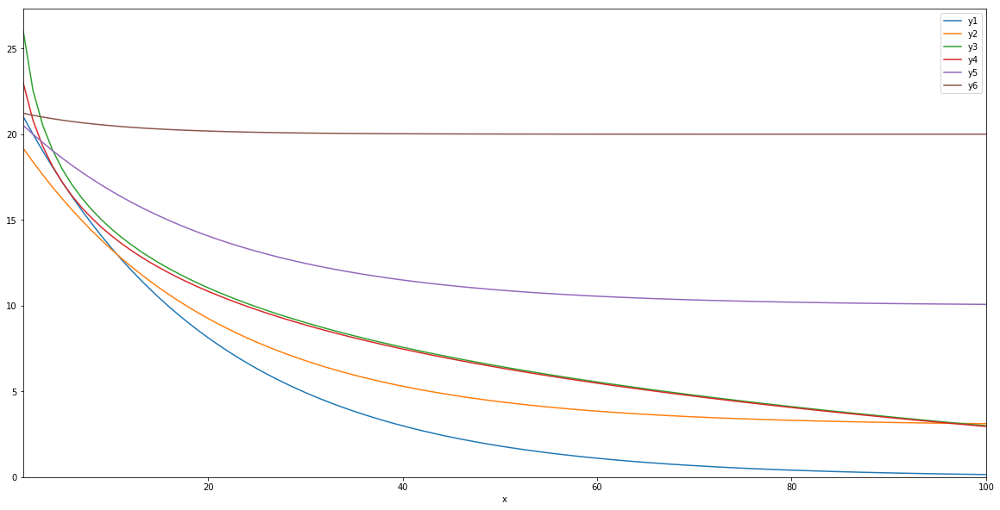

In [41]:
x= np.arange(1, 101, 1)
x2 = np.random.randn(100)*0.1
x3=x+x2

y1 = 20*np.exp(-0.05*x+0.1)
y2 = 3 + 17*np.exp(-0.05*x)
y3 = 20-5*np.log(0.3*x)
y4 = 20-5*np.log(0.3*x+0.25)
y5 = 10 + 10*np.exp(-0.05*x+0.1)
y6 = 20 + np.exp(-0.1*x+0.3)
# x,y

df = pd.DataFrame(zip(x,y1,y2,y3,y4,y5,y6),columns=['x','y1','y2','y3','y4','y5','y6'])
df.set_index('x',inplace=True)

df.plot(figsize=(20,10))
plt.ylim(0,)